# EDA for EMS Trials on Gillnet Fishing Boat for CCTV (Jan to Feb 2018) and Shellcatch Camera (Aug to Sep 2019)

In [1]:
#Importing the Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

In [2]:
# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

In [3]:
#Data Loading with Error Handling
try:
    file_path = r'D:\\Shellcatch_Trials\\EMS_CCTV_EMS_Data_Analysis\\Paper\\EMS_June_2024.xlsx'
    df = pd.read_excel(file_path, sheet_name='Sheet1')
except FileNotFoundError:
    print(f"File not found at path: {file_path}")
except Exception as e:
    print(f"An error occurred: {e}")

In [4]:
#Data Inspection
print("First few rows of the dataset:")
print(df.head())

print("\nSummary statistics:")
print(df.describe())

print("\nData types and missing values:")
print(df.info())


First few rows of the dataset:
    EMS     Observer  Boat name Boat Registration  Boat Type  \
0  CCTV  Shah Zameen  Al-Younus          BFD-12429    Launch   
1  CCTV  Shah Zameen  Al-Younus          BFD-12429    Launch   
2  CCTV  Shah Zameen  Al-Younus          BFD-12429    Launch   
3  CCTV  Shah Zameen  Al-Younus          BFD-12429    Launch   
4  CCTV  Shah Zameen  Al-Younus          BFD-12429    Launch   

  Name of Departed Port Date of Departed Port Name of Arrival Port  \
0          Karachi Port             15/1/2018         Karachi Port   
1          Karachi Port             15/1/2018         Karachi Port   
2          Karachi Port             15/1/2018         Karachi Port   
3          Karachi Port             15/1/2018         Karachi Port   
4          Karachi Port             15/1/2018         Karachi Port   

  Date of Arrival Port Total fishing duration  ...  Total Number  \
0  2018-08-02 00:00:00                24 days  ...           NaN   
1  2018-08-02 00:00:00     

In [5]:
# Display basic information about the DataFrame
#print(df.info())

In [6]:
# Display the first few rows of the DataFrame
#print(df.head())

In [7]:
# Display first 5 rows of the dataframe
df.head()

,EMS,Observer,Boat name,Boat Registration,Boat Type,Name of Departed Port,Date of Departed Port,Name of Arrival Port,Date of Arrival Port,Total fishing duration,...,Total Number,Total Weight (kg),Record of Interaction,Individual # 1 Length (cm),Individual # 2 Length (cm),Individual # 3 Length (cm),Individual # 4 Length (cm),Status at Capture,Status at Release,Status of Fish Catch
0,CCTV,Shah Zameen,Al-Younus,BFD-12429,Launch,Karachi Port,15/1/2018,Karachi Port,2018-08-02 00:00:00,24 days,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CCTV,Shah Zameen,Al-Younus,BFD-12429,Launch,Karachi Port,15/1/2018,Karachi Port,2018-08-02 00:00:00,24 days,...,16.0,64.0,Dead,49.0,83.0,63.0,0.0,Dead,None,Retained
2,CCTV,Shah Zameen,Al-Younus,BFD-12429,Launch,Karachi Port,15/1/2018,Karachi Port,2018-08-02 00:00:00,24 days,...,2.0,30.0,Dead,110.0,115.0,0.0,0.0,Dead,None,Retained
3,CCTV,Shah Zameen,Al-Younus,BFD-12429,Launch,Karachi Port,15/1/2018,Karachi Port,2018-08-02 00:00:00,24 days,...,4.0,20.0,Dead,0.0,0.0,0.0,0.0,Dead,None,Retained
4,CCTV,Shah Zameen,Al-Younus,BFD-12429,Launch,Karachi Port,15/1/2018,Karachi Port,2018-08-02 00:00:00,24 days,...,5.0,10.0,Dead,70.0,72.0,70.0,0.0,Dead,None,Retained


In [8]:
# Data Cleaning
# Check for missing values
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 EMS                           0
Observer                      0
Boat name                     0
Boat Registration             0
Boat Type                     0
Name of Departed Port         0
Date of Departed Port         0
Name of Arrival Port          0
Date of Arrival Port          0
Total fishing duration        0
No of Crew                    0
Ship Captain Name             0
Fishing Area                  2
Fishing day No.               0
Fish Catch Method             2
Fishing Gear                  2
Length of Net (km)            2
Width of Net (m)              2
No of Panels                  2
Length of Panel (km)          2
Date of Fishing               0
fishing activity              0
GPS N Start of Set Net        7
GPS End of Set Net            7
N                             7
N.1                           7
E                             7
E.1                           7
Decimal_Start_Net_N           7
Decimal_Start_Net_E           7
GPS N Start of Net Haul

In [9]:
# Check for duplicates
duplicate_rows = df[df.duplicated()]
print("Duplicate Rows:\n", duplicate_rows)

Duplicate Rows:
 Empty DataFrame
Columns: [EMS, Observer, Boat name, Boat Registration , Boat Type, Name of Departed Port, Date of Departed Port, Name of Arrival Port, Date of Arrival Port, Total fishing duration, No of Crew, Ship Captain Name, Fishing Area, Fishing day No., Fish Catch Method, Fishing Gear, Length of Net (km), Width of Net (m), No of Panels, Length of Panel (km), Date of Fishing, fishing activity, GPS N Start of Set Net, GPS End of Set Net, N, N.1, E, E.1, Decimal_Start_Net_N, Decimal_Start_Net_E, GPS N Start of Net Haul, GPS E End of Net Haul, Fish Category, Spp., Fish Types, Total Number, Total Weight (kg), Record of Interaction, Individual # 1 Length (cm), Individual # 2 Length (cm), Individual # 3 Length (cm), Individual # 4 Length (cm), Status at Capture, Status at Release, Status of Fish Catch]
Index: []

[0 rows x 45 columns]


# Percentage Of Overall Fish Categories And Species (Spp.) for CCTV and Shelcatch

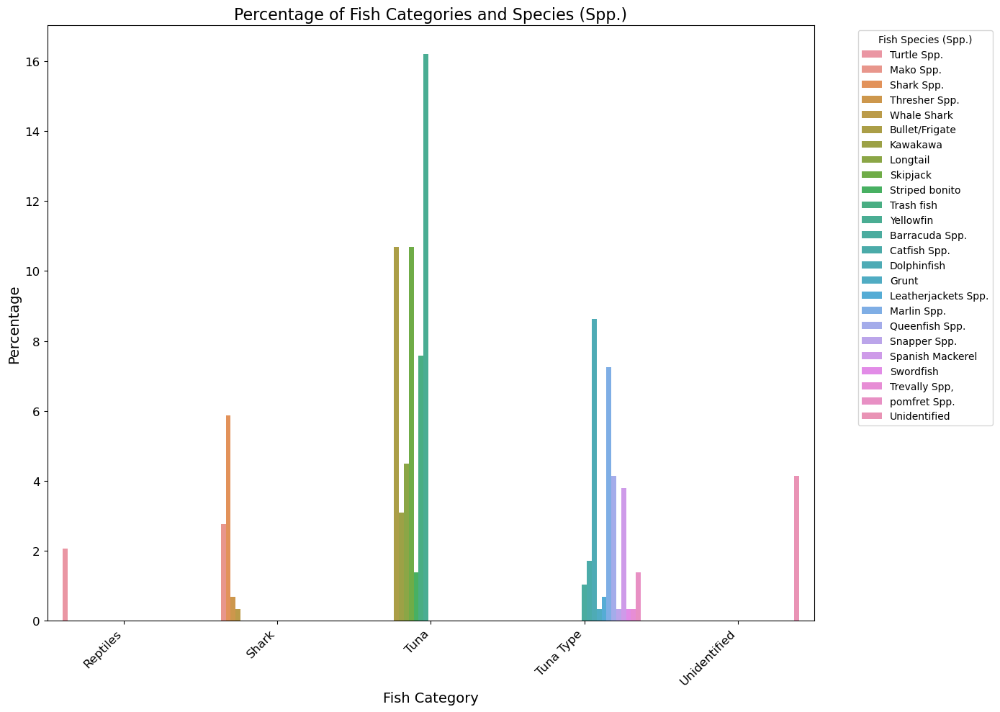

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Drop rows with NaN values in the 'Spp.' and 'Fish Category' columns
df = df.dropna(subset=['Spp.', 'Fish Category'])

# Prepare the data
df_grouped = df.groupby(['Fish Category', 'Spp.']).size().reset_index(name='Counts')
df_grouped['Percentage'] = (df_grouped['Counts'] / df_grouped['Counts'].sum()) * 100

# Create a figure
plt.figure(figsize=(14, 10))

# Create a bar plot with Fish Category and Spp.
sns.barplot(x='Fish Category', y='Percentage', hue='Spp.', data=df_grouped, dodge=True)

# Customize the plot
plt.title('Percentage of Fish Categories and Species (Spp.)', fontsize=16)
plt.xlabel('Fish Category', fontsize=14)
plt.ylabel('Percentage', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


# Monthly Timeline of Overall Fish Species (Spp.) Catches for CCTV and Shellcatch

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\2406445422.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline['Month'] = df_timeline['Date of Fishing'].dt.to_period('M')


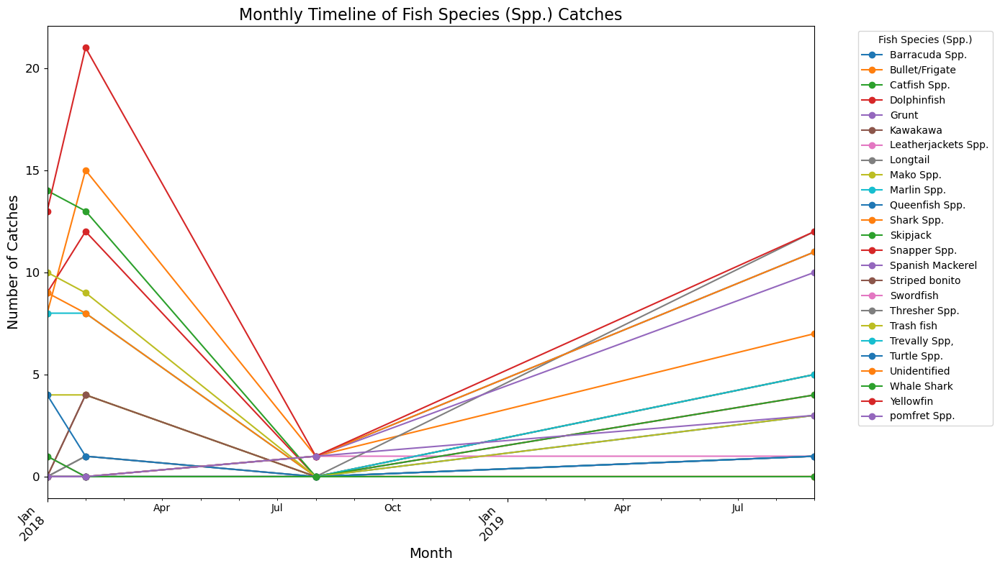

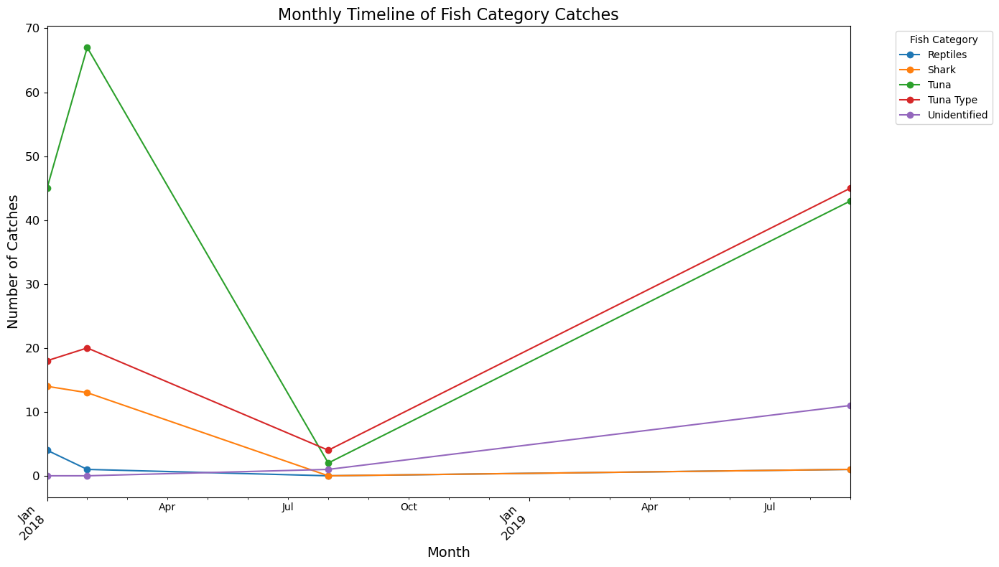

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', and 'Fish Category'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category'])

# Add a 'Month' column
df_timeline['Month'] = df_timeline['Date of Fishing'].dt.to_period('M')

# Group by month and species, then count occurrences
timeline_data_spp = df_timeline.groupby(['Month', 'Spp.']).size().reset_index(name='Counts')
timeline_pivot_spp = timeline_data_spp.pivot(index='Month', columns='Spp.', values='Counts').fillna(0)

# Plot the timeline graph for Spp.
plt.figure(figsize=(14, 8))
timeline_pivot_spp.plot(ax=plt.gca(), marker='o')
plt.title('Monthly Timeline of Fish Species (Spp.) Catches', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Number of Catches', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Group by month and fish category, then count occurrences
timeline_data_category = df_timeline.groupby(['Month', 'Fish Category']).size().reset_index(name='Counts')
timeline_pivot_category = timeline_data_category.pivot(index='Month', columns='Fish Category', values='Counts').fillna(0)

# Plot the timeline graph for Fish Category
plt.figure(figsize=(14, 8))
timeline_pivot_category.plot(ax=plt.gca(), marker='o')
plt.title('Monthly Timeline of Fish Category Catches', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Number of Catches', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# Monthly Timeline Of Fish Species (Spp.) Catches and Monthly Timeline Of Fish Category Catches - CCTV and Shellcatch 

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\26221864.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline['Month'] = df_timeline['Date of Fishing'].dt.to_period('M')


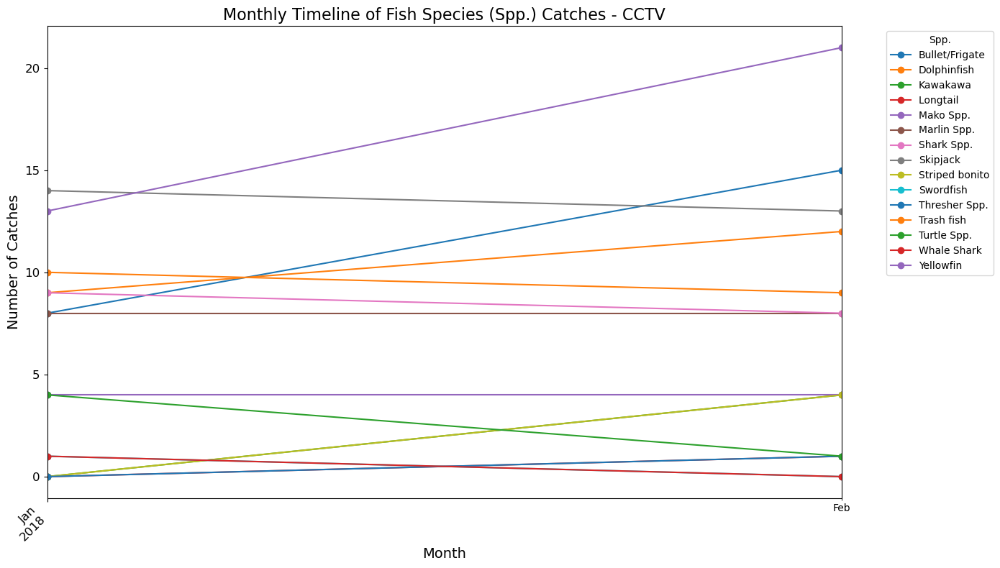

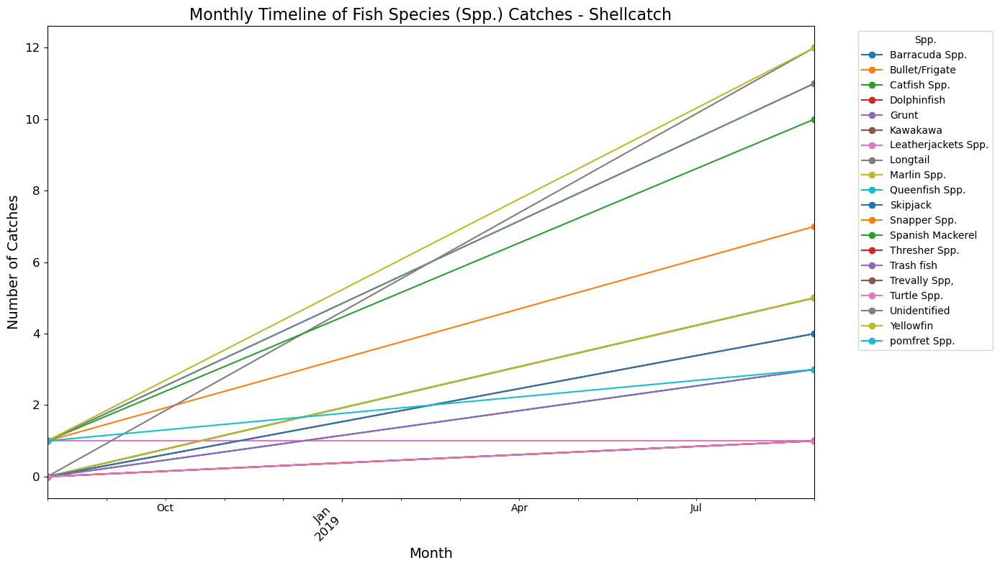

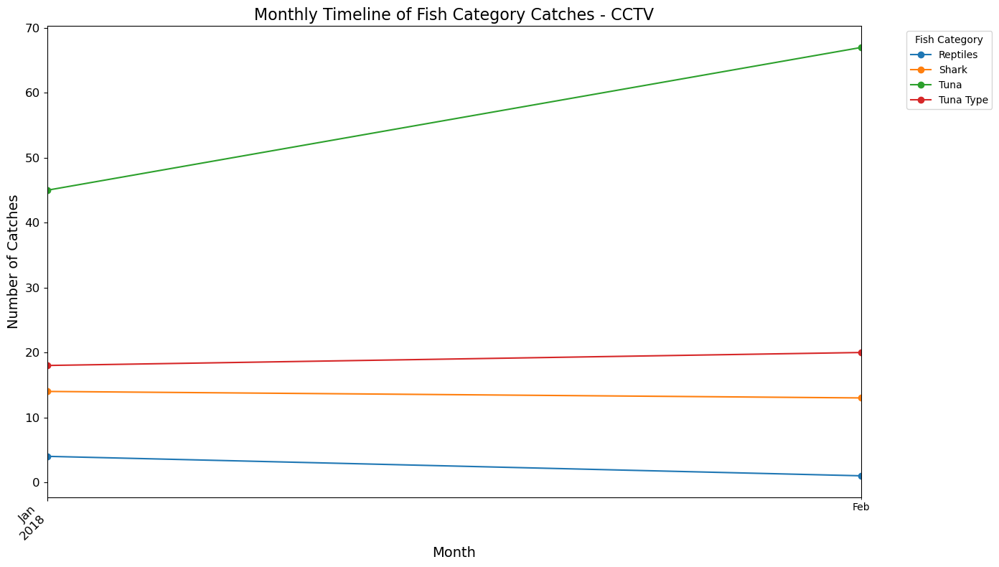

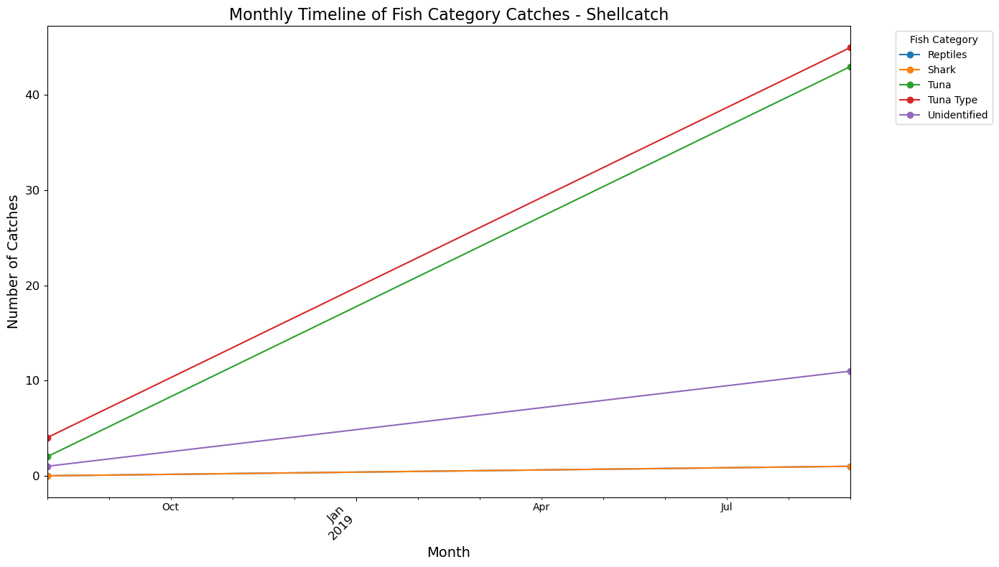

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', and 'Fish Category'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category'])

# Add a 'Month' column
df_timeline['Month'] = df_timeline['Date of Fishing'].dt.to_period('M')

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot the timeline graph
def plot_timeline(data, group_col, title):
    timeline_data = data.groupby(['Month', group_col]).size().reset_index(name='Counts')
    timeline_pivot = timeline_data.pivot(index='Month', columns=group_col, values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    timeline_pivot.plot(ax=plt.gca(), marker='o')
    plt.title(title, fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Number of Catches', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title=group_col, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Plot for Fish Species (Spp.) - CCTV
plot_timeline(df_cctv, 'Spp.', 'Monthly Timeline of Fish Species (Spp.) Catches - CCTV')

# Plot for Fish Species (Spp.) - Shellcatch
plot_timeline(df_shellcatch, 'Spp.', 'Monthly Timeline of Fish Species (Spp.) Catches - Shellcatch')

# Plot for Fish Category - CCTV
plot_timeline(df_cctv, 'Fish Category', 'Monthly Timeline of Fish Category Catches - CCTV')

# Plot for Fish Category - Shellcatch
plot_timeline(df_shellcatch, 'Fish Category', 'Monthly Timeline of Fish Category Catches - Shellcatch')


# The percentage graphs for Fish Category and Spp. separately for CCTV and Shellcatch

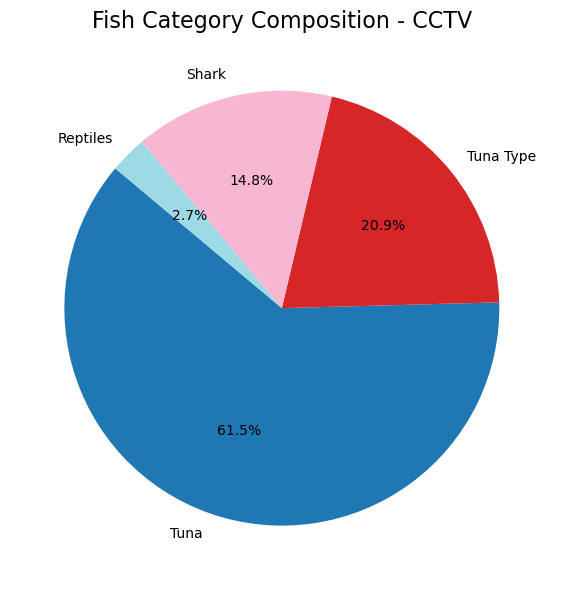

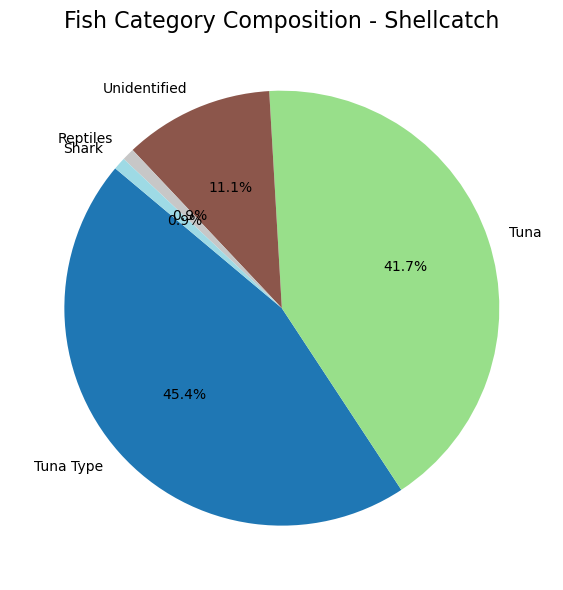

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Fish Category', and 'Spp.'
df_cleaned = df.dropna(subset=['Date of Fishing', 'Fish Category', 'Spp.'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_cleaned[df_cleaned['EMS'] == 'CCTV']
df_shellcatch = df_cleaned[df_cleaned['EMS'] == 'Shellcatch']

# Function to plot pie chart for species composition
def plot_category_composition(data, title):
    category_counts = data['Fish Category'].value_counts()
    
    plt.figure(figsize=(10, 6))
    category_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colormap='tab20')
    plt.title(title, fontsize=16)
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

# Plot category composition for CCTV
plot_category_composition(df_cctv, 'Fish Category Composition - CCTV')

# Plot category composition for Shellcatch
plot_category_composition(df_shellcatch, 'Fish Category Composition - Shellcatch')


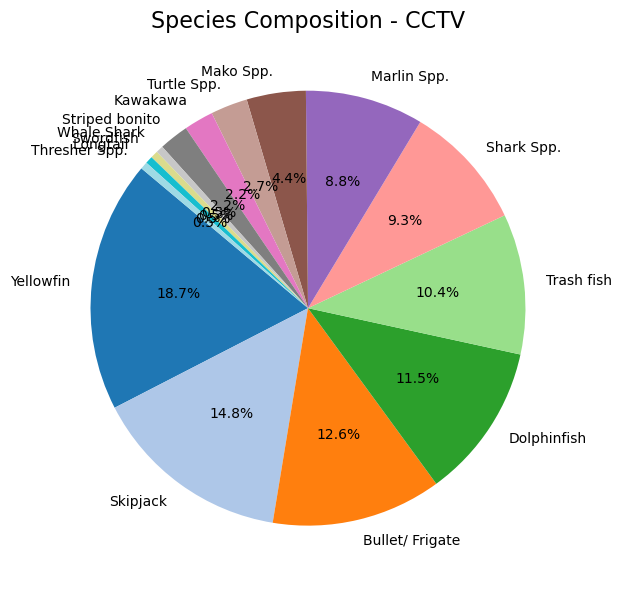

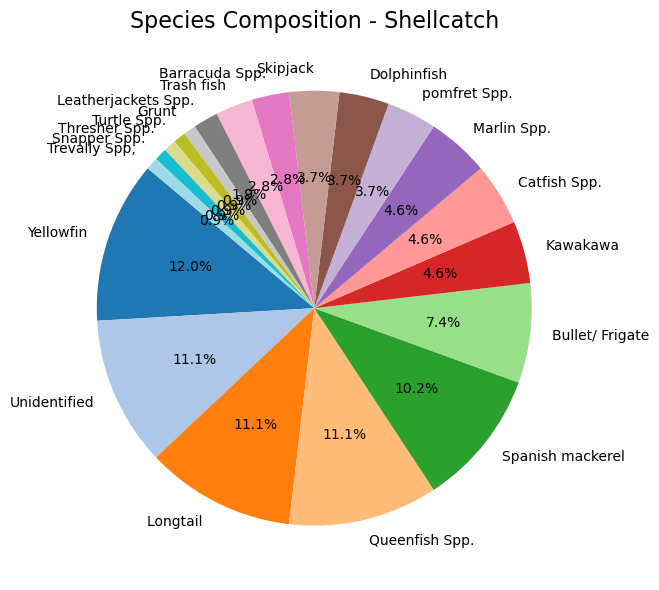

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Fish Category', and 'Spp.'
df_cleaned = df.dropna(subset=['Date of Fishing', 'Fish Category', 'Spp.'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_cleaned[df_cleaned['EMS'] == 'CCTV']
df_shellcatch = df_cleaned[df_cleaned['EMS'] == 'Shellcatch']

# Function to plot pie chart for species composition
def plot_species_composition(data, title):
    species_counts = data['Spp.'].value_counts()
    
    plt.figure(figsize=(10, 6))
    species_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, colormap='tab20')
    plt.title(title, fontsize=16)
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

# Plot species composition for CCTV
plot_species_composition(df_cctv, 'Species Composition - CCTV')

# Plot species composition for Shellcatch
plot_species_composition(df_shellcatch, 'Species Composition - Shellcatch')


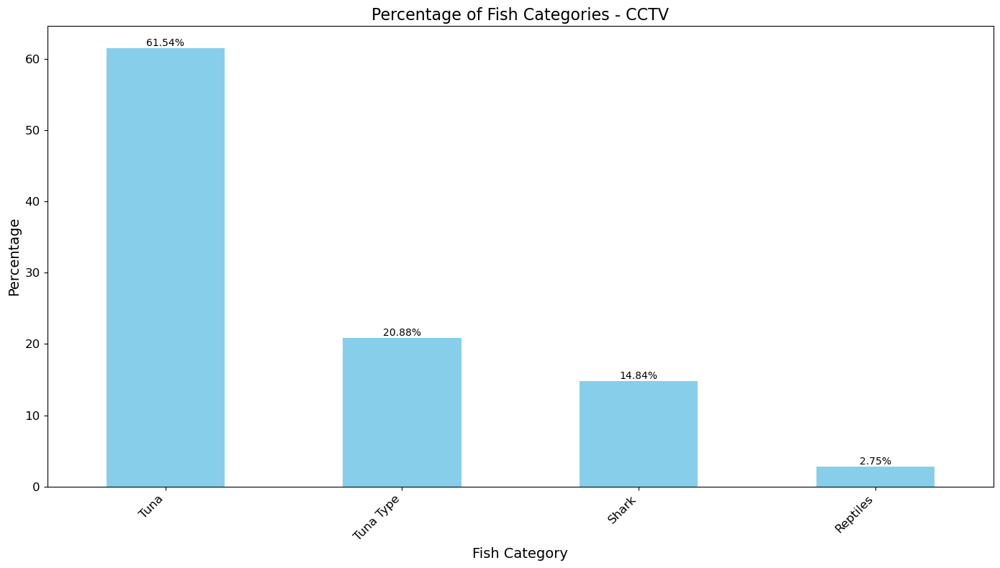

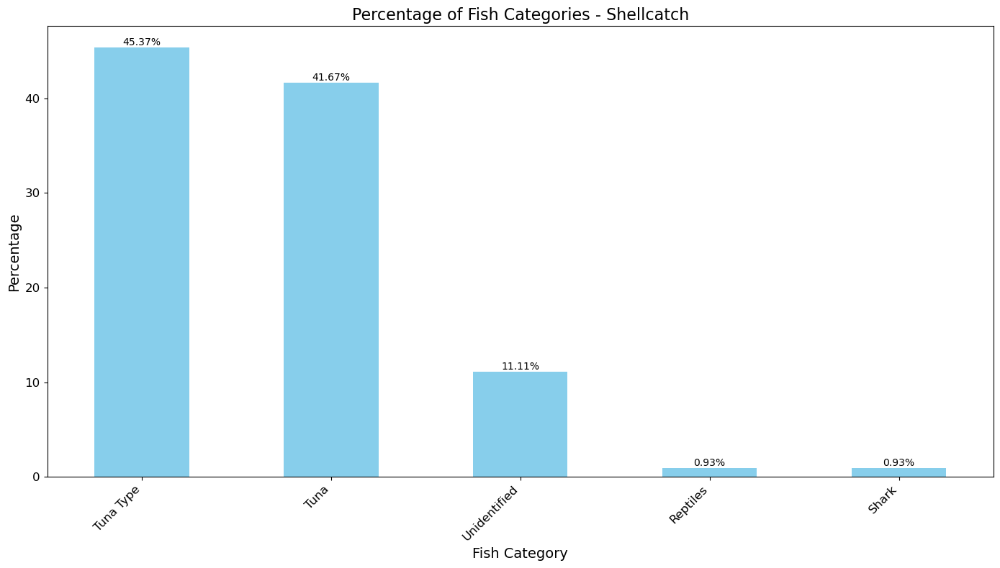

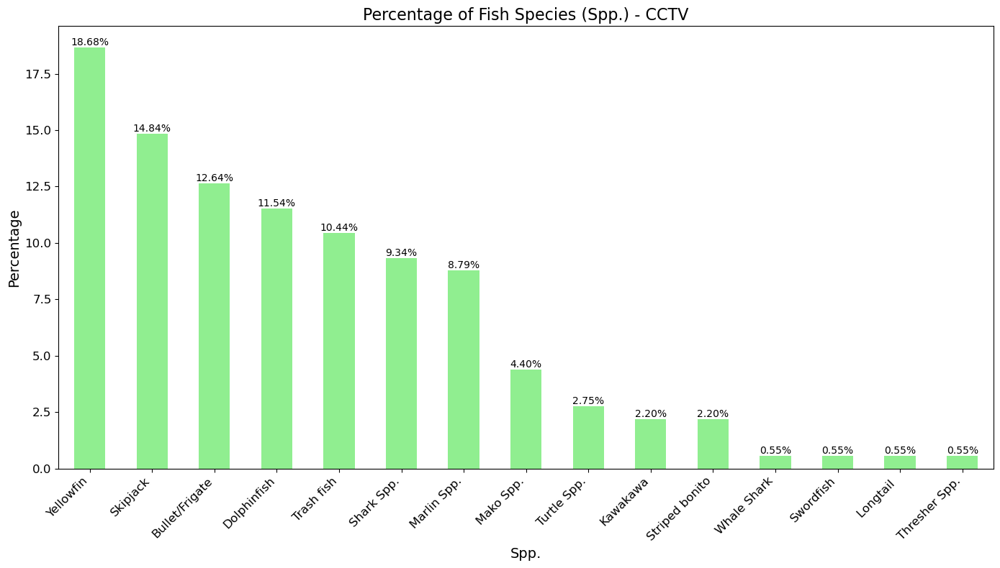

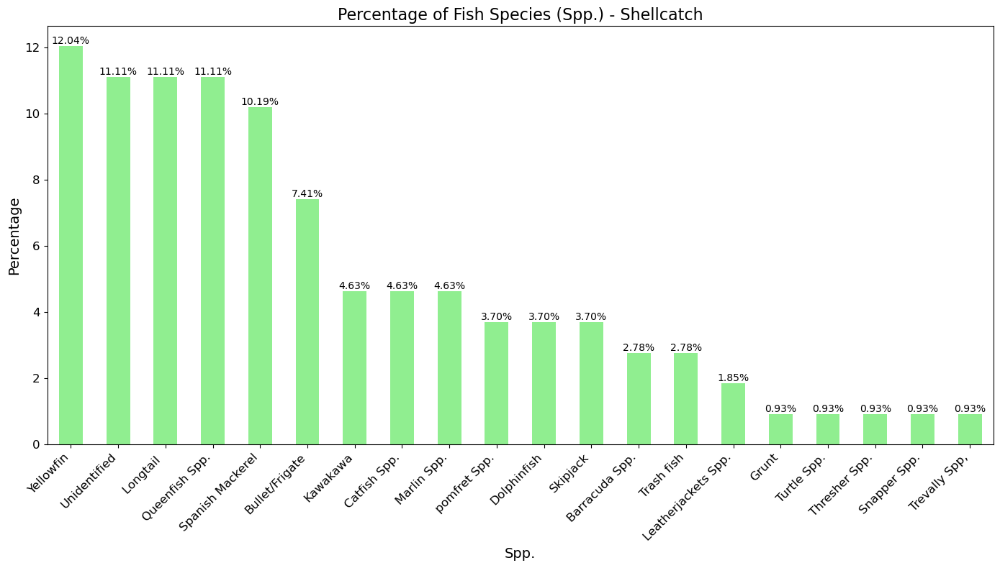

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', and 'Fish Category'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot percentage graph with data labels
def plot_percentage_with_labels(data, group_col, title, color):
    category_counts = data[group_col].value_counts()
    category_percentage = (category_counts / category_counts.sum()) * 100

    plt.figure(figsize=(14, 8))
    bars = category_percentage.plot(kind='bar', color=color)
    plt.title(title, fontsize=16)
    plt.xlabel(group_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)

    for bar in bars.patches:
        height = bar.get_height()
        bars.annotate(f'{height:.2f}%',
                      (bar.get_x() + bar.get_width() / 2, height),
                      ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()

# Plot percentage for Fish Category - CCTV
plot_percentage_with_labels(df_cctv, 'Fish Category', 'Percentage of Fish Categories - CCTV', 'skyblue')

# Plot percentage for Fish Category - Shellcatch
plot_percentage_with_labels(df_shellcatch, 'Fish Category', 'Percentage of Fish Categories - Shellcatch', 'skyblue')

# Plot percentage for Fish Species (Spp.) - CCTV
plot_percentage_with_labels(df_cctv, 'Spp.', 'Percentage of Fish Species (Spp.) - CCTV', 'lightgreen')

# Plot percentage for Fish Species (Spp.) - Shellcatch
plot_percentage_with_labels(df_shellcatch, 'Spp.', 'Percentage of Fish Species (Spp.) - Shellcatch', 'lightgreen')


# Record of Interaction

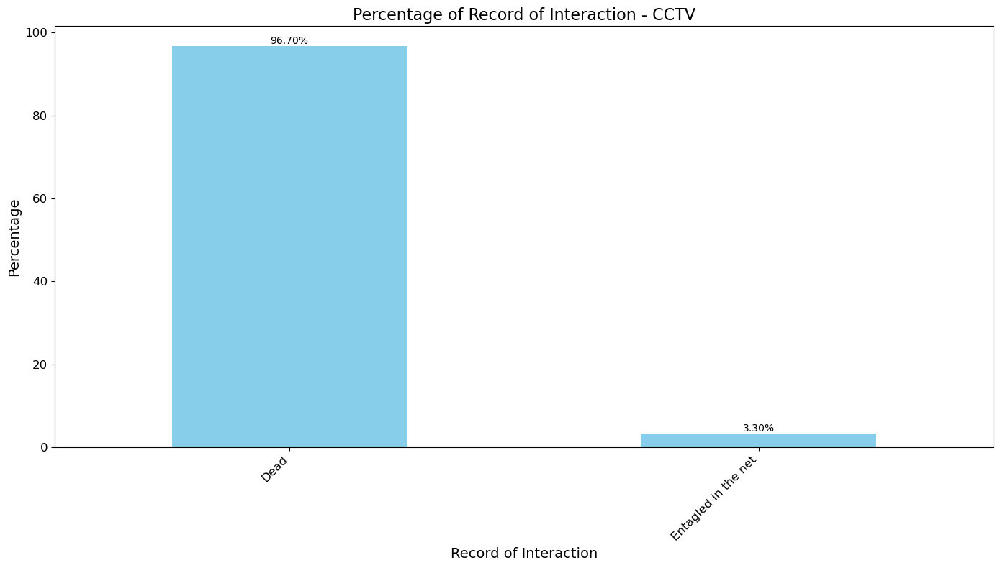

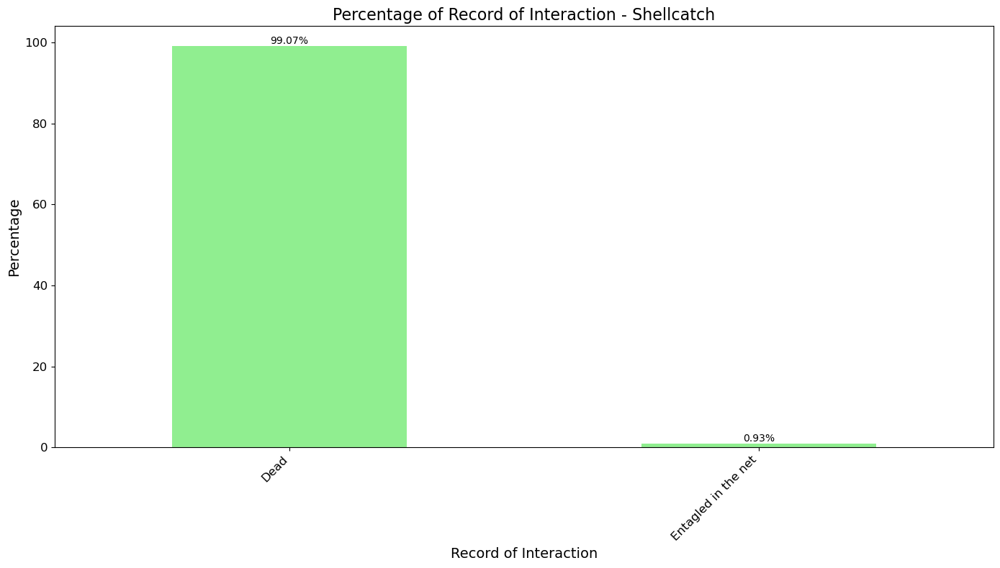

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\734844373.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(df_cctv['Spp.'].unique())).colors


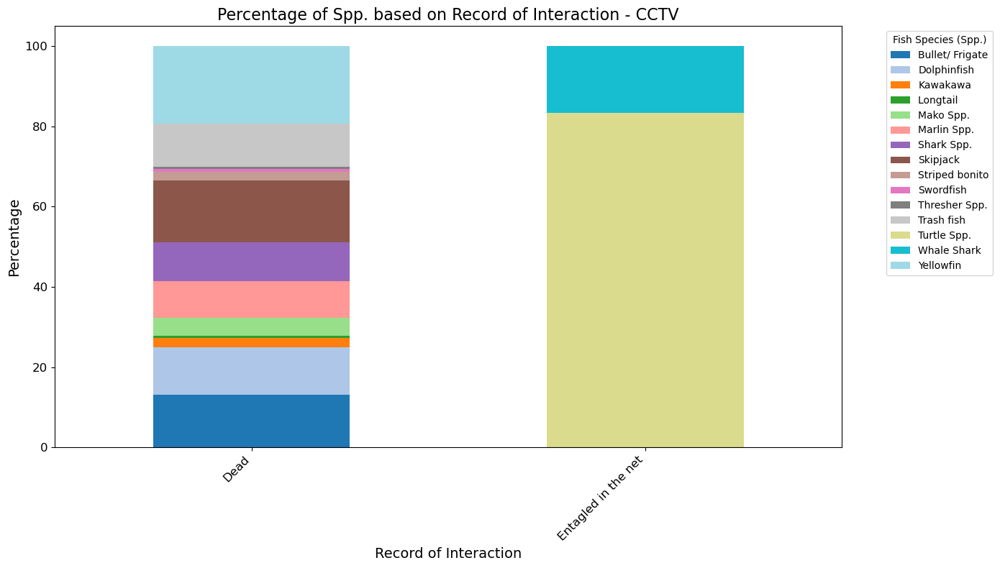

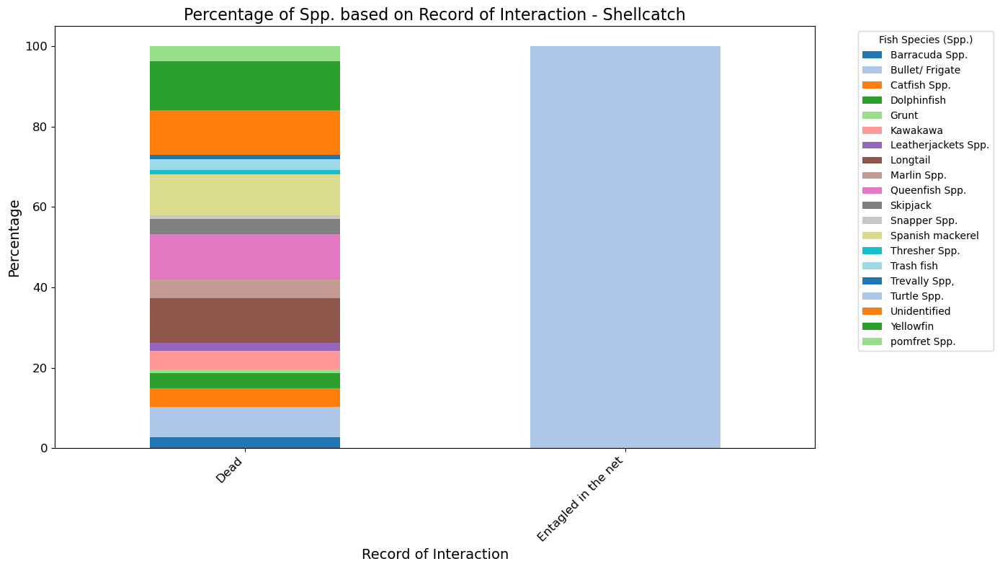

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Record of Interaction'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Record of Interaction'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot percentage graph with data labels based on Record of Interaction
def plot_interaction_percentage(data, title, save_path, color):
    interaction_counts = data['Record of Interaction'].value_counts()
    interaction_percentage = (interaction_counts / interaction_counts.sum()) * 100

    plt.figure(figsize=(14, 8))
    bars = interaction_percentage.plot(kind='bar', color=color)
    plt.title(title, fontsize=16)
    plt.xlabel('Record of Interaction', fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)

    for bar in bars.patches:
        height = bar.get_height()
        bars.annotate(f'{height:.2f}%',
                      (bar.get_x() + bar.get_width() / 2, height),
                      ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# Plot percentage for Record of Interaction - CCTV
plot_interaction_percentage(df_cctv, 'Percentage of Record of Interaction - CCTV', r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\percentage_interaction_cctv.png', 'skyblue')

# Plot percentage for Record of Interaction - Shellcatch
plot_interaction_percentage(df_shellcatch, 'Percentage of Record of Interaction - Shellcatch', r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\percentage_interaction_shellcatch.png', 'lightgreen')

# Function to plot Spp. percentage graph based on Record of Interaction
def plot_spp_interaction_percentage(data, interaction_col, title, save_path, color):
    interaction_data = data.groupby([interaction_col, 'Spp.']).size().reset_index(name='Counts')
    interaction_pivot = interaction_data.pivot(index=interaction_col, columns='Spp.', values='Counts').fillna(0)
    interaction_percentage = (interaction_pivot.div(interaction_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    interaction_percentage.plot(kind='bar', stacked=True, color=color, ax=plt.gca())
    plt.title(title, fontsize=16)
    plt.xlabel('Record of Interaction', fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# Generate a list of colors
colors = plt.cm.get_cmap('tab20', len(df_cctv['Spp.'].unique())).colors

# Plot Spp. percentage based on Record of Interaction - CCTV
plot_spp_interaction_percentage(df_cctv, 'Record of Interaction', 'Percentage of Spp. based on Record of Interaction - CCTV', r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\spp_interaction_cctv.png', colors)

# Plot Spp. percentage based on Record of Interaction - Shellcatch
plot_spp_interaction_percentage(df_shellcatch, 'Record of Interaction', 'Percentage of Spp. based on Record of Interaction - Shellcatch', r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\spp_interaction_shellcatch.png', colors)


# Record of Interaction

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3242396027.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_cctv = plt.cm.get_cmap('tab20', len(df_cctv['Spp.'].unique())).colors
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3242396027.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors_shellcatch = plt.cm.get_cmap('tab20', len(df_shellcatch['Spp.'].unique())).colors


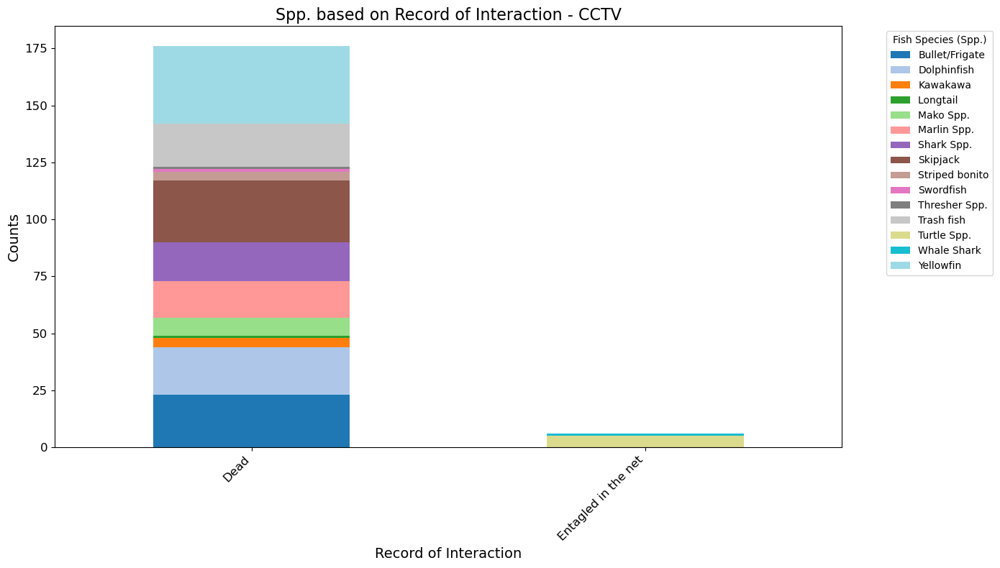

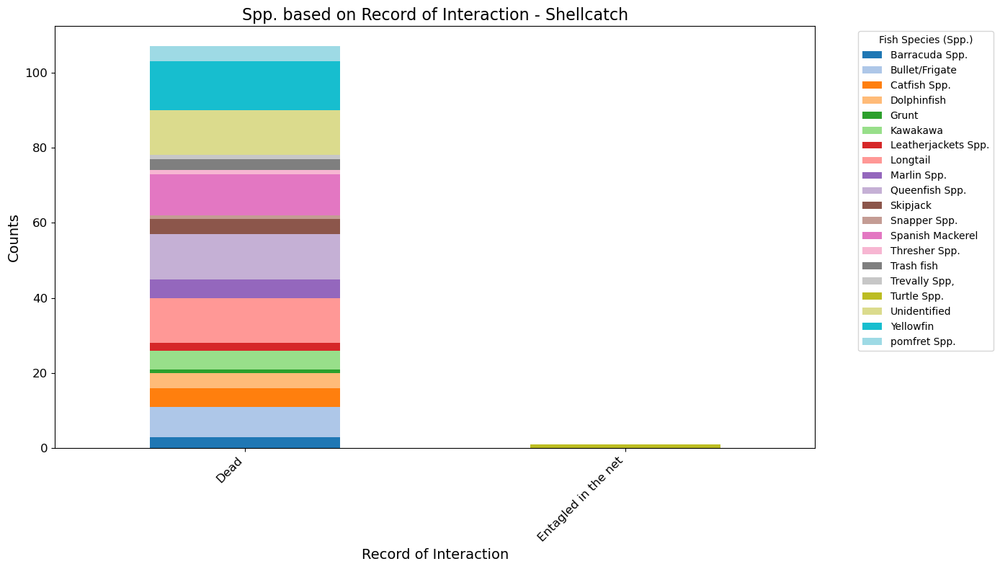

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Record of Interaction'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Record of Interaction'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Filter data based on 'Record of Interaction' for CCTV and Shellcatch
df_cctv_interaction = df_cctv.dropna(subset=['Record of Interaction'])
df_shellcatch_interaction = df_shellcatch.dropna(subset=['Record of Interaction'])

# Function to plot Spp. percentage graph based on Record of Interaction
def plot_spp_interaction(data, interaction_col, title, colors):
    interaction_data = data.groupby([interaction_col, 'Spp.']).size().reset_index(name='Counts')
    interaction_pivot = interaction_data.pivot(index=interaction_col, columns='Spp.', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    interaction_pivot.plot(kind='bar', stacked=True, color=colors, ax=plt.gca())
    plt.title(title, fontsize=16)
    plt.xlabel(interaction_col, fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Generate a list of colors
colors_cctv = plt.cm.get_cmap('tab20', len(df_cctv['Spp.'].unique())).colors
colors_shellcatch = plt.cm.get_cmap('tab20', len(df_shellcatch['Spp.'].unique())).colors

# Plot Spp. based on Record of Interaction - CCTV
plot_spp_interaction(df_cctv_interaction, 'Record of Interaction', 'Spp. based on Record of Interaction - CCTV', colors_cctv)

# Plot Spp. based on Record of Interaction - Shellcatch
plot_spp_interaction(df_shellcatch_interaction, 'Record of Interaction', 'Spp. based on Record of Interaction - Shellcatch', colors_shellcatch)


# Fish Category Record of Interaction separately for CCTV and Shellcatch 

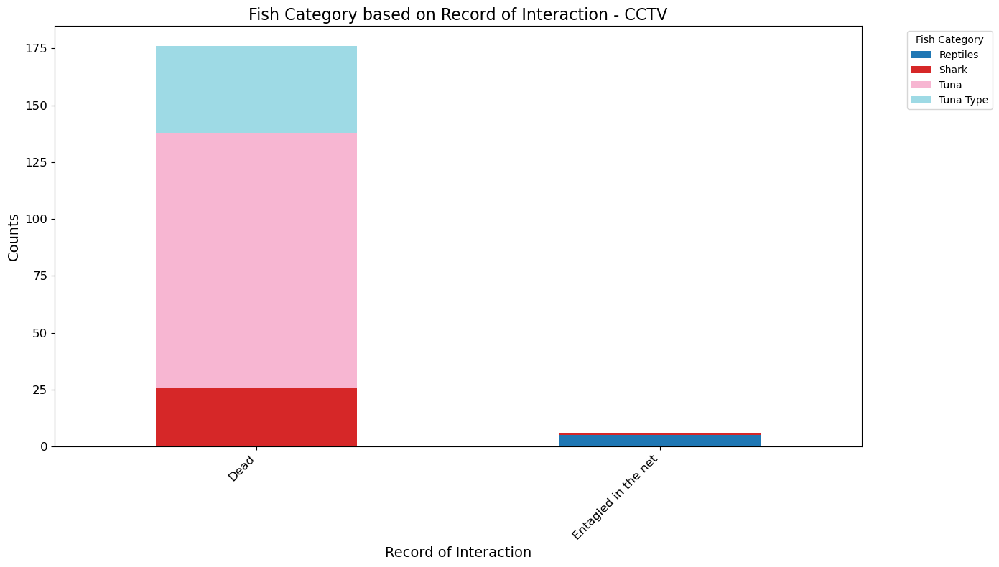

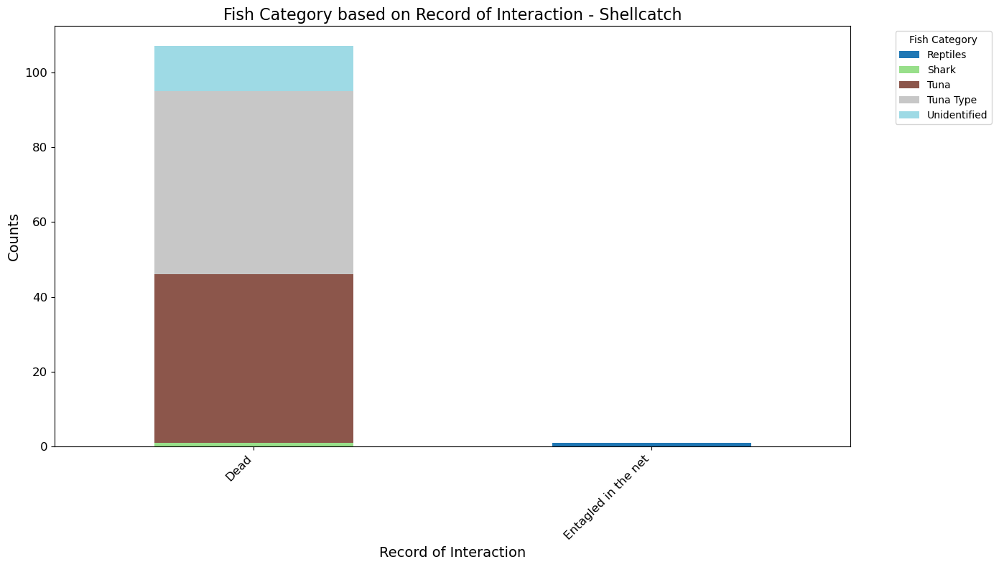

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Record of Interaction'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Record of Interaction'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Filter data based on 'Record of Interaction' for CCTV and Shellcatch
df_cctv_interaction = df_cctv.dropna(subset=['Record of Interaction'])
df_shellcatch_interaction = df_shellcatch.dropna(subset=['Record of Interaction'])

# Function to plot Fish Category graph based on Record of Interaction
def plot_category_interaction(data, interaction_col, title):
    interaction_data = data.groupby([interaction_col, 'Fish Category']).size().reset_index(name='Counts')
    interaction_pivot = interaction_data.pivot(index=interaction_col, columns='Fish Category', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    interaction_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel('Record of Interaction', fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot Fish Category based on Record of Interaction - CCTV
plot_category_interaction(df_cctv_interaction, 'Record of Interaction', 'Fish Category based on Record of Interaction - CCTV')

# Plot Fish Category based on Record of Interaction - Shellcatch
plot_category_interaction(df_shellcatch_interaction, 'Record of Interaction', 'Fish Category based on Record of Interaction - Shellcatch')


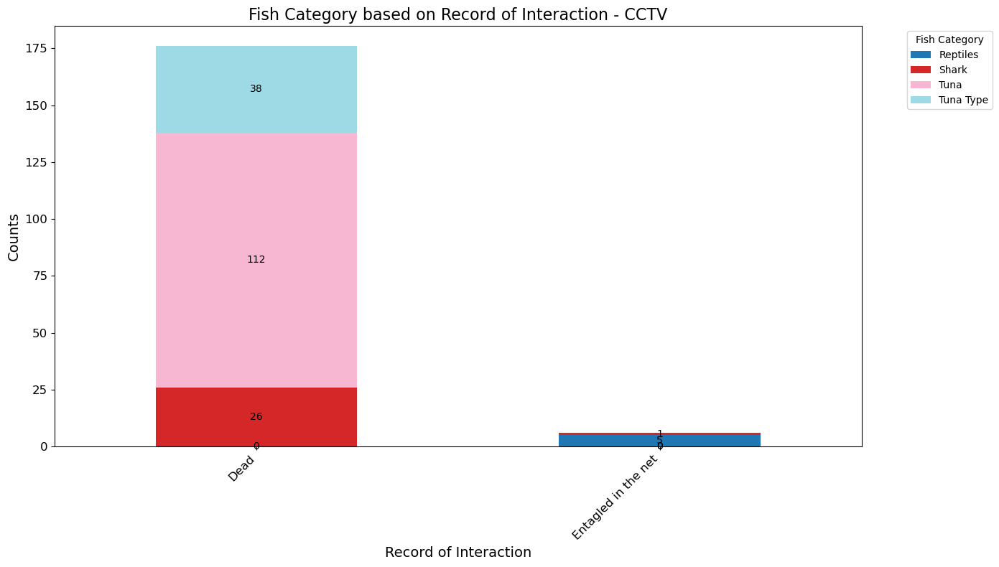

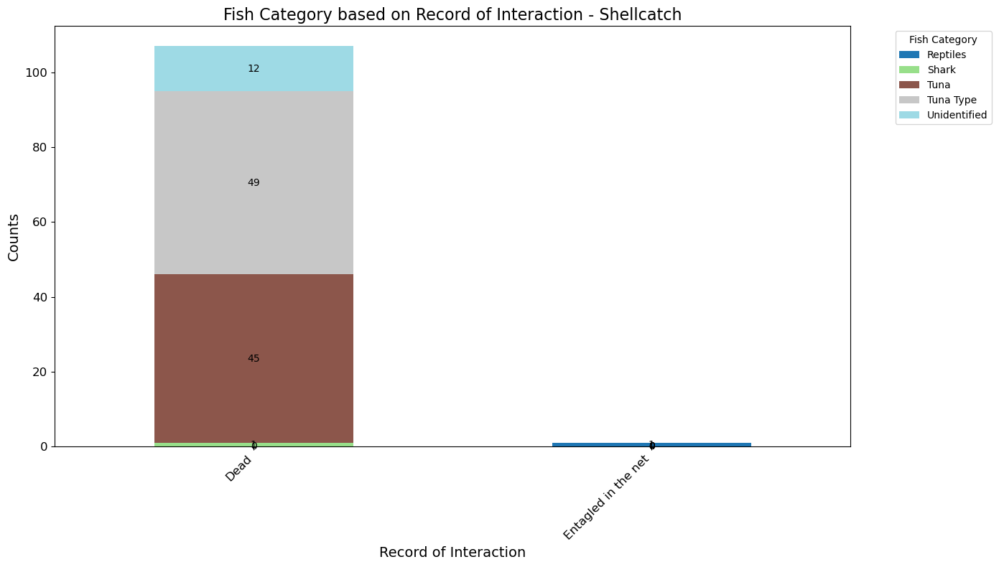

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Record of Interaction'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Record of Interaction'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Filter data based on 'Record of Interaction' for CCTV and Shellcatch
df_cctv_interaction = df_cctv.dropna(subset=['Record of Interaction'])
df_shellcatch_interaction = df_shellcatch.dropna(subset=['Record of Interaction'])

# Function to plot Fish Category graph based on Record of Interaction with data labels
def plot_category_interaction_with_labels(data, interaction_col, title):
    interaction_data = data.groupby([interaction_col, 'Fish Category']).size().reset_index(name='Counts')
    interaction_pivot = interaction_data.pivot(index=interaction_col, columns='Fish Category', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = interaction_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel('Record of Interaction', fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.0f')
    
    plt.tight_layout()
    plt.show()

# Plot Fish Category based on Record of Interaction - CCTV with data labels
plot_category_interaction_with_labels(df_cctv_interaction, 'Record of Interaction', 'Fish Category based on Record of Interaction - CCTV')

# Plot Fish Category based on Record of Interaction - Shellcatch with data labels
plot_category_interaction_with_labels(df_shellcatch_interaction, 'Record of Interaction', 'Fish Category based on Record of Interaction - Shellcatch')


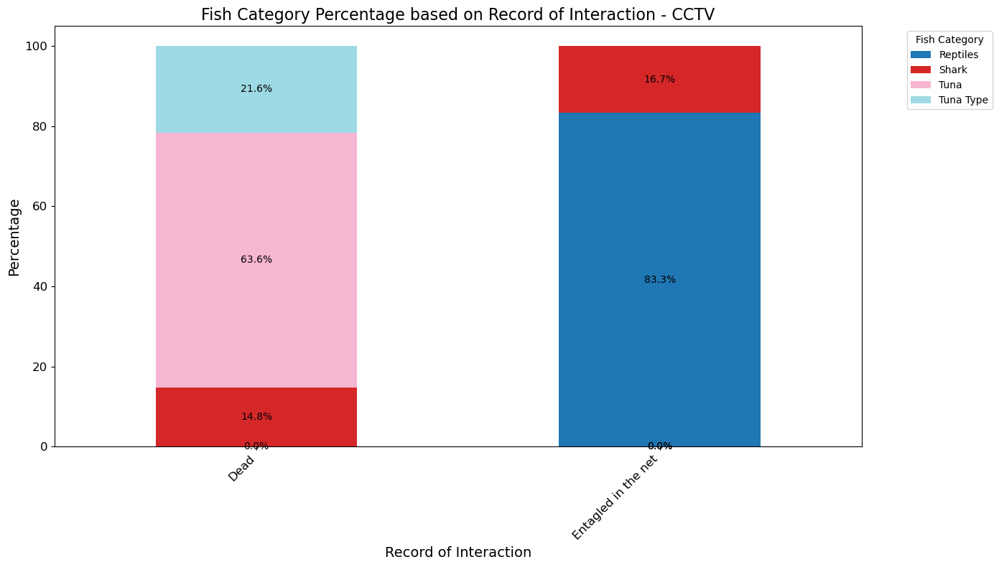

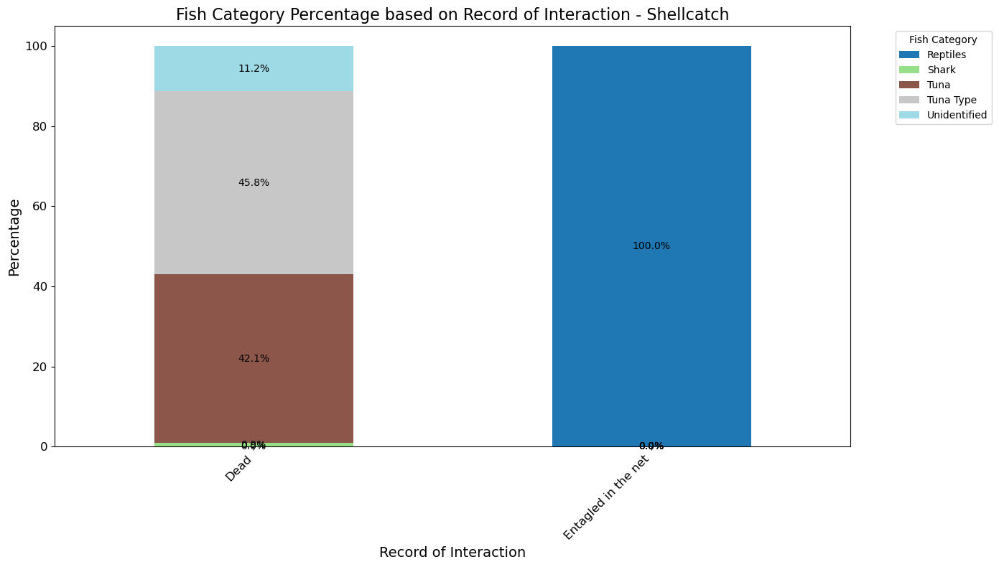

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Record of Interaction'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Record of Interaction'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Filter data based on 'Record of Interaction' for CCTV and Shellcatch
df_cctv_interaction = df_cctv.dropna(subset=['Record of Interaction'])
df_shellcatch_interaction = df_shellcatch.dropna(subset=['Record of Interaction'])

# Function to plot Fish Category percentage graph based on Record of Interaction with data labels
def plot_category_percentage_with_labels(data, interaction_col, title):
    interaction_data = data.groupby([interaction_col, 'Fish Category']).size().reset_index(name='Counts')
    interaction_pivot = interaction_data.pivot(index=interaction_col, columns='Fish Category', values='Counts').fillna(0)
    interaction_percentage = (interaction_pivot.div(interaction_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = interaction_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel('Record of Interaction', fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.1f%%')
    
    plt.tight_layout()
    plt.show()

# Plot Fish Category percentage based on Record of Interaction - CCTV with data labels
plot_category_percentage_with_labels(df_cctv_interaction, 'Record of Interaction', 'Fish Category Percentage based on Record of Interaction - CCTV')

# Plot Fish Category percentage based on Record of Interaction - Shellcatch with data labels
plot_category_percentage_with_labels(df_shellcatch_interaction, 'Record of Interaction', 'Fish Category Percentage based on Record of Interaction - Shellcatch')


# Spp. column based on the columns of Status at Release and Status of Fish Catch

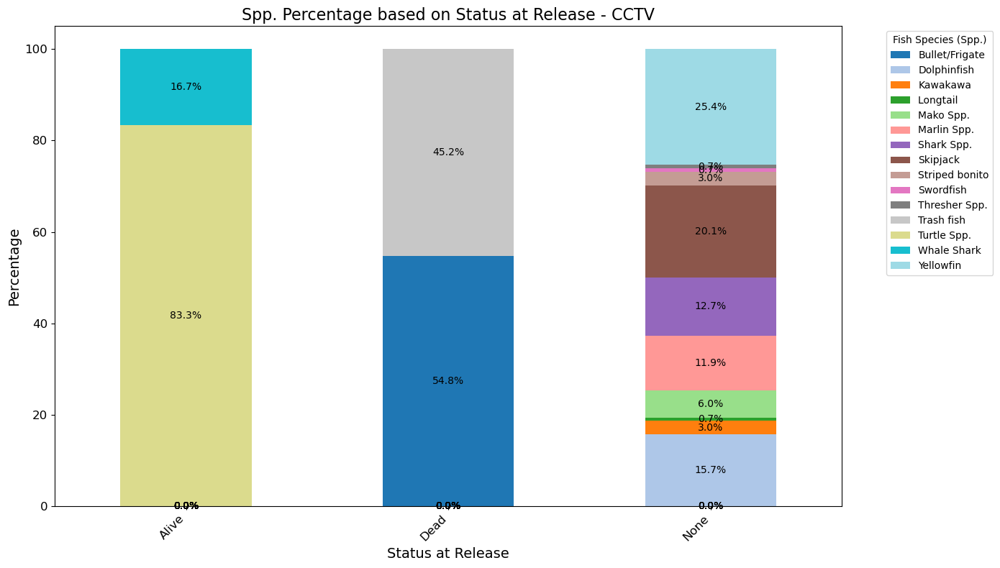

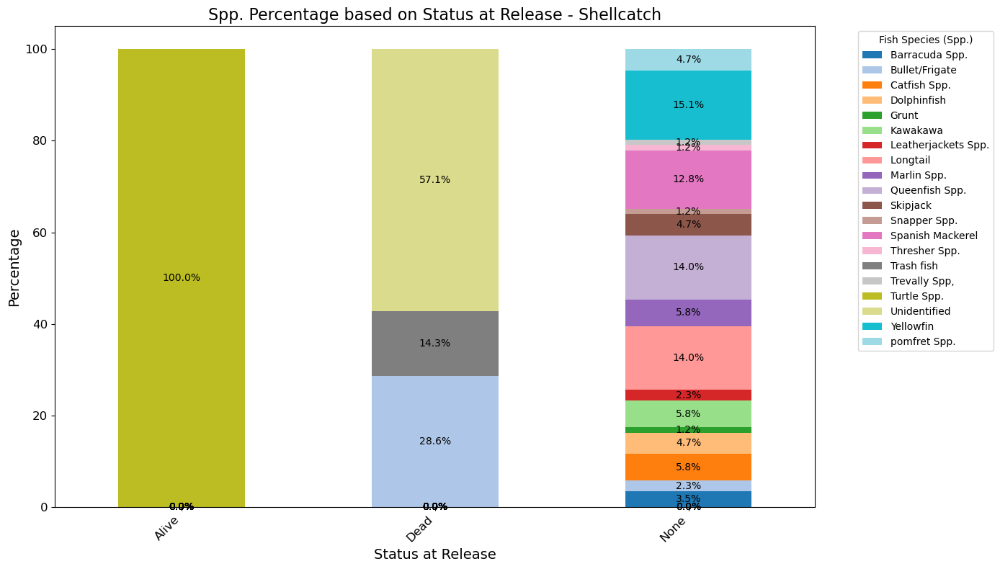

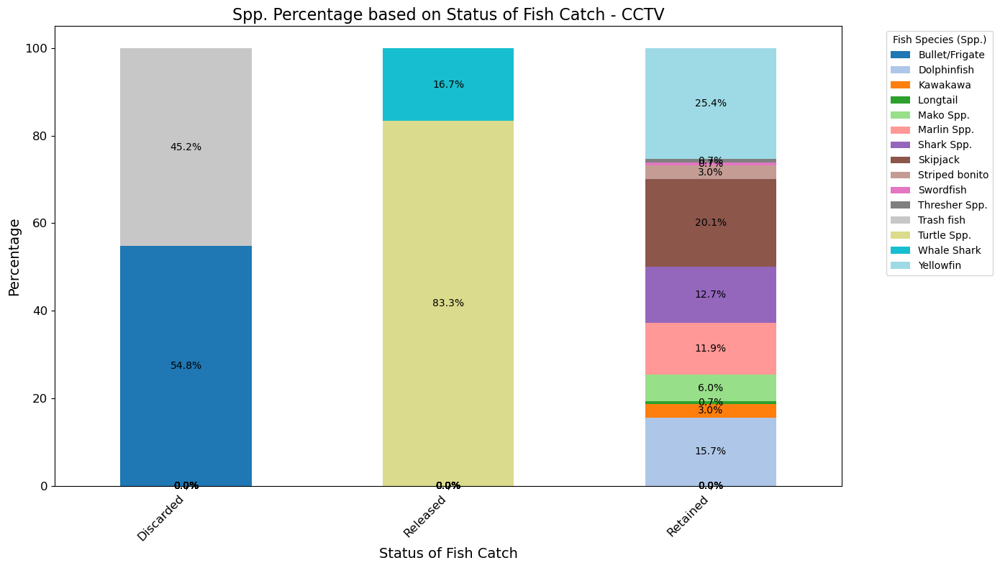

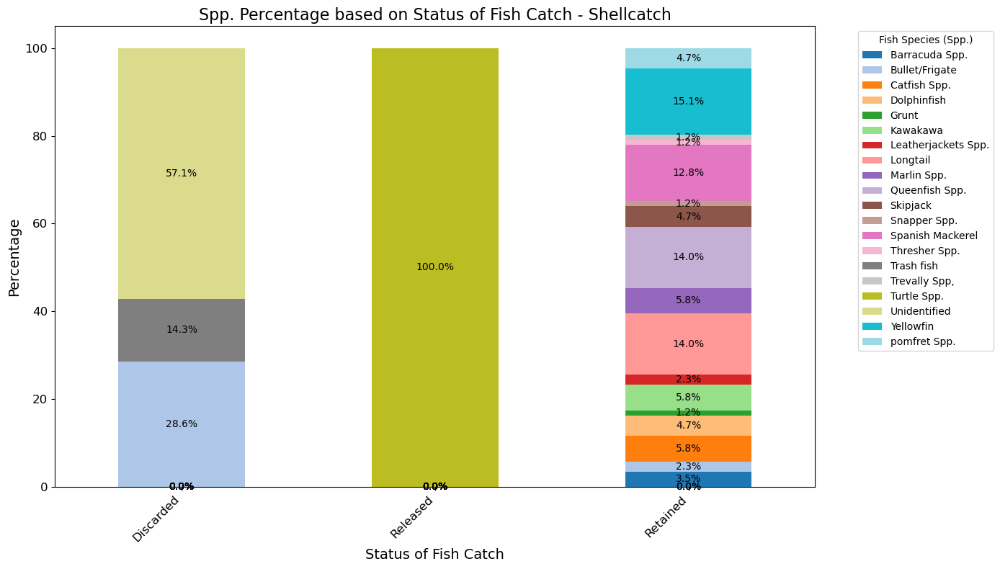

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Release', and 'Status of Fish Catch'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Release', 'Status of Fish Catch'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. based on a given status column with data labels
def plot_spp_status_with_labels(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.1f%%')
    
    plt.tight_layout()
    plt.show()

# Plot Spp. based on Status at Release - CCTV
plot_spp_status_with_labels(df_cctv, 'Status at Release', 'Spp. Percentage based on Status at Release - CCTV')

# Plot Spp. based on Status at Release - Shellcatch
plot_spp_status_with_labels(df_shellcatch, 'Status at Release', 'Spp. Percentage based on Status at Release - Shellcatch')

# Plot Spp. based on Status of Fish Catch - CCTV
plot_spp_status_with_labels(df_cctv, 'Status of Fish Catch', 'Spp. Percentage based on Status of Fish Catch - CCTV')

# Plot Spp. based on Status of Fish Catch - Shellcatch
plot_spp_status_with_labels(df_shellcatch, 'Status of Fish Catch', 'Spp. Percentage based on Status of Fish Catch - Shellcatch')


# count graphs using Spp. column based on the columns of Status at Capture, separately for CCTV and Shellcatch 

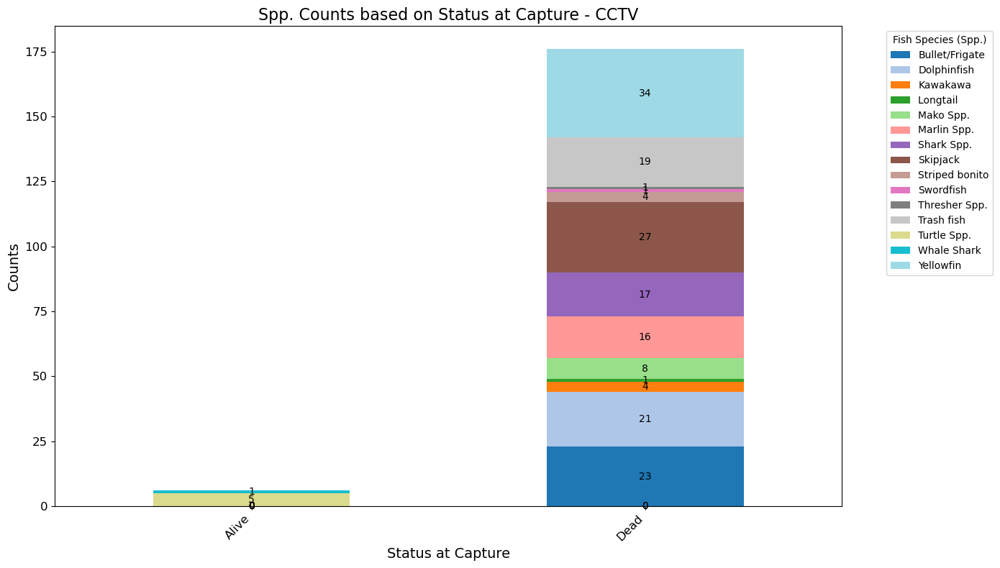

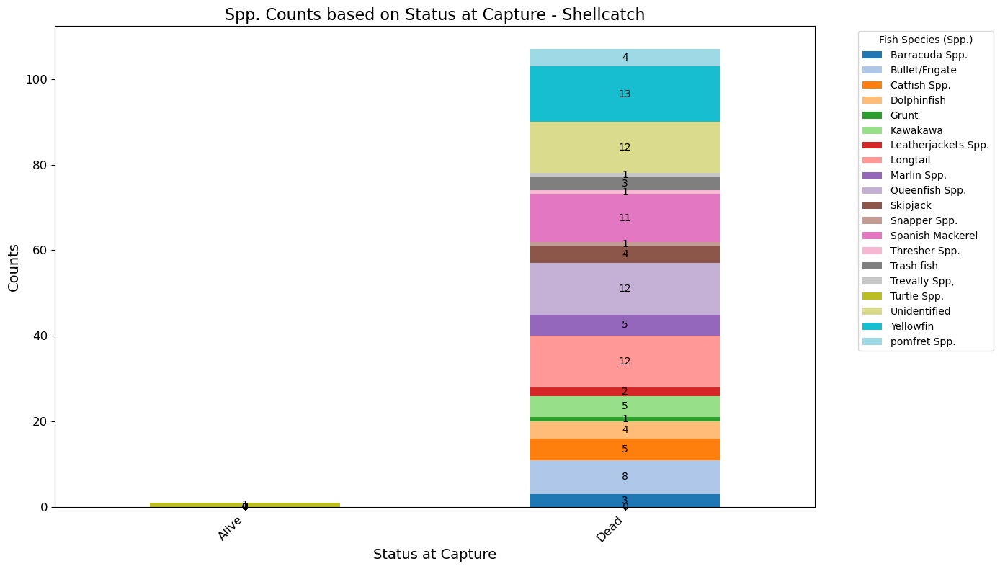

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Status at Capture'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. count graphs based on a given status column with data labels
def plot_spp_status_count(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.0f')
    
    plt.tight_layout()
    plt.show()

# Plot count for Status at Capture - CCTV
plot_spp_status_count(
    df_cctv, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - CCTV'
)

# Plot count for Status at Capture - Shellcatch
plot_spp_status_count(
    df_shellcatch, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - Shellcatch'
)


# percentage graphs using Spp. column based on the columns of Status at Capture, separately for CCTV and Shellcatch 

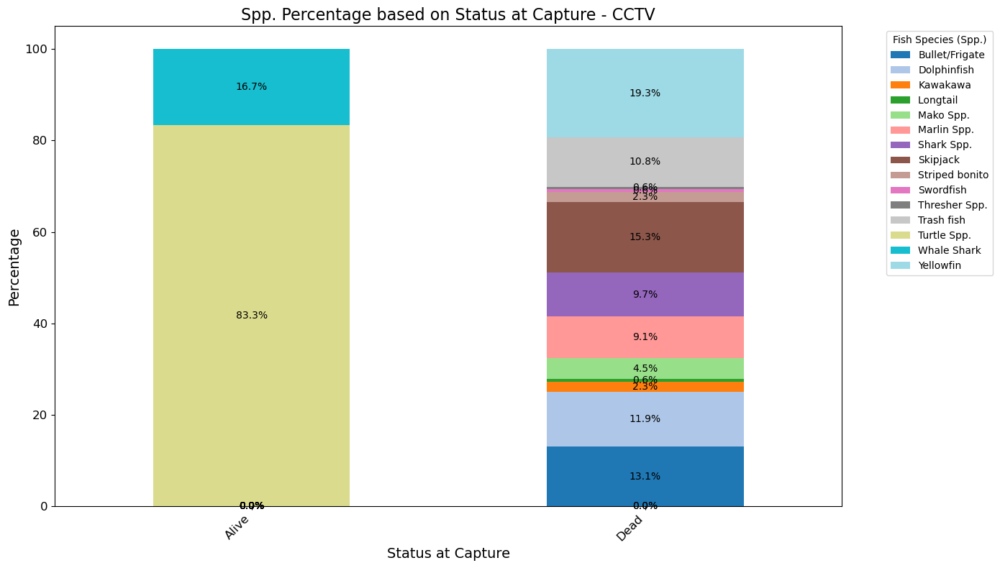

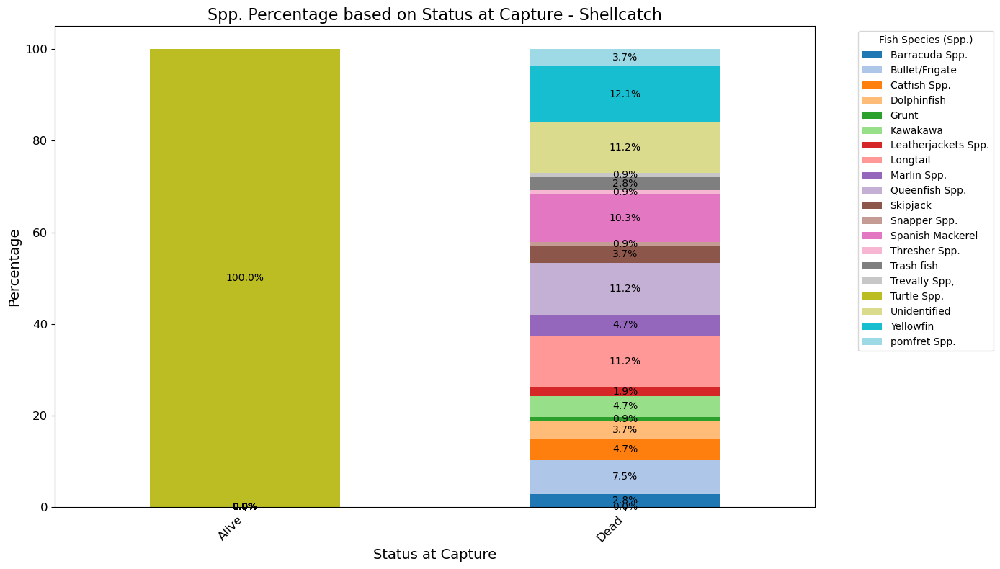

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. percentage graphs based on a given status column with data labels
def plot_spp_status_percentage(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.1f%%')
    
    plt.tight_layout()
    plt.show()

# Plot percentage for Status at Capture - CCTV
plot_spp_status_percentage(
    df_cctv, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - CCTV'
)

# Plot percentage for Status at Capture - Shellcatch
plot_spp_status_percentage(
    df_shellcatch, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - Shellcatch'
)


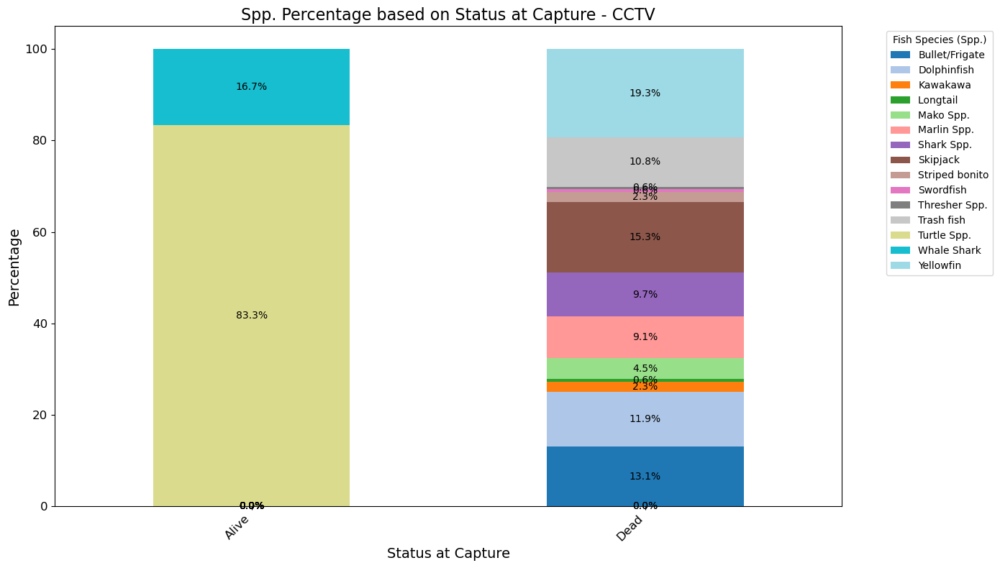

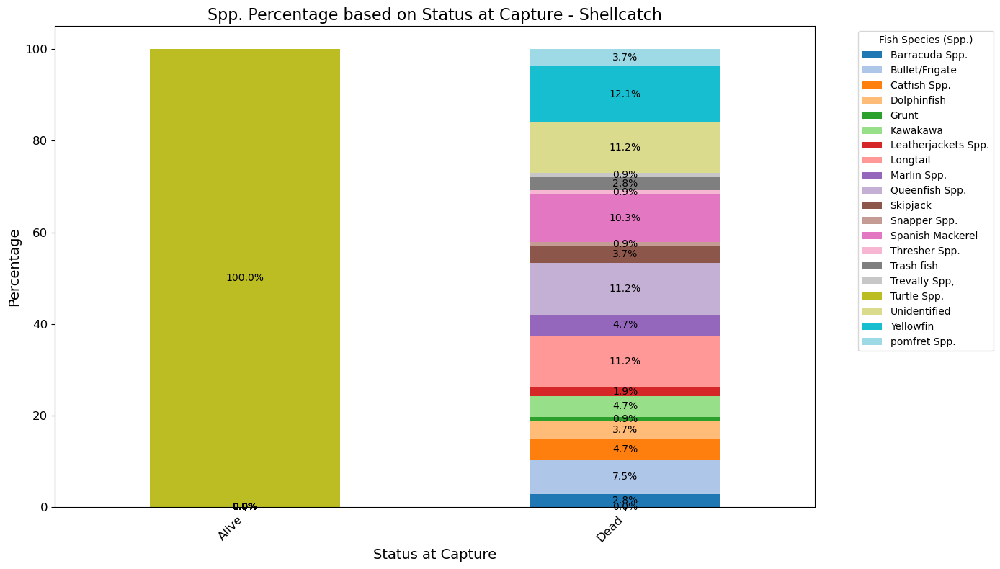

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. percentage graphs based on a given status column with data labels
def plot_spp_status_percentage(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.1f%%')
    
    plt.tight_layout()
    plt.show()

# Plot percentage for Status at Capture - CCTV
plot_spp_status_percentage(
    df_cctv, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - CCTV'
)

# Plot percentage for Status at Capture - Shellcatch
plot_spp_status_percentage(
    df_shellcatch, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - Shellcatch'
)


# count graphs without data labels using Spp. column based on the columns of Status at Capture, separately for CCTV and Shellcatch 

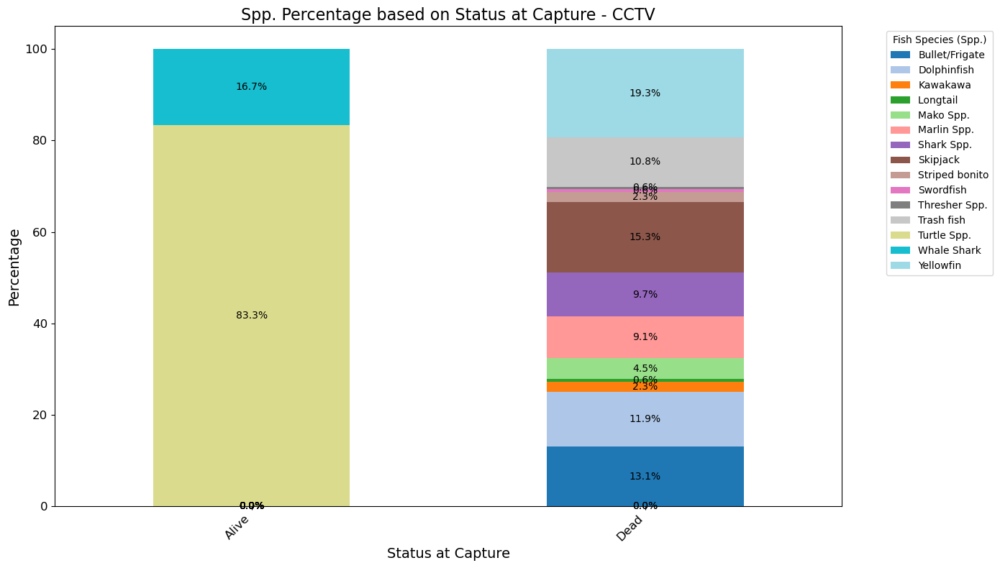

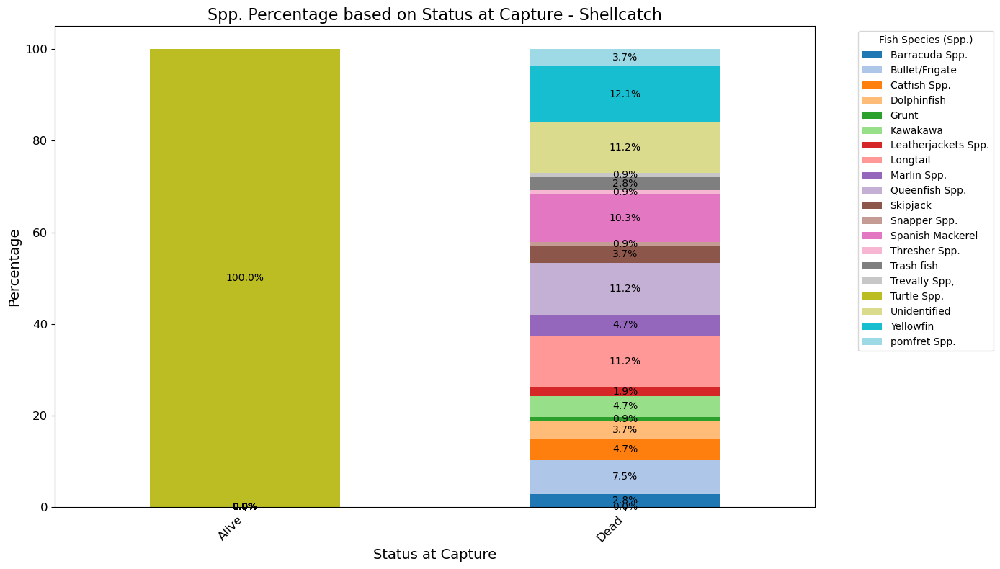

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. percentage graphs based on a given status column with data labels
def plot_spp_status_percentage(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add data labels
    for container in ax.containers:
        ax.bar_label(container, label_type='center', fontsize=10, fmt='%.1f%%')
    
    plt.tight_layout()
    plt.show()

# Plot percentage for Status at Capture - CCTV
plot_spp_status_percentage(
    df_cctv, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - CCTV'
)

# Plot percentage for Status at Capture - Shellcatch
plot_spp_status_percentage(
    df_shellcatch, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - Shellcatch'
)


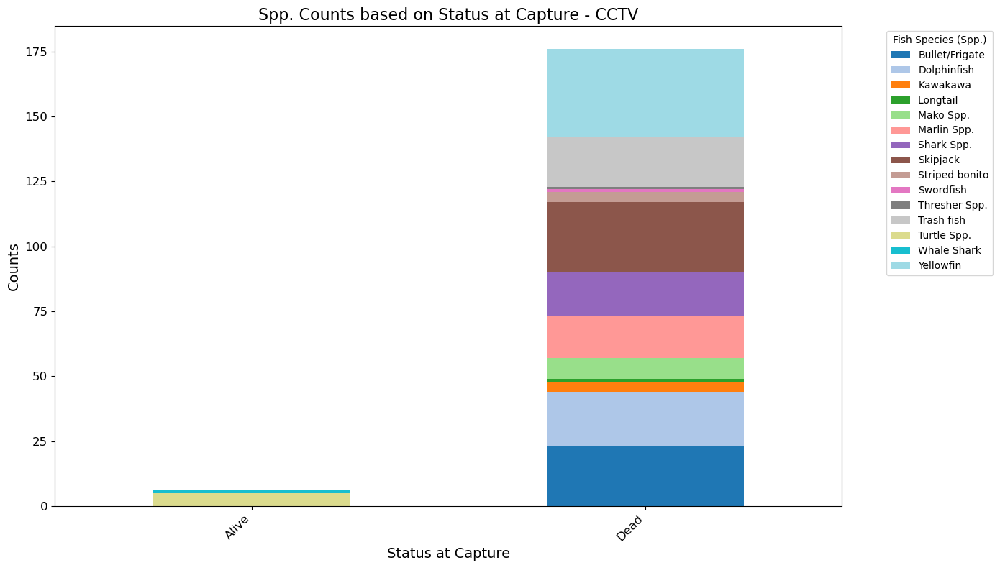

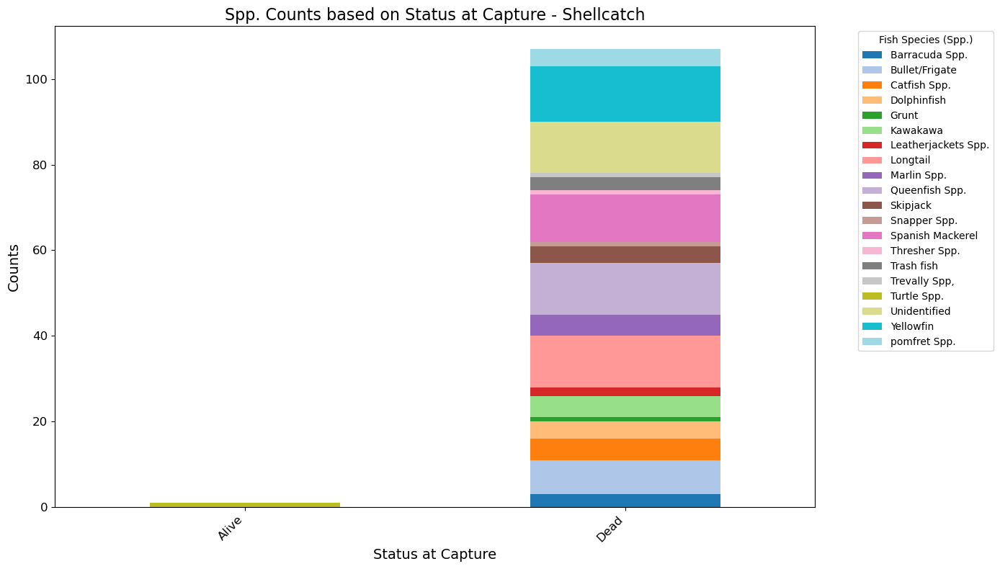

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', and 'Status at Capture'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture'])

# Filter the data based on EMS type (CCTV and Shellcatch)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. count graphs based on a given status column without data labels
def plot_spp_status_count_no_labels(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot count for Status at Capture - CCTV without data labels
plot_spp_status_count_no_labels(
    df_cctv, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - CCTV'
)

# Plot count for Status at Capture - Shellcatch without data labels
plot_spp_status_count_no_labels(
    df_shellcatch, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - Shellcatch'
)


# count graphs using Spp. column based on the columns of Status at Capture, Status at Release and Status of Fish Catch separately for CCTV 

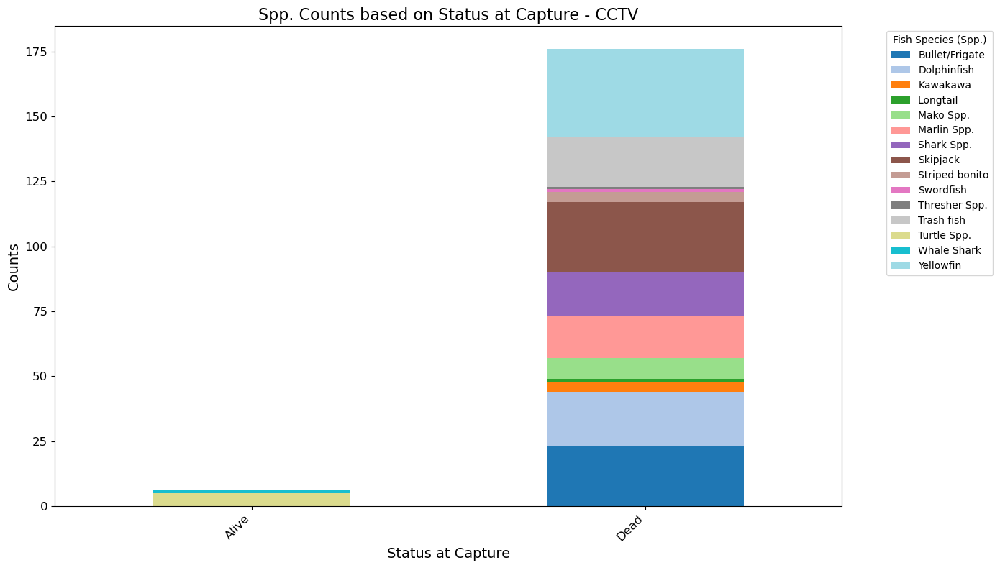

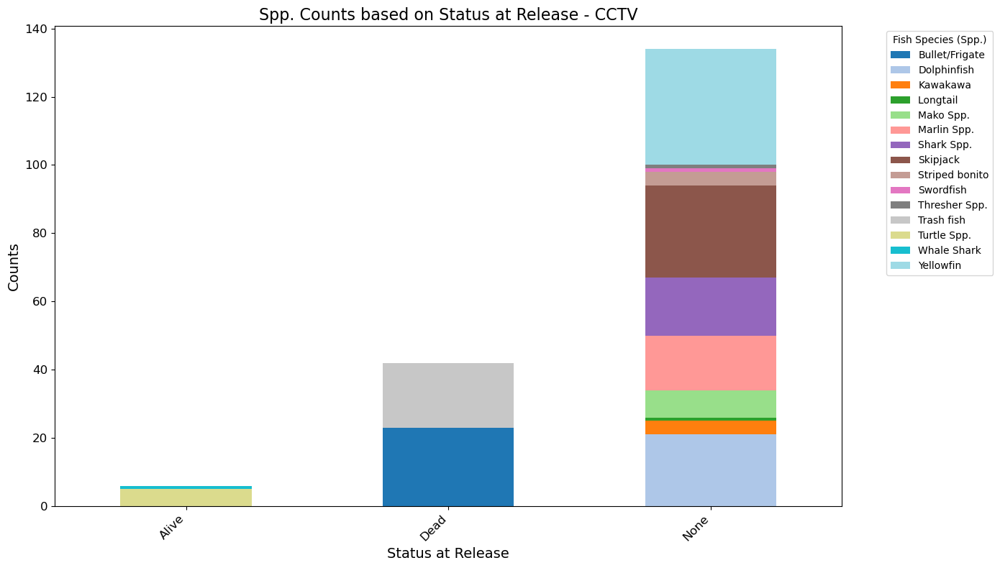

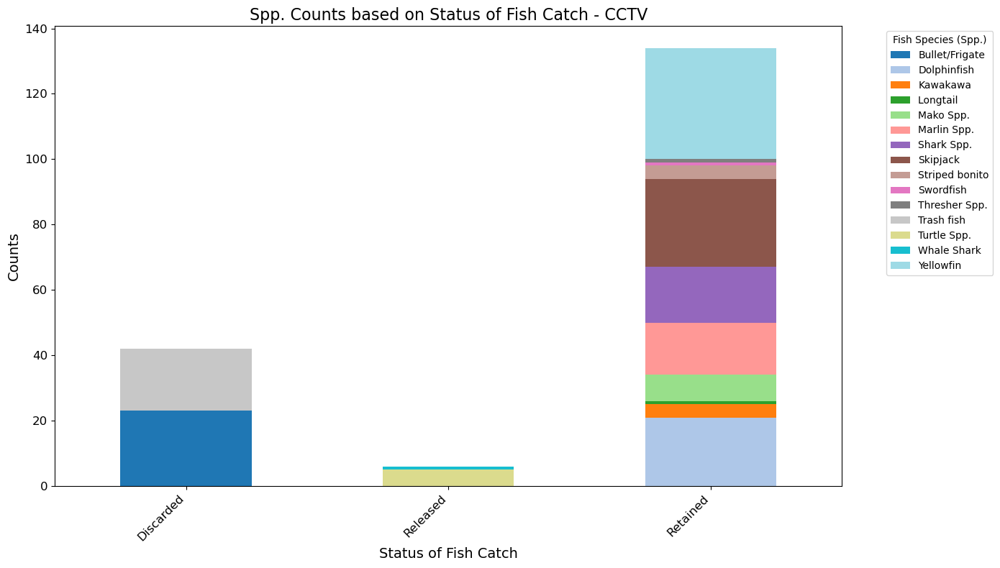

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'])

# Filter the data based on EMS type (CCTV)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']

# Function to plot Spp. count graphs based on a given status column without data labels for CCTV
def plot_spp_status_count_cctv(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot count for Status at Capture - CCTV without data labels
plot_spp_status_count_cctv(
    df_cctv, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - CCTV'
)

# Plot count for Status at Release - CCTV without data labels
plot_spp_status_count_cctv(
    df_cctv, 'Status at Release', 
    'Spp. Counts based on Status at Release - CCTV'
)

# Plot count for Status of Fish Catch - CCTV without data labels
plot_spp_status_count_cctv(
    df_cctv, 'Status of Fish Catch', 
    'Spp. Counts based on Status of Fish Catch - CCTV'
)


# percentage graphs using Spp. column based on the columns of Status at Capture, Status at Release and Status of Fish Catch separately for CCTV 

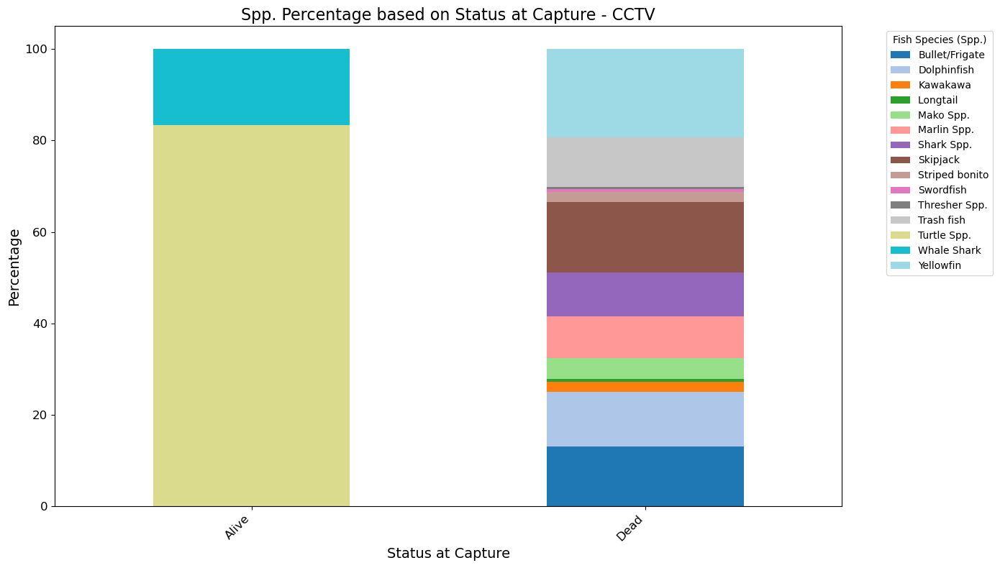

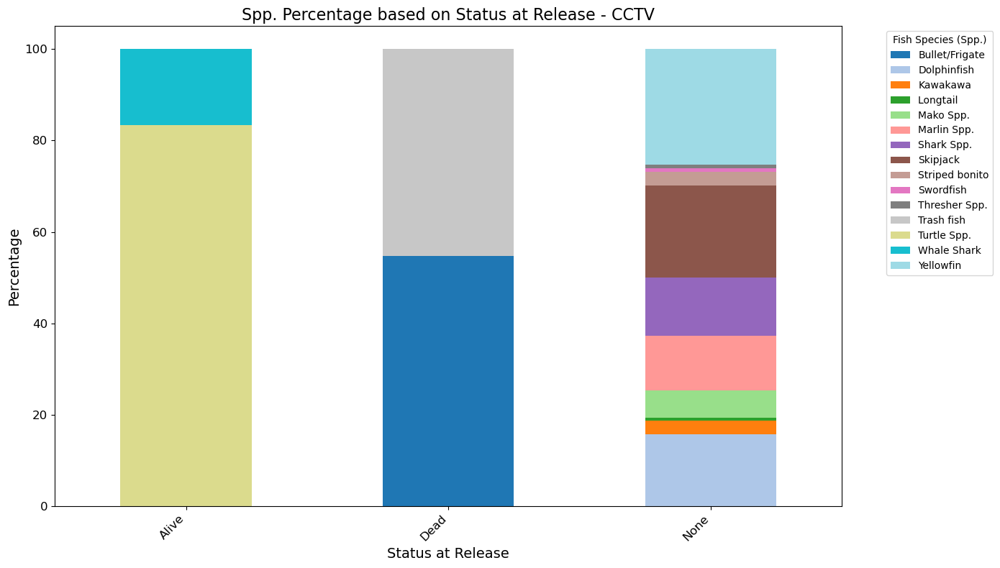

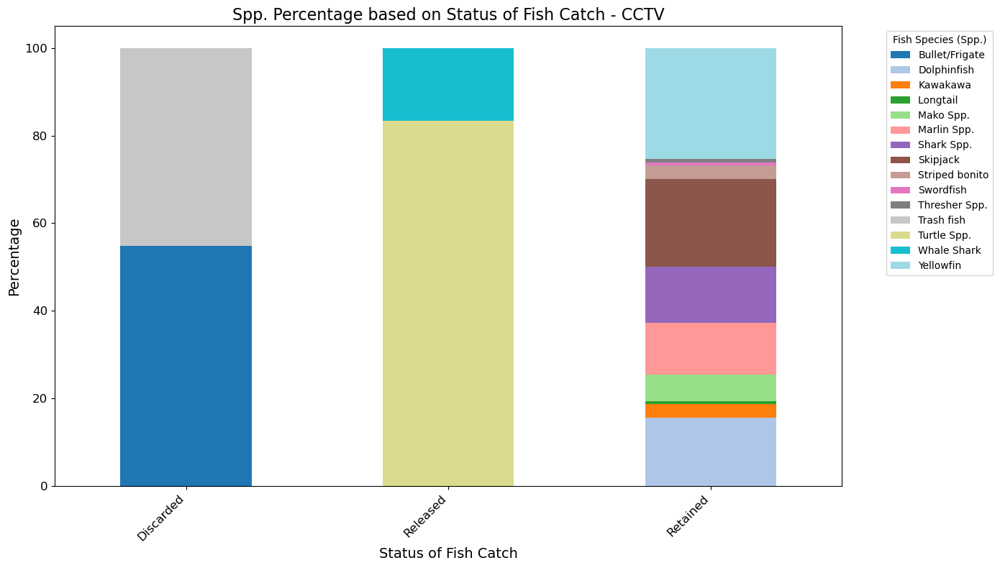

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'])

# Filter the data based on EMS type (CCTV)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']

# Function to plot Spp. percentage graphs based on a given status column without data labels for CCTV
def plot_spp_status_percentage_cctv(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot percentage for Status at Capture - CCTV without data labels
plot_spp_status_percentage_cctv(
    df_cctv, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - CCTV'
)

# Plot percentage for Status at Release - CCTV without data labels
plot_spp_status_percentage_cctv(
    df_cctv, 'Status at Release', 
    'Spp. Percentage based on Status at Release - CCTV'
)

# Plot percentage for Status of Fish Catch - CCTV without data labels
plot_spp_status_percentage_cctv(
    df_cctv, 'Status of Fish Catch', 
    'Spp. Percentage based on Status of Fish Catch - CCTV'
)


# count graphs using Spp. column based on the columns of Status at Capture, Status at Release and Status of Fish Catch separately for Shellcatch

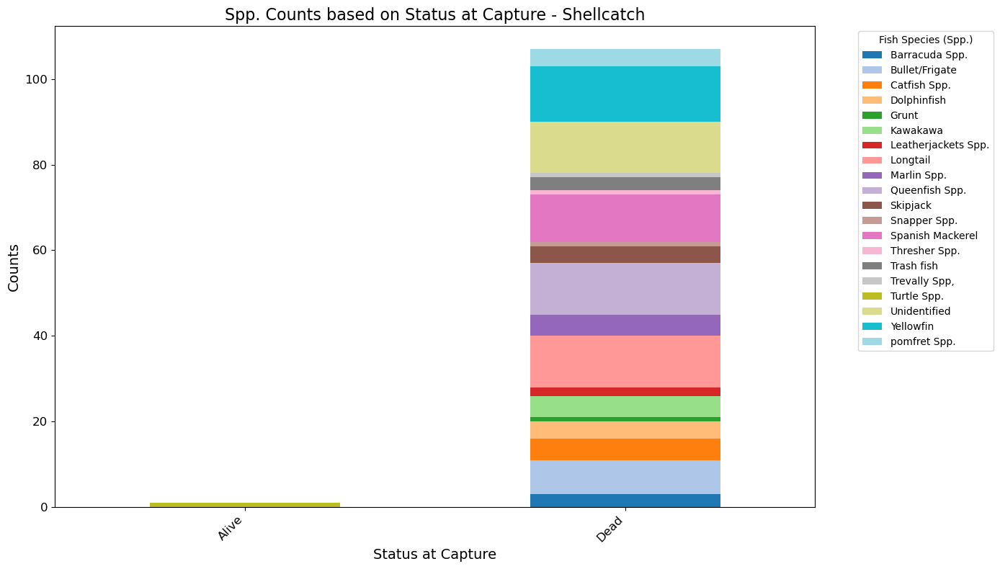

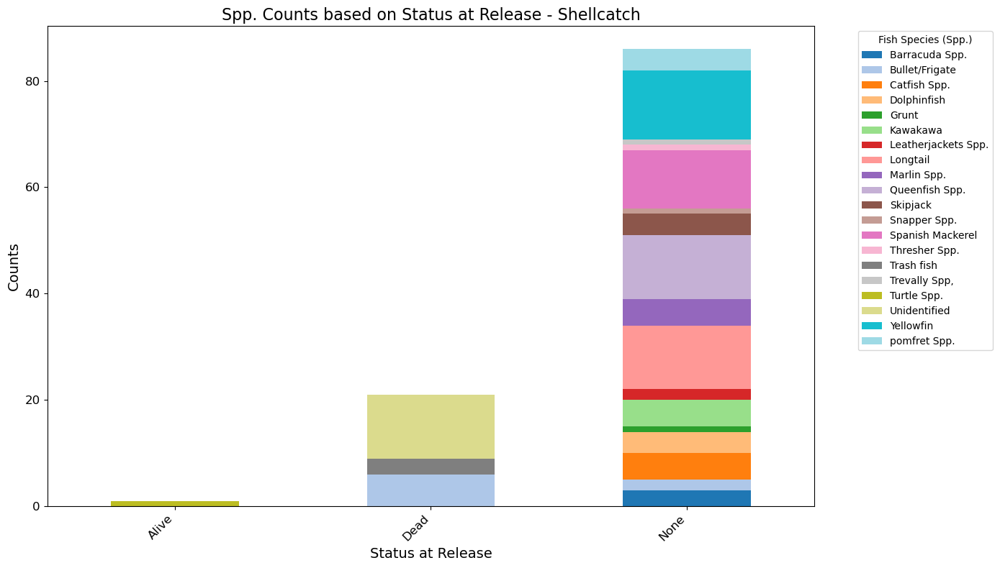

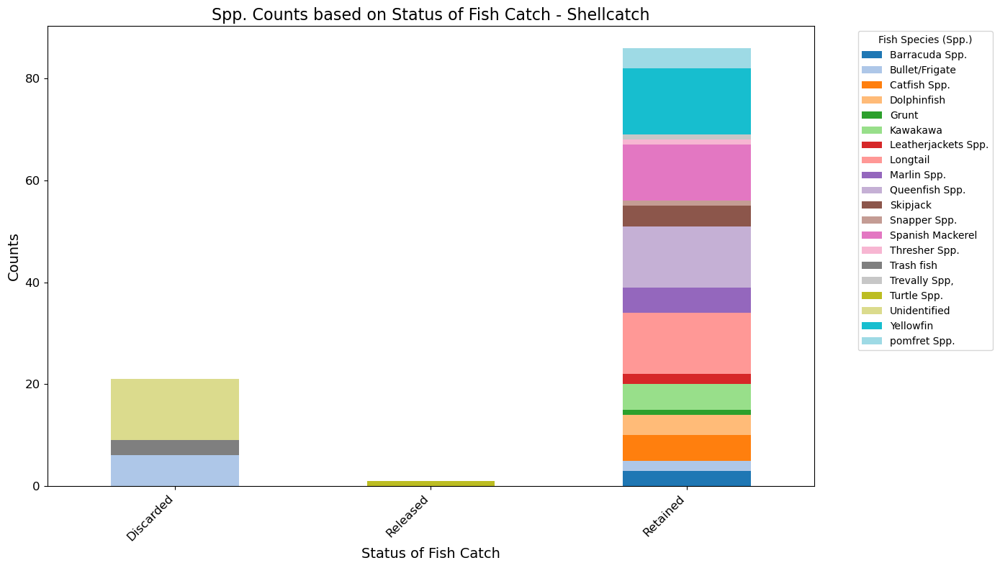

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'])

# Filter the data based on EMS type (Shellcatch)
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. count graphs based on a given status column without data labels for Shellcatch
def plot_spp_status_count_shellcatch(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_pivot.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Counts', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot count for Status at Capture - Shellcatch without data labels
plot_spp_status_count_shellcatch(
    df_shellcatch, 'Status at Capture', 
    'Spp. Counts based on Status at Capture - Shellcatch'
)

# Plot count for Status at Release - Shellcatch without data labels
plot_spp_status_count_shellcatch(
    df_shellcatch, 'Status at Release', 
    'Spp. Counts based on Status at Release - Shellcatch'
)

# Plot count for Status of Fish Catch - Shellcatch without data labels
plot_spp_status_count_shellcatch(
    df_shellcatch, 'Status of Fish Catch', 
    'Spp. Counts based on Status of Fish Catch - Shellcatch'
)


# percentage graphs using Spp. column based on the columns of Status at Capture, Status at Release and Status of Fish Catch

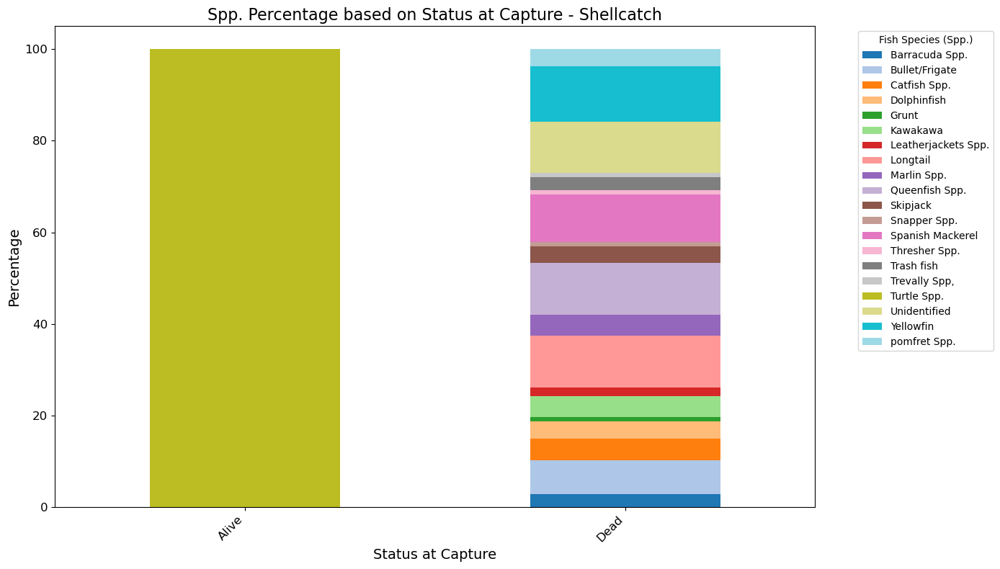

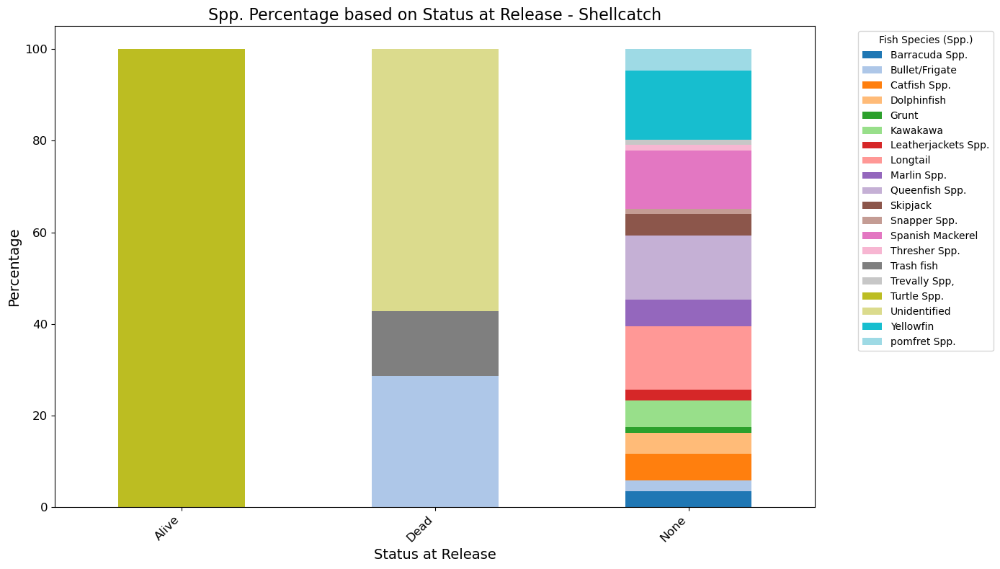

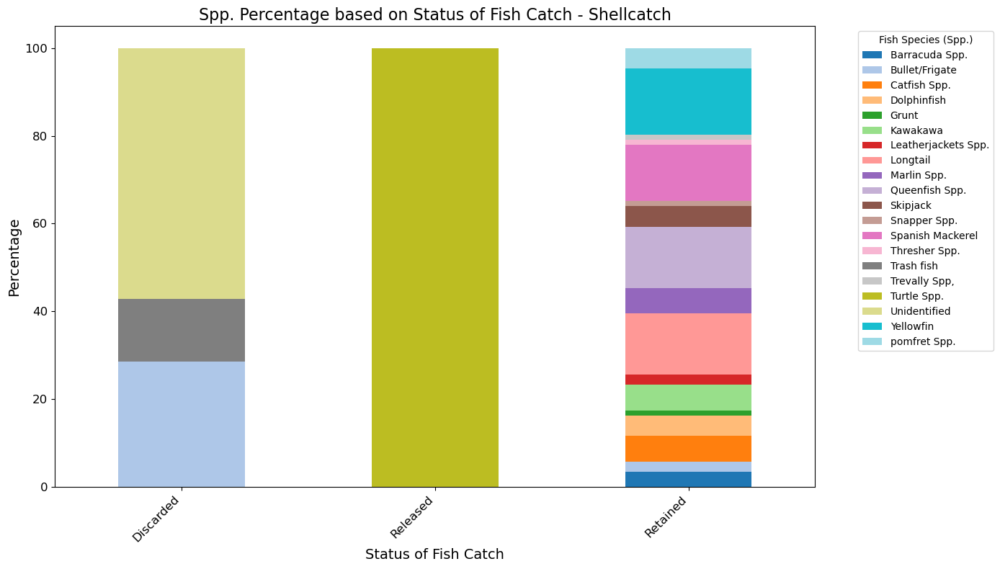

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Status at Capture', 'Status at Release', 'Status of Fish Catch'])

# Filter the data based on EMS type (Shellcatch)
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. percentage graphs based on a given status column without data labels for Shellcatch
def plot_spp_status_percentage_shellcatch(data, status_col, title):
    status_data = data.groupby([status_col, 'Spp.']).size().reset_index(name='Counts')
    status_pivot = status_data.pivot(index=status_col, columns='Spp.', values='Counts').fillna(0)
    status_percentage = (status_pivot.div(status_pivot.sum(axis=1), axis=0) * 100).fillna(0)
    
    plt.figure(figsize=(14, 8))
    ax = status_percentage.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='tab20')
    plt.title(title, fontsize=16)
    plt.xlabel(status_col, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot percentage for Status at Capture - Shellcatch without data labels
plot_spp_status_percentage_shellcatch(
    df_shellcatch, 'Status at Capture', 
    'Spp. Percentage based on Status at Capture - Shellcatch'
)

# Plot percentage for Status at Release - Shellcatch without data labels
plot_spp_status_percentage_shellcatch(
    df_shellcatch, 'Status at Release', 
    'Spp. Percentage based on Status at Release - Shellcatch'
)

# Plot percentage for Status of Fish Catch - Shellcatch without data labels
plot_spp_status_percentage_shellcatch(
    df_shellcatch, 'Status of Fish Catch', 
    'Spp. Percentage based on Status of Fish Catch - Shellcatch'
)


# graphs using Spp. column based on the columns of Individual # 1 Length (cm), Individual # 2 Length (cm), Individual # 3 Length (cm)

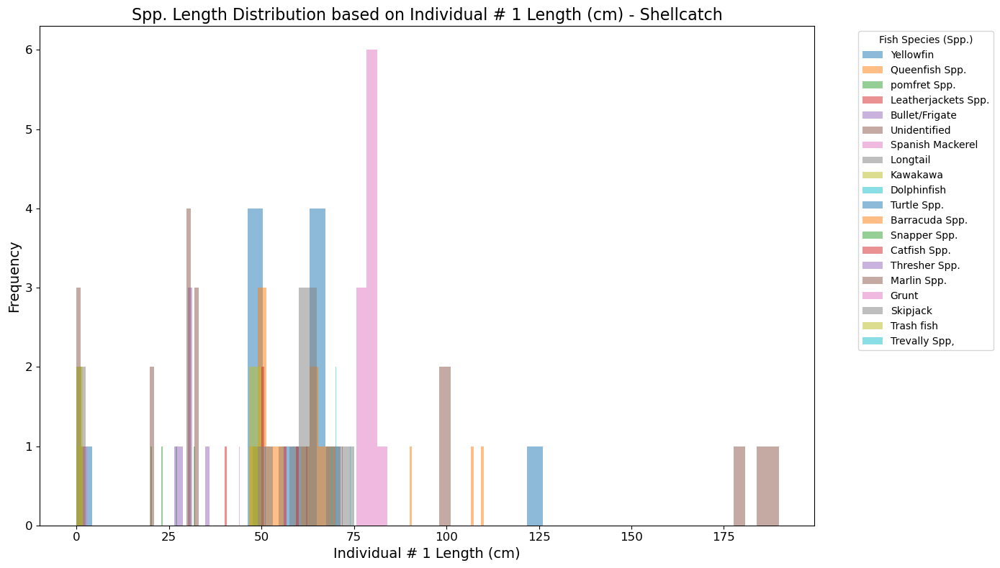

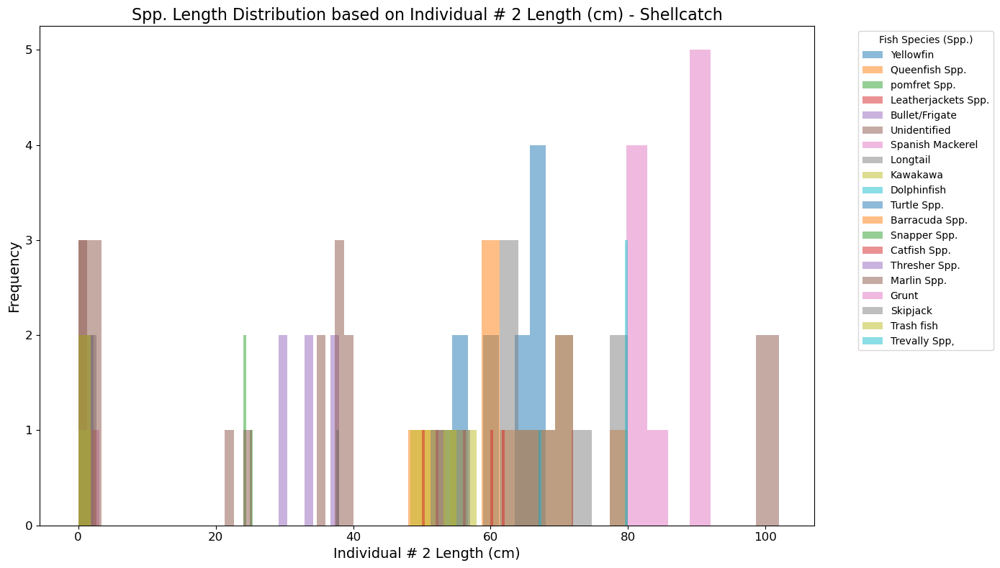

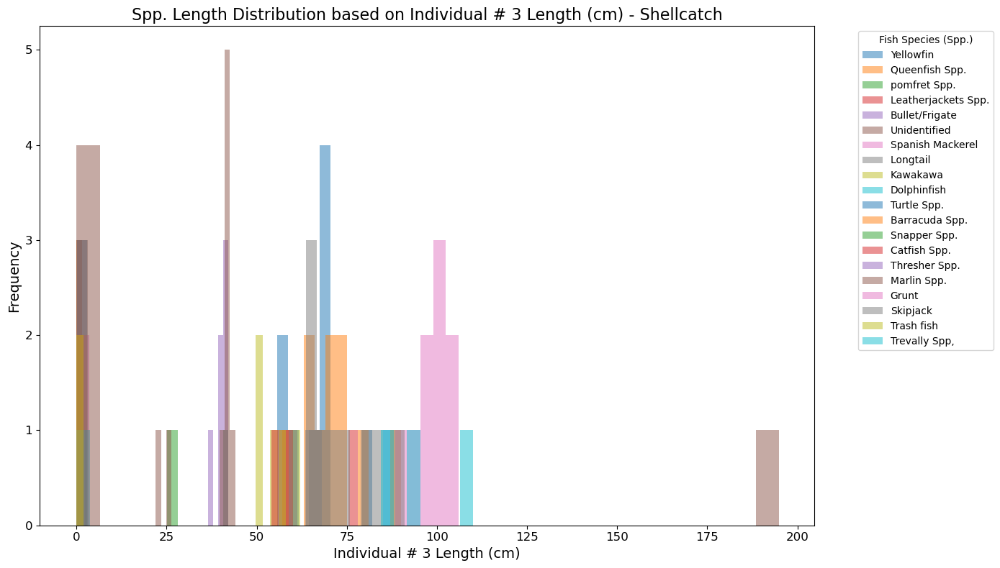

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'])

# Filter the data based on EMS type (Shellcatch)
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Spp. length distribution based on a given length column for Shellcatch
def plot_spp_length_distribution_shellcatch(data, length_col, title):
    length_data = data.dropna(subset=[length_col])
    plt.figure(figsize=(14, 8))
    for spp in length_data['Spp.'].unique():
        subset = length_data[length_data['Spp.'] == spp]
        plt.hist(subset[length_col], bins=30, alpha=0.5, label=spp)
    
    plt.title(title, fontsize=16)
    plt.xlabel(length_col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot length distribution for Individual # 1 Length (cm) - Shellcatch
plot_spp_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 1 Length (cm)', 
    'Spp. Length Distribution based on Individual # 1 Length (cm) - Shellcatch'
)

# Plot length distribution for Individual # 2 Length (cm) - Shellcatch
plot_spp_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 2 Length (cm)', 
    'Spp. Length Distribution based on Individual # 2 Length (cm) - Shellcatch'
)

# Plot length distribution for Individual # 3 Length (cm) - Shellcatch
plot_spp_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 3 Length (cm)', 
    'Spp. Length Distribution based on Individual # 3 Length (cm) - Shellcatch'
)


# graphs using Spp. column based on the columns of Individual # 1 Length (cm), Individual # 2 Length (cm), Individual # 3 Length (cm)

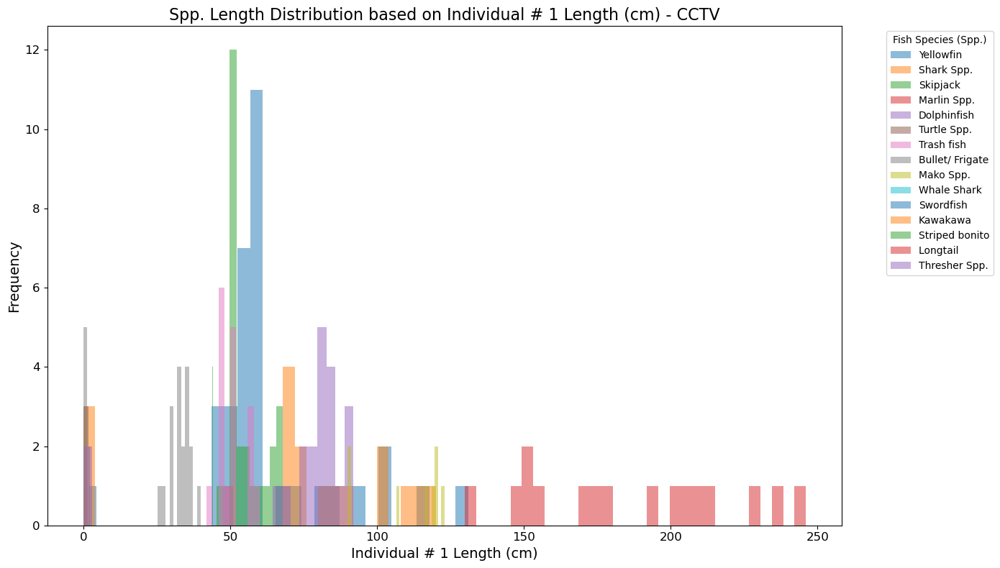

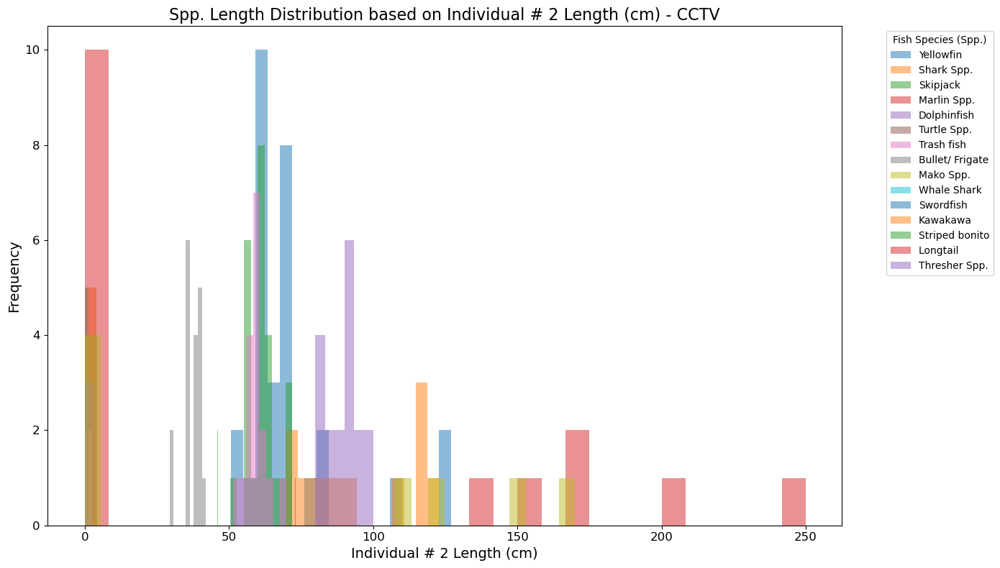

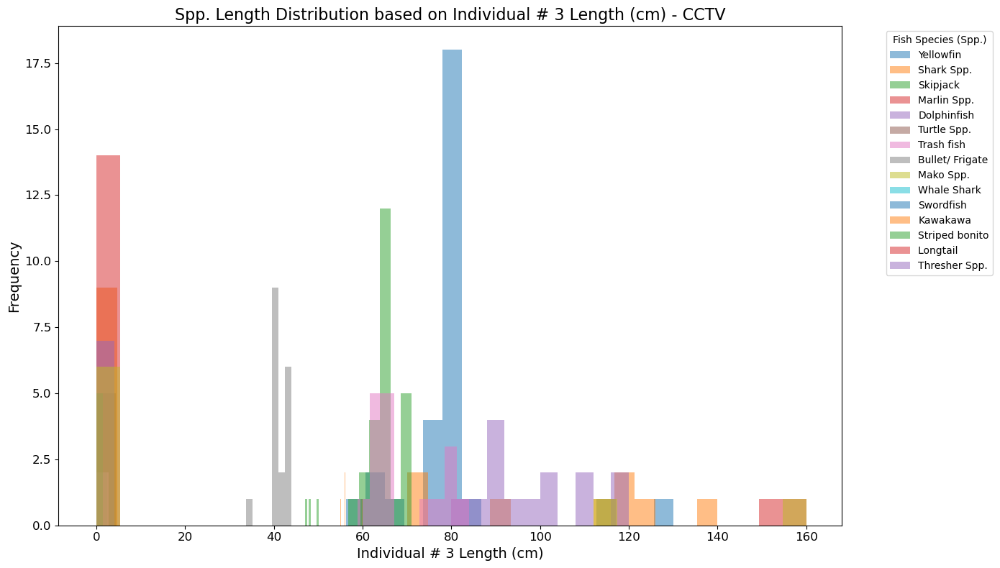

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Spp.', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'
df_timeline = df.dropna(subset=['Date of Fishing', 'Spp.', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'])

# Filter the data based on EMS type (CCTV)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']

# Function to plot Spp. length distribution based on a given length column for CCTV
def plot_spp_length_distribution_cctv(data, length_col, title):
    length_data = data.dropna(subset=[length_col])
    plt.figure(figsize=(14, 8))
    for spp in length_data['Spp.'].unique():
        subset = length_data[length_data['Spp.'] == spp]
        plt.hist(subset[length_col], bins=30, alpha=0.5, label=spp)
    
    plt.title(title, fontsize=16)
    plt.xlabel(length_col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Species (Spp.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot length distribution for Individual # 1 Length (cm) - CCTV
plot_spp_length_distribution_cctv(
    df_cctv, 'Individual # 1 Length (cm)', 
    'Spp. Length Distribution based on Individual # 1 Length (cm) - CCTV'
)

# Plot length distribution for Individual # 2 Length (cm) - CCTV
plot_spp_length_distribution_cctv(
    df_cctv, 'Individual # 2 Length (cm)', 
    'Spp. Length Distribution based on Individual # 2 Length (cm) - CCTV'
)

# Plot length distribution for Individual # 3 Length (cm) - CCTV
plot_spp_length_distribution_cctv(
    df_cctv, 'Individual # 3 Length (cm)', 
    'Spp. Length Distribution based on Individual # 3 Length (cm) - CCTV'
)


# graphs using Fish Category based on the columns of Individual # 1 Length (cm), Individual # 2 Length (cm), Individual # 3 Length (cm)

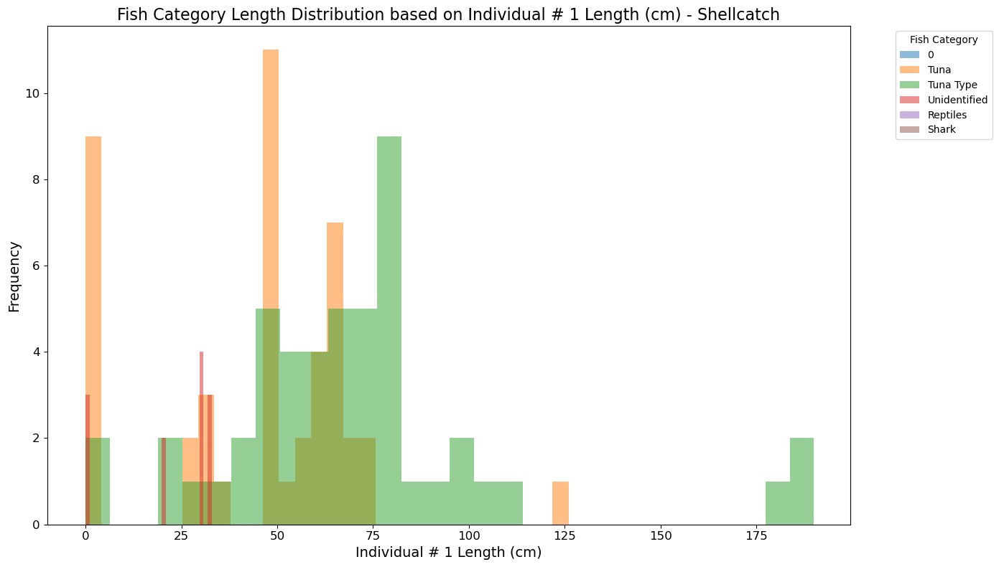

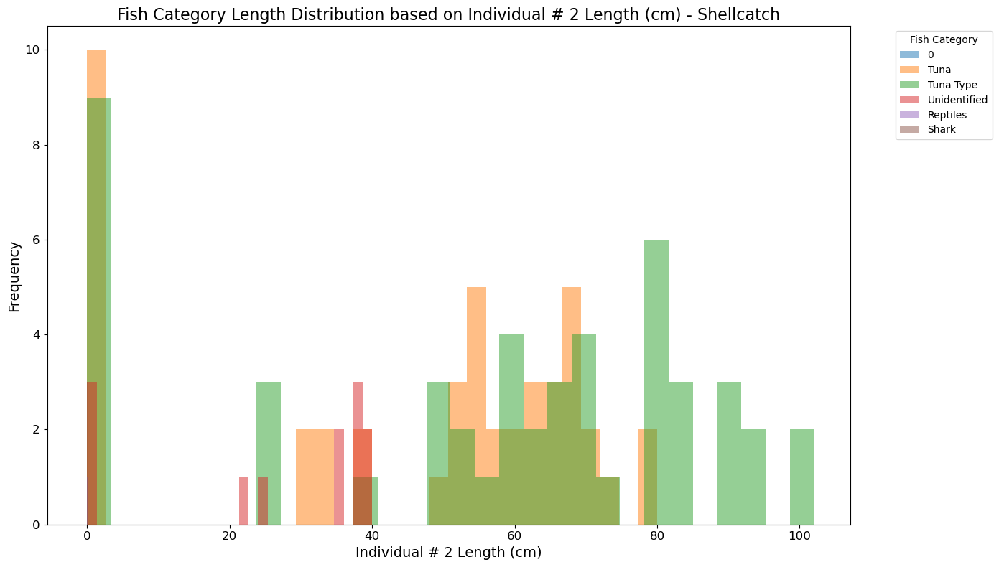

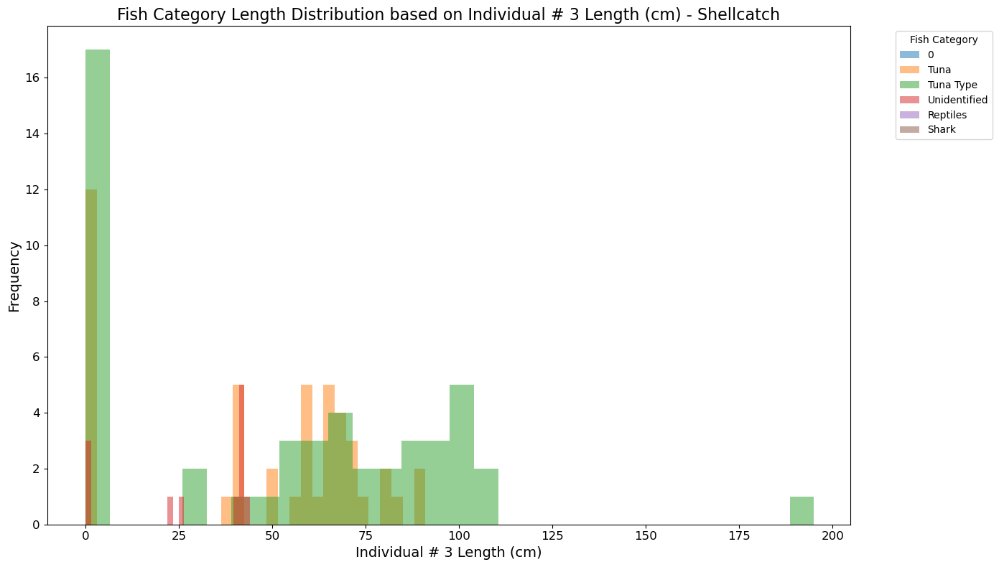

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'
df_timeline = df.dropna(subset=['Date of Fishing', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'])

# Filter the data based on EMS type (Shellcatch)
df_shellcatch = df_timeline[df_timeline['EMS'] == 'Shellcatch']

# Function to plot Fish Category length distribution based on a given length column for Shellcatch
def plot_category_length_distribution_shellcatch(data, length_col, title):
    length_data = data.dropna(subset=[length_col])
    plt.figure(figsize=(14, 8))
    for category in length_data['Fish Category'].unique():
        subset = length_data[length_data['Fish Category'] == category]
        plt.hist(subset[length_col], bins=30, alpha=0.5, label=category)
    
    plt.title(title, fontsize=16)
    plt.xlabel(length_col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot length distribution for Individual # 1 Length (cm) - Shellcatch
plot_category_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 1 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 1 Length (cm) - Shellcatch'
)

# Plot length distribution for Individual # 2 Length (cm) - Shellcatch
plot_category_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 2 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 2 Length (cm) - Shellcatch'
)

# Plot length distribution for Individual # 3 Length (cm) - Shellcatch
plot_category_length_distribution_shellcatch(
    df_shellcatch, 'Individual # 3 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 3 Length (cm) - Shellcatch'
)


# graphs using Fish Category based on the columns of Individual # 1 Length (cm), Individual # 2 Length (cm), Individual # 3 Length (cm)

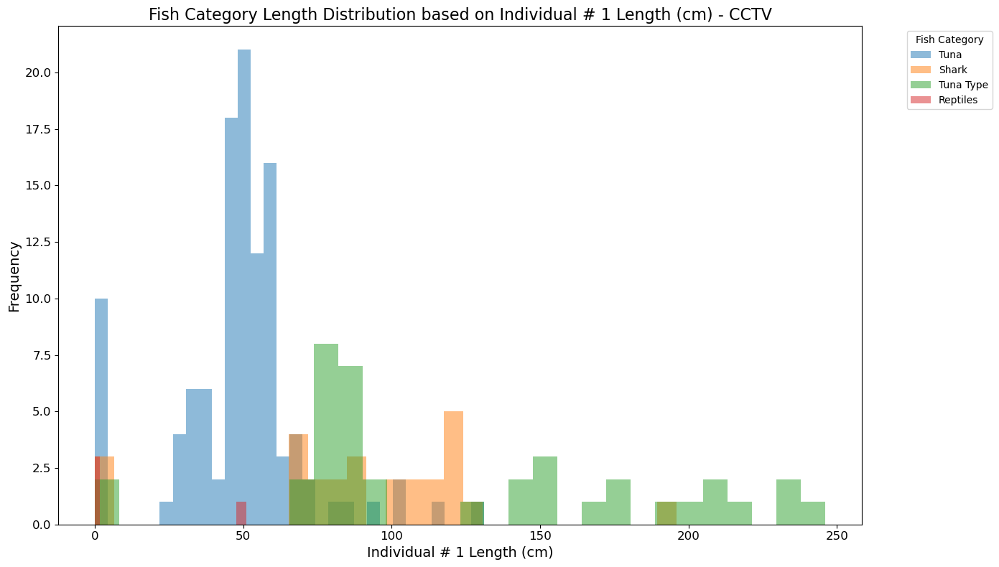

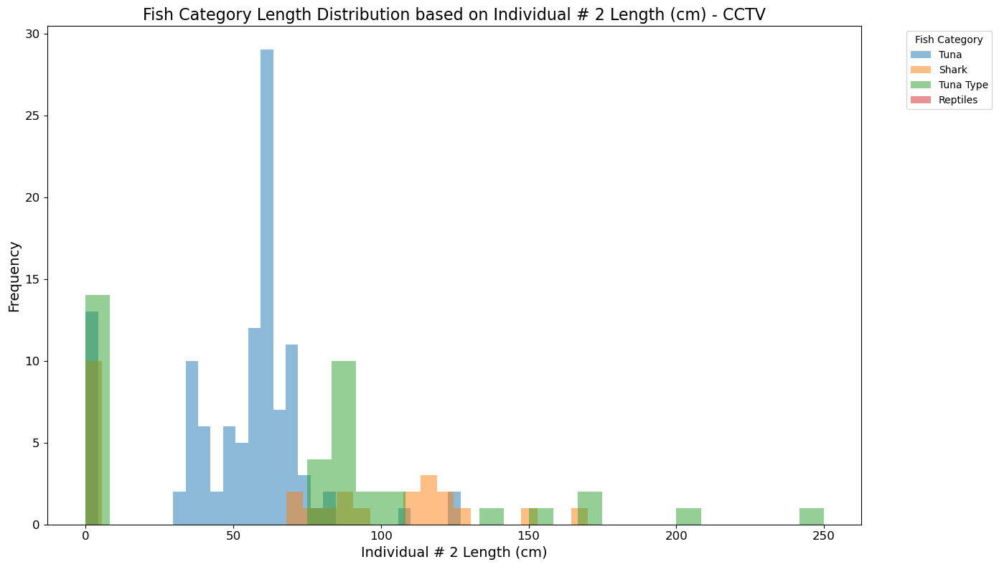

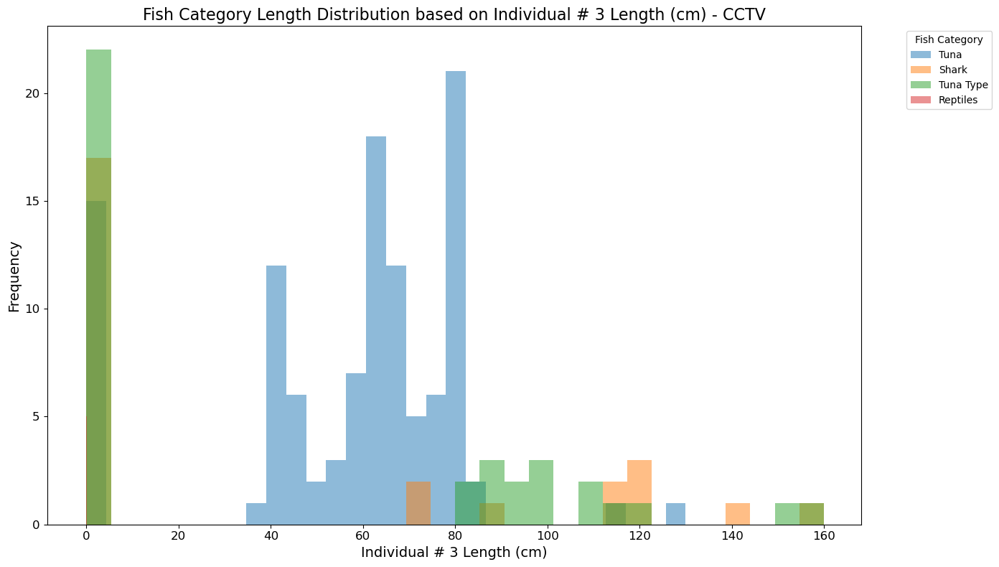

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'], errors='coerce')

# Drop rows with NaN values in 'Date of Fishing', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'
df_timeline = df.dropna(subset=['Date of Fishing', 'Fish Category', 'Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)'])

# Filter the data based on EMS type (CCTV)
df_cctv = df_timeline[df_timeline['EMS'] == 'CCTV']

# Function to plot Fish Category length distribution based on a given length column for CCTV
def plot_category_length_distribution_cctv(data, length_col, title):
    length_data = data.dropna(subset=[length_col])
    plt.figure(figsize=(14, 8))
    for category in length_data['Fish Category'].unique():
        subset = length_data[length_data['Fish Category'] == category]
        plt.hist(subset[length_col], bins=30, alpha=0.5, label=category)
    
    plt.title(title, fontsize=16)
    plt.xlabel(length_col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(title='Fish Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Plot length distribution for Individual # 1 Length (cm) - CCTV
plot_category_length_distribution_cctv(
    df_cctv, 'Individual # 1 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 1 Length (cm) - CCTV'
)

# Plot length distribution for Individual # 2 Length (cm) - CCTV
plot_category_length_distribution_cctv(
    df_cctv, 'Individual # 2 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 2 Length (cm) - CCTV'
)

# Plot length distribution for Individual # 3 Length (cm) - CCTV
plot_category_length_distribution_cctv(
    df_cctv, 'Individual # 3 Length (cm)', 
    'Fish Category Length Distribution based on Individual # 3 Length (cm) - CCTV'
)


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\870391929.py:21: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df[col] = pd.to_datetime(df[col], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\870391929.py:21: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df[col] = pd.to_datetime(df[col], errors='coerce')


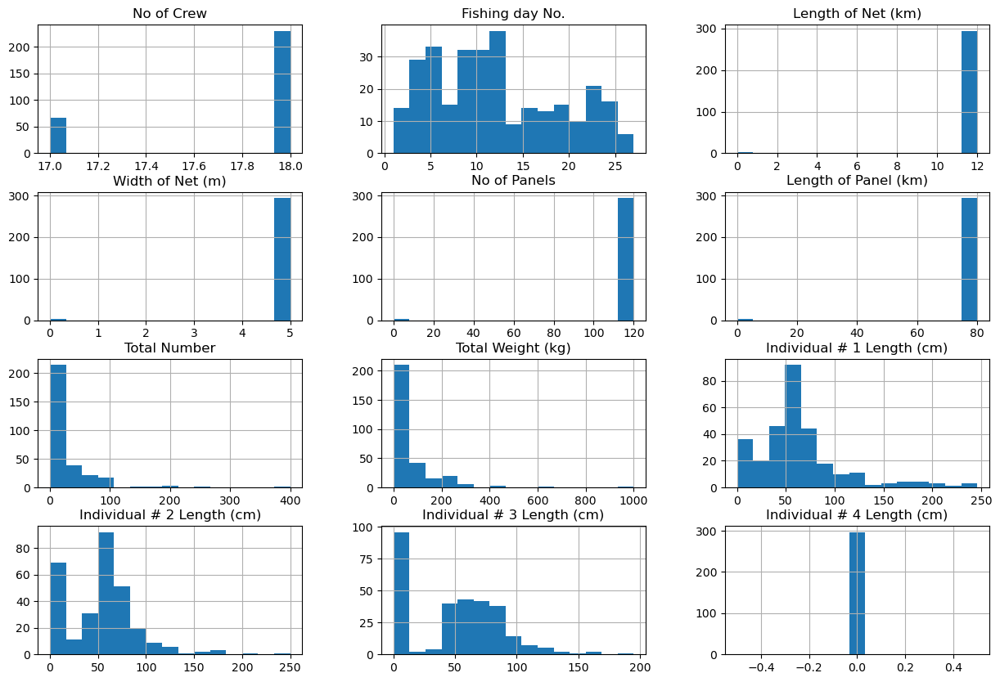

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\870391929.py:46: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')


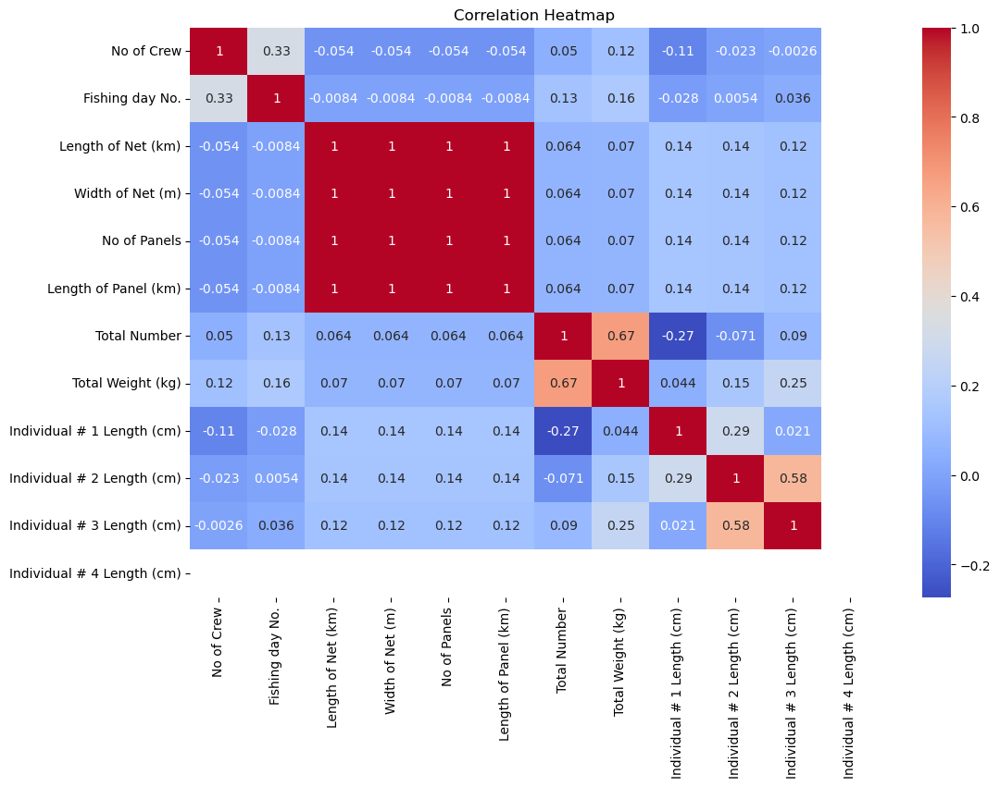

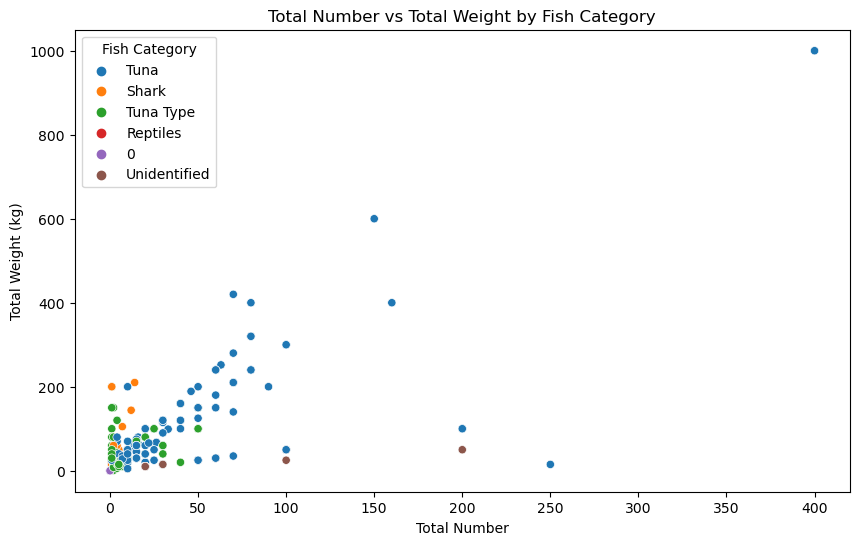

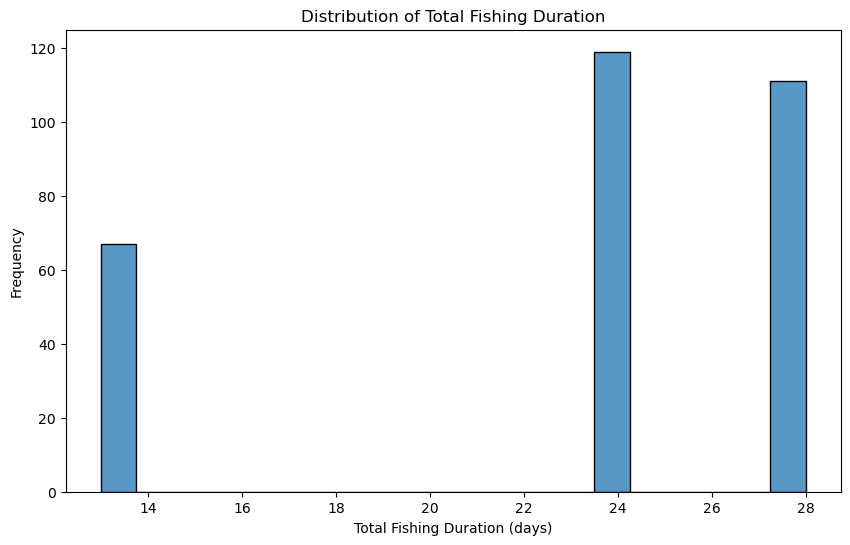

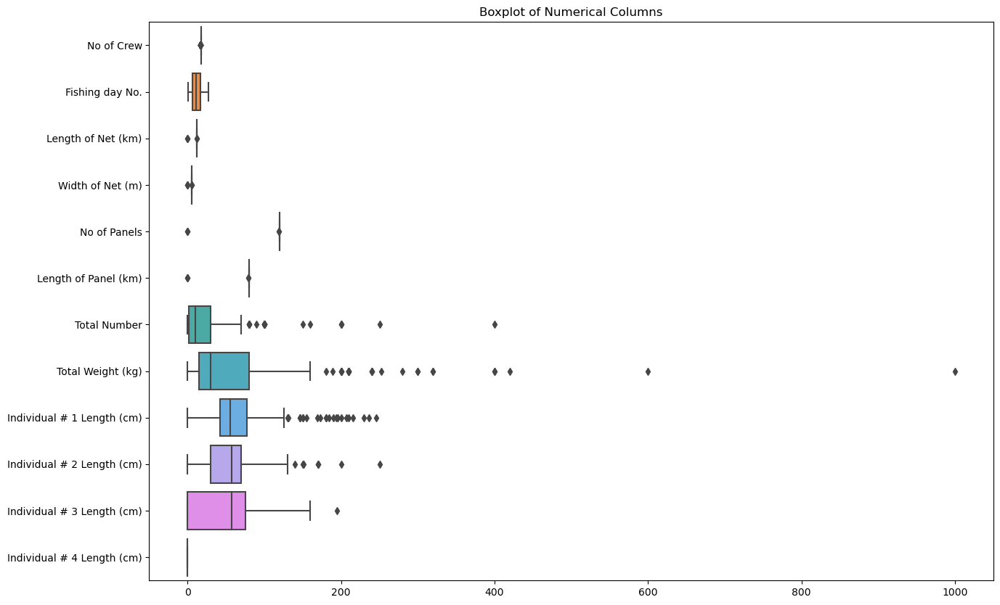

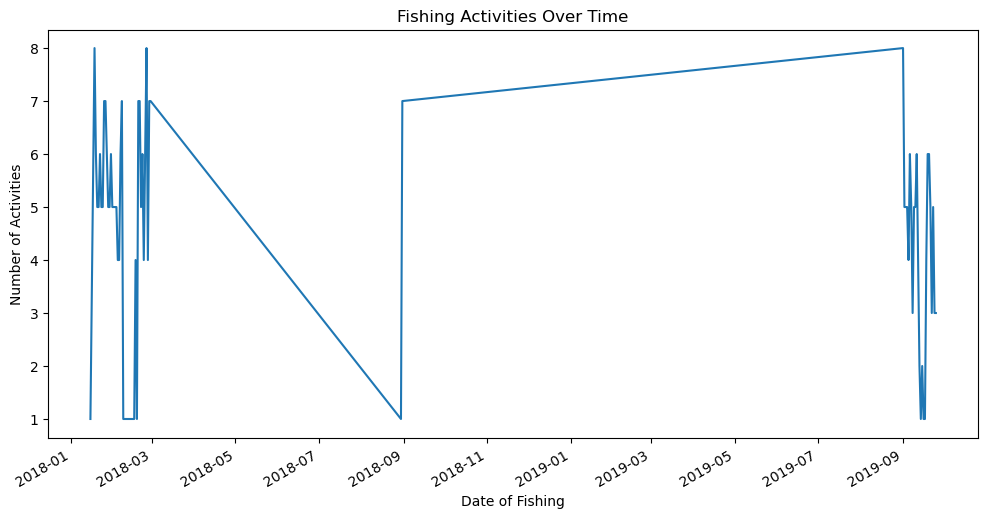

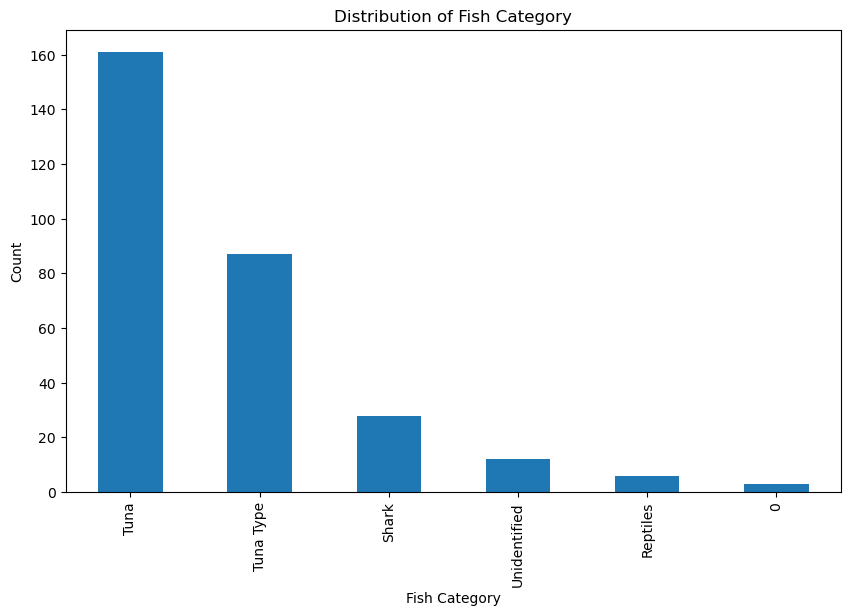

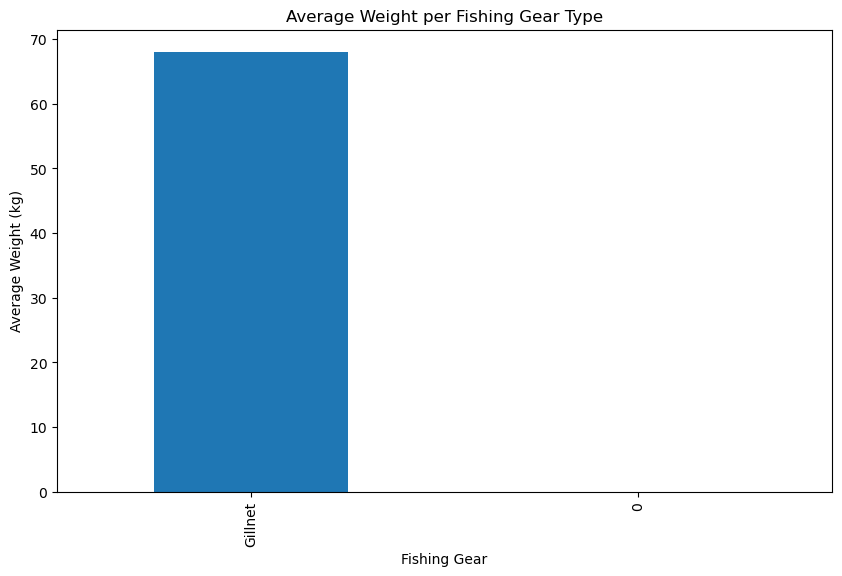

ANOVA test result: F-statistic = 6.437534293661681, p-value = 1.081142586724817e-05
                    Model          MSE  R-squared
0       Linear Regression  3373.873849   0.334544
1           Random Forest  2310.546114   0.544273
2       Gradient Boosting  2254.452802   0.555336
3      Best Random Forest  2321.923826   0.542028
4  Best Gradient Boosting  2643.890830   0.478524


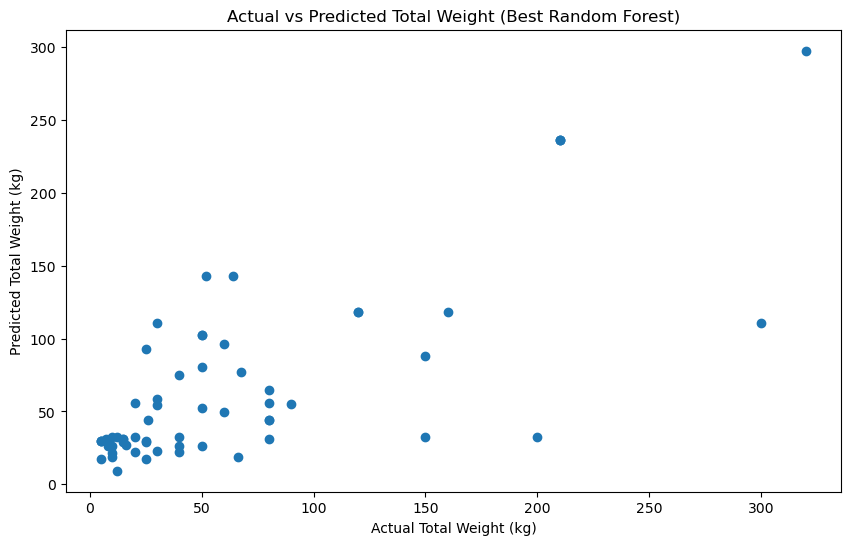

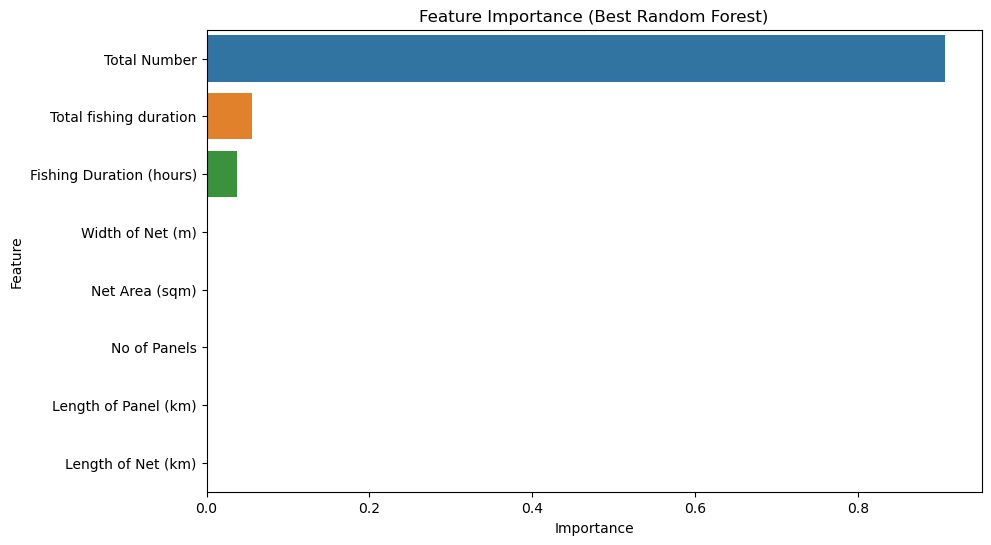

Cross-Validation R-squared scores (Random Forest): [ 0.65153418  0.50557359 -0.05859585  0.38230569 -0.49524588  0.04384369
  0.06961543  0.68996401  0.14543824  0.30338135]
Mean R-squared score (Random Forest): 0.22378144382365034
Cross-Validation R-squared scores (Gradient Boosting): [ 0.72779777  0.46365215 -0.02081281  0.38038861 -0.20448644 -0.00299491
  0.11449561  0.80021577  0.15817676  0.19688936]
Mean R-squared score (Gradient Boosting): 0.2613321870951366


In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Step 1: Load the Data
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Step 2: Data Cleaning

# Convert date columns to datetime
date_columns = ['Date of Departed Port', 'Date of Arrival Port', 'Date of Fishing']
for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce')

# Check for missing values
missing_values = df.isnull().sum()

# Fill missing numerical values with the mean of the column
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())

# Fill missing categorical values with the mode of the column
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# Step 3: Descriptive Statistics
desc_stats = df.describe()

# Step 4: Data Visualization

# Plotting histograms for numerical columns
df[numerical_cols].hist(bins=15, figsize=(15, 10), layout=(4, 3))
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# Step 5: Analysis of Specific Columns

# Example Analysis: Total Number and Total Weight
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Total Number', y='Total Weight (kg)', hue='Fish Category', data=df)
plt.title('Total Number vs Total Weight by Fish Category')
plt.xlabel('Total Number')
plt.ylabel('Total Weight (kg)')
plt.legend(title='Fish Category')
plt.show()

# Fishing duration analysis
df['Total fishing duration'] = df['Total fishing duration'].str.extract('(\d+)').astype(float)

plt.figure(figsize=(10, 6))
sns.histplot(df['Total fishing duration'], bins=20)
plt.title('Distribution of Total Fishing Duration')
plt.xlabel('Total Fishing Duration (days)')
plt.ylabel('Frequency')
plt.show()

# Step 6: Additional Analysis

# Boxplot for numerical columns to detect outliers
plt.figure(figsize=(15, 10))
sns.boxplot(data=df[numerical_cols], orient='h')
plt.title('Boxplot of Numerical Columns')
plt.show()

# Time Series Analysis: Fishing activities over time
plt.figure(figsize=(12, 6))
df.groupby('Date of Fishing').size().plot()
plt.title('Fishing Activities Over Time')
plt.xlabel('Date of Fishing')
plt.ylabel('Number of Activities')
plt.show()

# Categorical Data Analysis: Distribution of Fish Category
plt.figure(figsize=(10, 6))
df['Fish Category'].value_counts().plot(kind='bar')
plt.title('Distribution of Fish Category')
plt.xlabel('Fish Category')
plt.ylabel('Count')
plt.show()

# Grouping and Aggregation: Average weight per fishing gear type
avg_weight_per_gear = df.groupby('Fishing Gear')['Total Weight (kg)'].mean().sort_values(ascending=False)
plt.figure(figsize=(10, 6))
avg_weight_per_gear.plot(kind='bar')
plt.title('Average Weight per Fishing Gear Type')
plt.xlabel('Fishing Gear')
plt.ylabel('Average Weight (kg)')
plt.show()

# Step 7: Hypothesis Testing

# Example: Testing if the average weight differs by fish category
categories = df['Fish Category'].unique()
weights_by_category = [df[df['Fish Category'] == category]['Total Weight (kg)'].dropna() for category in categories]

f_stat, p_val = stats.f_oneway(*weights_by_category)
print(f"ANOVA test result: F-statistic = {f_stat}, p-value = {p_val}")

# Step 8: Feature Engineering

# Create new features from existing data
df['Fishing Duration (hours)'] = df['Total fishing duration'] * 24
df['Net Area (sqm)'] = df['Length of Net (km)'] * 1000 * df['Width of Net (m)']

# Step 9: Machine Learning Models

# Prepare data for modeling
features = ['Total Number', 'Length of Net (km)', 'Width of Net (m)', 'No of Panels', 'Length of Panel (km)', 'Total fishing duration', 'Fishing Duration (hours)', 'Net Area (sqm)']
X = df[features]
y = df['Total Weight (kg)']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

# Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# Hyperparameter Tuning with GridSearchCV
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid_rf, cv=5, n_jobs=-1, scoring='r2')
grid_search_rf.fit(X_train, y_train)
best_rf_model = grid_search_rf.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

param_grid_gb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}
grid_search_gb = GridSearchCV(estimator=gb_model, param_grid=param_grid_gb, cv=5, n_jobs=-1, scoring='r2')
grid_search_gb.fit(X_train, y_train)
best_gb_model = grid_search_gb.best_estimator_
y_pred_best_gb = best_gb_model.predict(X_test)
mse_best_gb = mean_squared_error(y_test, y_pred_best_gb)
r2_best_gb = r2_score(y_test, y_pred_best_gb)

# Compare model performance
model_performance = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Gradient Boosting', 'Best Random Forest', 'Best Gradient Boosting'],
    'MSE': [mse_lr, mse_rf, mse_gb, mse_best_rf, mse_best_gb],
    'R-squared': [r2_lr, r2_rf, r2_gb, r2_best_rf, r2_best_gb]
})

print(model_performance)

# Plotting actual vs predicted for best model (e.g., Best Random Forest)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best_rf)
plt.xlabel('Actual Total Weight (kg)')
plt.ylabel('Predicted Total Weight (kg)')
plt.title('Actual vs Predicted Total Weight (Best Random Forest)')
plt.show()

# Feature Importance from Best Random Forest
importances = best_rf_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Best Random Forest)')
plt.show()

# Step 10: Cross-Validation
cv_scores_rf = cross_val_score(best_rf_model, X_scaled, y, cv=10, scoring='r2')
cv_scores_gb = cross_val_score(best_gb_model, X_scaled, y, cv=10, scoring='r2')

print(f"Cross-Validation R-squared scores (Random Forest): {cv_scores_rf}")
print(f"Mean R-squared score (Random Forest): {cv_scores_rf.mean()}")
print(f"Cross-Validation R-squared scores (Gradient Boosting): {cv_scores_gb}")
print(f"Mean R-squared score (Gradient Boosting): {cv_scores_gb.mean()}")

# Step 11: Export Cleaned Data
#cleaned_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024_Cleaned.xlsx'
#df.to_excel(cleaned_file_path, index=False)


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3399266137.py:25: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df[col] = pd.to_datetime(df[col], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3399266137.py:25: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df[col] = pd.to_datetime(df[col], errors='coerce')


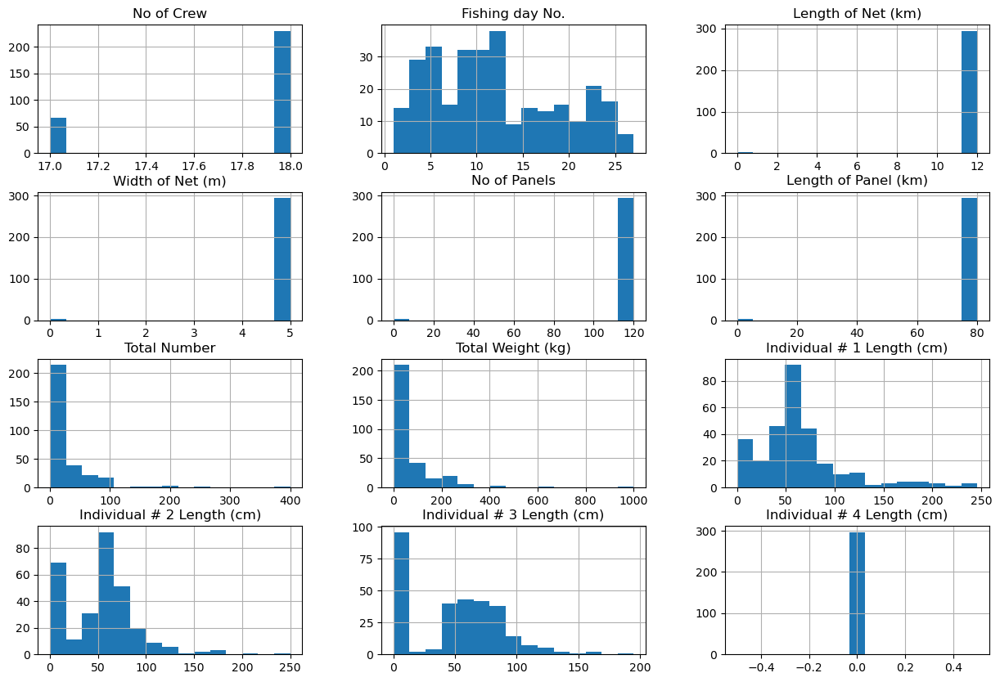

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3399266137.py:50: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')


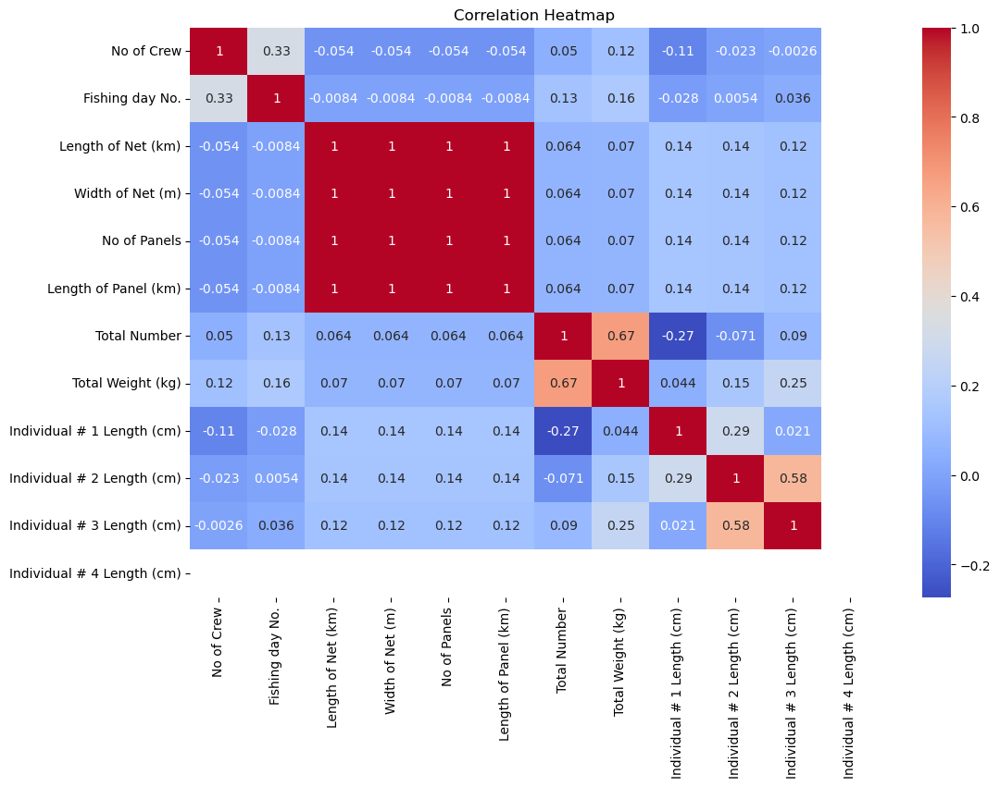

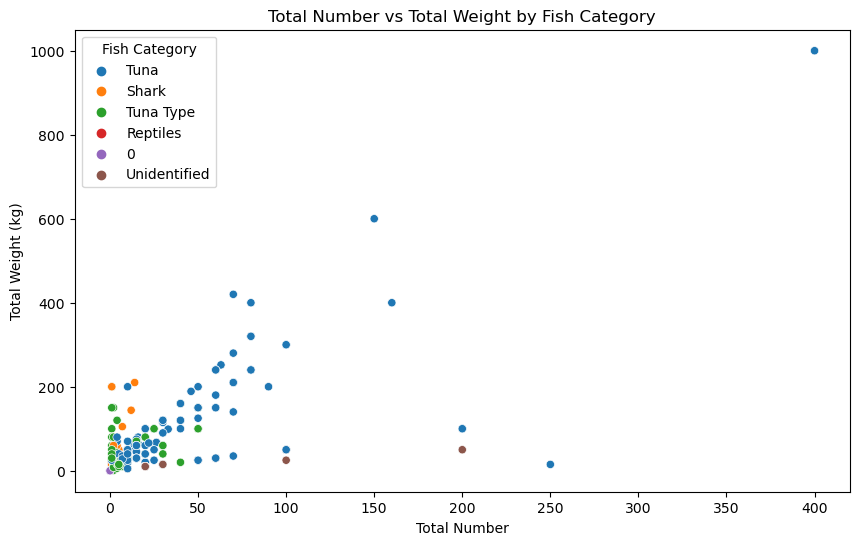

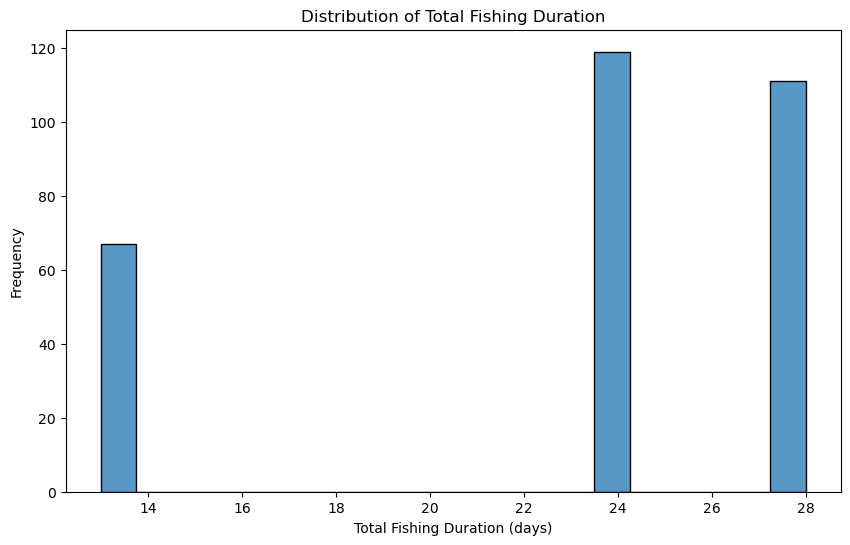

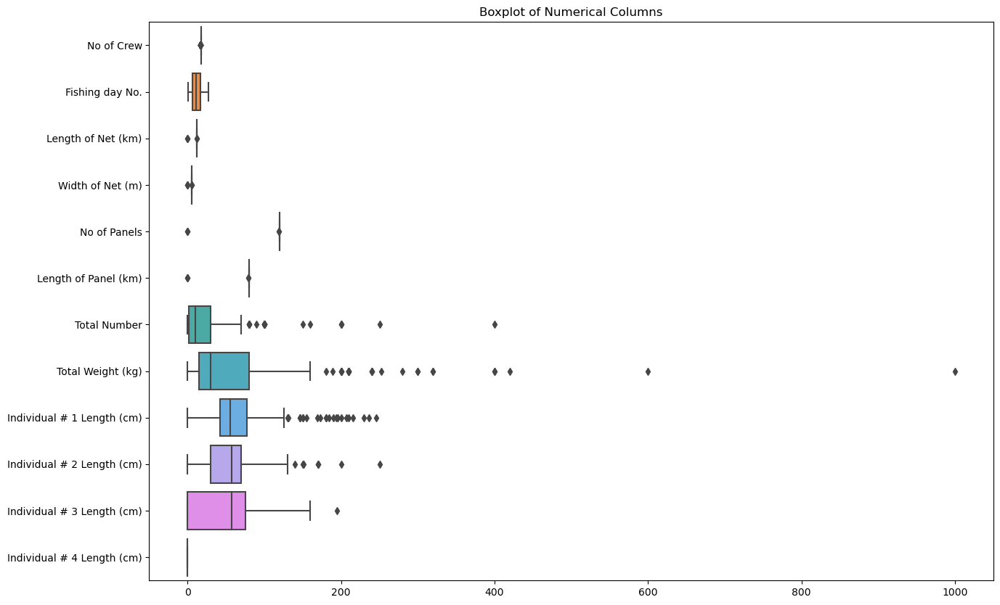

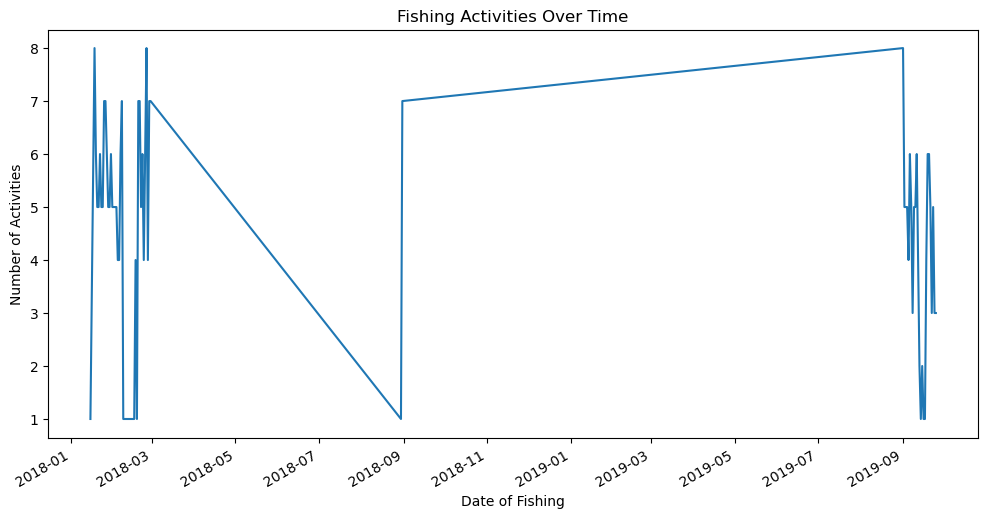

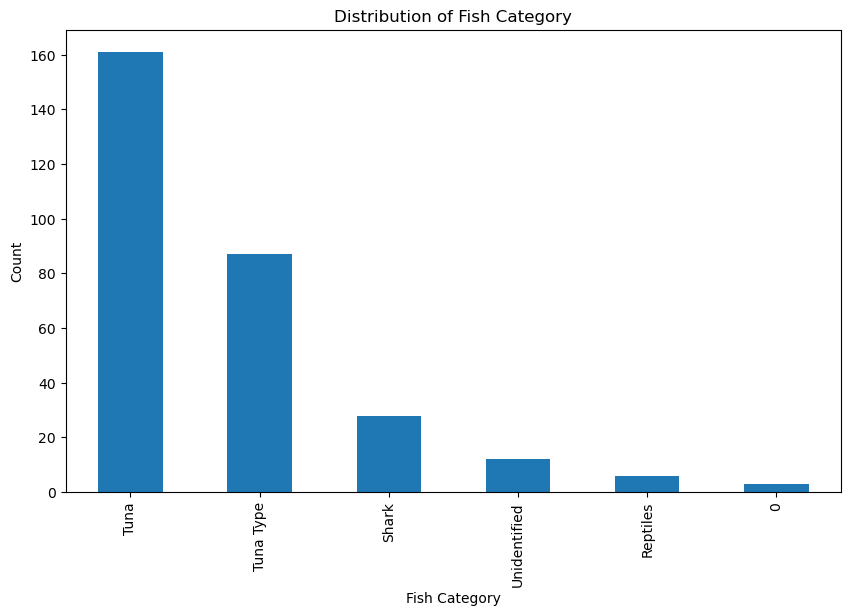

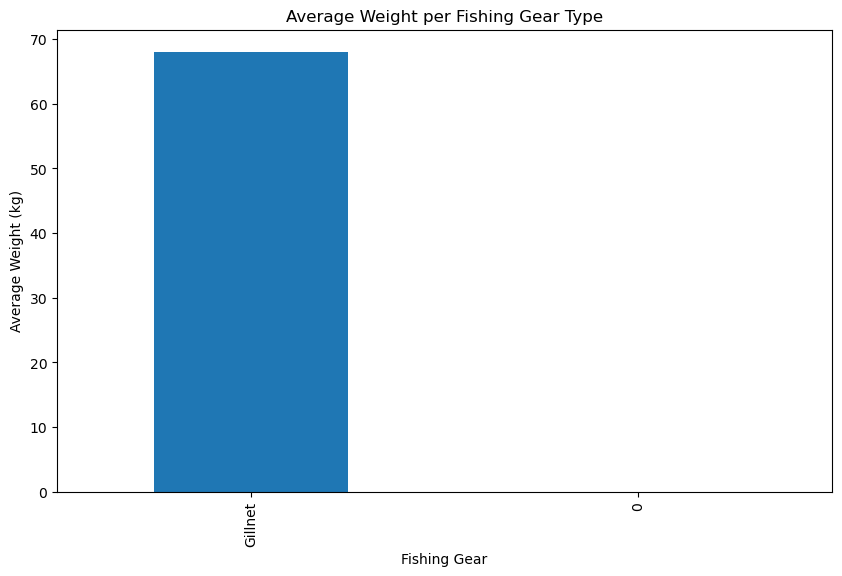

ANOVA test result: F-statistic = 6.437534293661681, p-value = 1.081142586724817e-05


KeyError: '[\'EMS\' \'Observer\' \'Boat name\' \'Boat Registration\' \'Boat Type\'\n \'Name of Departed Port\' \'Date of Departed Port\' \'Name of Arrival Port\'\n \'Date of Arrival Port\' \'Ship Captain Name\' \'Fishing Area\'\n \'Fish Catch Method\' \'Fishing Gear\' \'Date of Fishing\' \'fishing activity\'\n "GPS \'N E\'Nd of Set \'Net" "GPS \'E \'End of S\'Et N\'Et"\n \'GPS N Start of Net Haul\' \'GPS E End of Net Haul\' \'Fish Category\' \'Spp.\'\n \'Fish Types\' \'Record of Interaction\' \'Status at Capture\'\n \'Status at Release\' \'Status of Fish Catch\' \'Total Weight (kg)\'] not found in axis'

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import xgboost as xgb
import shap
import joblib
from fpdf import FPDF

# Step 1: Load the Data
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Step 2: Data Cleaning

# Convert date columns to datetime
date_columns = ['Date of Departed Port', 'Date of Arrival Port', 'Date of Fishing']
for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce')

# Check for missing values
missing_values = df.isnull().sum()

# Fill missing numerical values with the mean of the column
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())

# Fill missing categorical values with the mode of the column
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# Step 3: Descriptive Statistics
desc_stats = df.describe()

# Step 4: Data Visualization

# Plotting histograms for numerical columns
df[numerical_cols].hist(bins=15, figsize=(15, 10), layout=(4, 3))
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# Step 5: Analysis of Specific Columns

# Example Analysis: Total Number and Total Weight
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Total Number', y='Total Weight (kg)', hue='Fish Category', data=df)
plt.title('Total Number vs Total Weight by Fish Category')
plt.xlabel('Total Number')
plt.ylabel('Total Weight (kg)')
plt.legend(title='Fish Category')
plt.show()

# Fishing duration analysis
df['Total fishing duration'] = df['Total fishing duration'].str.extract('(\d+)').astype(float)

plt.figure(figsize=(10, 6))
sns.histplot(df['Total fishing duration'], bins=20)
plt.title('Distribution of Total Fishing Duration')
plt.xlabel('Total Fishing Duration (days)')
plt.ylabel('Frequency')
plt.show()

# Step 6: Additional Analysis

# Boxplot for numerical columns to detect outliers
plt.figure(figsize=(15, 10))
sns.boxplot(data=df[numerical_cols], orient='h')
plt.title('Boxplot of Numerical Columns')
plt.show()

# Time Series Analysis: Fishing activities over time
plt.figure(figsize=(12, 6))
df.groupby('Date of Fishing').size().plot()
plt.title('Fishing Activities Over Time')
plt.xlabel('Date of Fishing')
plt.ylabel('Number of Activities')
plt.show()

# Categorical Data Analysis: Distribution of Fish Category
plt.figure(figsize=(10, 6))
df['Fish Category'].value_counts().plot(kind='bar')
plt.title('Distribution of Fish Category')
plt.xlabel('Fish Category')
plt.ylabel('Count')
plt.show()

# Grouping and Aggregation: Average weight per fishing gear type
avg_weight_per_gear = df.groupby('Fishing Gear')['Total Weight (kg)'].mean().sort_values(ascending=False)
plt.figure(figsize=(10, 6))
avg_weight_per_gear.plot(kind='bar')
plt.title('Average Weight per Fishing Gear Type')
plt.xlabel('Fishing Gear')
plt.ylabel('Average Weight (kg)')
plt.show()

# Step 7: Hypothesis Testing

# Example: Testing if the average weight differs by fish category
categories = df['Fish Category'].unique()
weights_by_category = [df[df['Fish Category'] == category]['Total Weight (kg)'].dropna() for category in categories]

f_stat, p_val = stats.f_oneway(*weights_by_category)
print(f"ANOVA test result: F-statistic = {f_stat}, p-value = {p_val}")

# Step 8: Feature Engineering

# Create new features from existing data
df['Fishing Duration (hours)'] = df['Total fishing duration'] * 24
df['Net Area (sqm)'] = df['Length of Net (km)'] * 1000 * df['Width of Net (m)']

# Polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
poly_features = poly.fit_transform(df[['Total Number', 'Length of Net (km)', 'Width of Net (m)', 'No of Panels', 'Length of Panel (km)', 'Total fishing duration']])
poly_feature_names = poly.get_feature_names_out(['Total Number', 'Length of Net (km)', 'Width of Net (m)', 'No of Panels', 'Length of Panel (km)', 'Total fishing duration'])

# Create a DataFrame with the polynomial features
poly_df = pd.DataFrame(poly_features, columns=poly_feature_names)
df = pd.concat([df, poly_df], axis=1)

# Step 9: Machine Learning Models

# Prepare data for modeling
features = df.drop(columns=['EMS', 'Observer', 'Boat name', 'Boat Registration', 'Boat Type', 'Name of Departed Port', 'Date of Departed Port', 'Name of Arrival Port', 'Date of Arrival Port', 'Ship Captain Name', 'Fishing Area', 'Fish Catch Method', 'Fishing Gear', 'Date of Fishing', 'fishing activity', 'GPS \'N E\'Nd of Set \'Net', 'GPS \'E \'End of S\'Et N\'Et', 'GPS N Start of Net Haul', 'GPS E End of Net Haul', 'Fish Category', 'Spp.', 'Fish Types', 'Record of Interaction', 'Status at Capture', 'Status at Release', 'Status of Fish Catch', 'Total Weight (kg)'])
X = features
y = df['Total Weight (kg)']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

# Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# XGBoost model
xgb_model = xgb.XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# Hyperparameter Tuning with GridSearchCV
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid_rf, cv=5, n_jobs=-1, scoring='r2')
grid_search_rf.fit(X_train, y_train)
best_rf_model = grid_search_rf.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)
r2_best_rf = r2_score(y_test, y_pred_best_rf)

param_grid_gb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}
grid_search_gb = GridSearchCV(estimator=gb_model, param_grid=param_grid_gb, cv=5, n_jobs=-1, scoring='r2')
grid_search_gb.fit(X_train, y_train)
best_gb_model = grid_search_gb.best_estimator_
y_pred_best_gb = best_gb_model.predict(X_test)
mse_best_gb = mean_squared_error(y_test, y_pred_best_gb)
r2_best_gb = r2_score(y_test, y_pred_best_gb)

param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}
grid_search_xgb = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, cv=5, n_jobs=-1, scoring='r2')
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_
y_pred_best_xgb = best_xgb_model.predict(X_test)
mse_best_xgb = mean_squared_error(y_test, y_pred_best_xgb)
r2_best_xgb = r2_score(y_test, y_pred_best_xgb)

# Model Ensemble: Stacking
estimators = [
    ('rf', best_rf_model),
    ('gb', best_gb_model),
    ('xgb', best_xgb_model)
]
stacking_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

# Compare model performance
model_performance = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'Best Random Forest', 'Best Gradient Boosting', 'Best XGBoost', 'Stacking Ensemble'],
    'MSE': [mse_lr, mse_rf, mse_gb, mse_xgb, mse_best_rf, mse_best_gb, mse_best_xgb, mse_stacking],
    'R-squared': [r2_lr, r2_rf, r2_gb, r2_xgb, r2_best_rf, r2_best_gb, r2_best_xgb, r2_stacking]
})

print(model_performance)

# Plotting actual vs predicted for best model (e.g., Stacking Ensemble)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking)
plt.xlabel('Actual Total Weight (kg)')
plt.ylabel('Predicted Total Weight (kg)')
plt.title('Actual vs Predicted Total Weight (Stacking Ensemble)')
plt.show()

# Feature Importance from Best XGBoost
importances = best_xgb_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance (Best XGBoost)')
plt.show()

# Step 10: Model Interpretation using SHAP
explainer = shap.Explainer(best_xgb_model, X_train)
shap_values = explainer(X_test)

# SHAP summary plot
shap.summary_plot(shap_values, X_test, plot_type='bar')

# SHAP individual prediction explanation
shap.plots.waterfall(shap_values[0])

# Step 11: Residual Analysis

# Residuals for the best model
residuals = y_test - y_pred_stacking

plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution (Stacking Ensemble)')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_stacking, residuals)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Predicted Total Weight (kg)')
plt.ylabel('Residual')
plt.title('Residuals vs Predicted (Stacking Ensemble)')
plt.show()

# Step 12: Cross-Validation
cv_scores_rf = cross_val_score(best_rf_model, X_scaled, y, cv=10, scoring='r2')
cv_scores_gb = cross_val_score(best_gb_model, X_scaled, y, cv=10, scoring='r2')
cv_scores_xgb = cross_val_score(best_xgb_model, X_scaled, y, cv=10, scoring='r2')
cv_scores_stacking = cross_val_score(stacking_model, X_scaled, y, cv=10, scoring='r2')

print(f"Cross-Validation R-squared scores (Random Forest): {cv_scores_rf}")
print(f"Mean R-squared score (Random Forest): {cv_scores_rf.mean()}")
print(f"Cross-Validation R-squared scores (Gradient Boosting): {cv_scores_gb}")
print(f"Mean R-squared score (Gradient Boosting): {cv_scores_gb.mean()}")
print(f"Cross-Validation R-squared scores (XGBoost): {cv_scores_xgb}")
print(f"Mean R-squared score (XGBoost): {cv_scores_xgb.mean()}")
print(f"Cross-Validation R-squared scores (Stacking Ensemble): {cv_scores_stacking}")
print(f"Mean R-squared score (Stacking Ensemble): {cv_scores_stacking.mean()}")

# Step 13: Export Cleaned Data
cleaned_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\EMS_June_2024_Cleaned.xlsx'
df.to_excel(cleaned_file_path, index=False)

# Step 14: Serialize Model for Deployment
model_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\best_model.joblib'
joblib.dump(stacking_model, model_file_path)

# Step 15: Generate Automated Report
class PDFReport(FPDF):
    def header(self):
        self.set_font('Arial', 'B', 12)
        self.cell(0, 10, 'Comprehensive Data Analysis Report', 0, 1, 'C')

    def chapter_title(self, title):
        self.set_font('Arial', 'B', 12)
        self.cell(0, 10, title, 0, 1, 'L')
        self.ln(5)

    def chapter_body(self, body):
        self.set_font('Arial', '', 12)
        self.multi_cell(0, 10, body)
        self.ln()

    def add_figure(self, fig_path):
        self.image(fig_path, x=10, y=None, w=190)
        self.ln()

pdf = PDFReport()

# Add Descriptive Statistics
pdf.add_page()
pdf.chapter_title('Descriptive Statistics')
pdf.chapter_body(desc_stats.to_string())

# Add Missing Values
pdf.add_page()
pdf.chapter_title('Missing Values')
pdf.chapter_body(missing_values.to_string())

# Add Hypothesis Testing Results
pdf.add_page()
pdf.chapter_title('Hypothesis Testing')
pdf.chapter_body(f"ANOVA test result: F-statistic = {f_stat}, p-value = {p_val}")

# Add Model Performance
pdf.add_page()
pdf.chapter_title('Model Performance')
pdf.chapter_body(model_performance.to_string())

# Add Cross-Validation Scores
pdf.add_page()
pdf.chapter_title('Cross-Validation Scores')
cv_scores = f"""
Random Forest: {cv_scores_rf}, Mean R-squared: {cv_scores_rf.mean()}
Gradient Boosting: {cv_scores_gb}, Mean R-squared: {cv_scores_gb.mean()}
XGBoost: {cv_scores_xgb}, Mean R-squared: {cv_scores_xgb.mean()}
Stacking Ensemble: {cv_scores_stacking}, Mean R-squared: {cv_scores_stacking.mean()}
"""
pdf.chapter_body(cv_scores)

# Save Report
report_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\analysis_report.pdf'
pdf.output(report_file_path)

# Display paths to saved files
#print(f"Cleaned data saved to: {cleaned_file_path}")
print(f"Best model saved to: {model_file_path}")
print(f"Analysis report saved to: {report_file_path}")


# Additional Analysis

# Species and Constants

1.	Yellowfin Tuna (Thunnus albacares)
o	Constants: a=0.0000245a = 0.0000245a=0.0000245, b=2.94b = 2.94b=2.94
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
2.	Skipjack Tuna (Katsuwonus pelamis)
o	Constants: a=0.0000261a = 0.0000261a=0.0000261, b=2.91b = 2.91b=2.91
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
3.	Dolphinfish (Coryphaena hippurus)
o	Constants: a=0.019a = 0.019a=0.019, b=2.75b = 2.75b=2.75
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
4.	Marlin Spp. (Makaira nigricans)
o	Constants: a=0.0000163a = 0.0000163a=0.0000163, b=2.96b = 2.96b=2.96
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
5.	Bullet/Frigate Tuna (Auxis spp.)
o	Constants: a=0.000041a = 0.000041a=0.000041, b=2.78b = 2.78b=2.78
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
6.	Shark Spp.
o	Constants: a=0.0000082a = 0.0000082a=0.0000082, b=3.05b = 3.05b=3.05
o	Reference: Generalized values. FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
7.	Swordfish (Xiphias gladius)
o	Constants: a=0.000028a = 0.000028a=0.000028, b=2.89b = 2.89b=2.89
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
8.	Mako Shark (Isurus spp.)
o	Constants: a=0.000011a = 0.000011a=0.000011, b=3.15b = 3.15b=3.15
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
9.	Kawakawa (Euthynnus affinis)
o	Constants: a=0.000022a = 0.000022a=0.000022, b=2.98b = 2.98b=2.98
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).
10.	Spanish Mackerel (Scomberomorus commerson)
o	Constants: a=0.000015a = 0.000015a=0.000015, b=2.95b = 2.95b=2.95
o	Reference: FishBase (Froese, R. and D. Pauly. Editors. 2021. FishBase. World Wide Web electronic publication. www.fishbase.org, version (12/2021)).

# Growth Parameters for Yellowfin Tuna

Growth Parameters for Yellowfin Tuna: Defined the constants 
𝑎
=
0.0000245
a=0.0000245 and 
𝑏
=
2.94
b=2.94 for Yellowfin Tuna.

Detailed Growth Estimates for Yellowfin Tuna:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            49.0                    0.0             49.730860
              2            56.0                    0.2             60.028466
              3            57.0                    0.2             60.028466
              4            57.0                    0.2             60.028466
              5            56.0                    0.2             60.028466
              6            57.0                    0.2             60.028466
              7            60.0                    0.2             60.028466
              8            47.0                    0.0             49.730860
              9            58.0                    0.2             60.028466
             10            47.0                    0.0             49.730860
             11            50.0                    0.1             54.974905
             12            57.

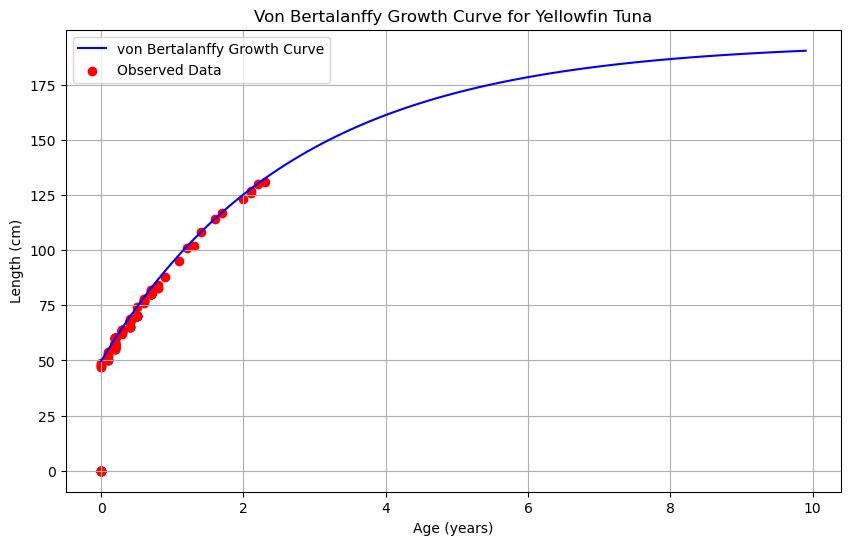

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Yellowfin Tuna data
yellowfin_df = df[df['Spp.'].str.contains("Yellowfin", na=False)]

# Combine lengths from different columns for Yellowfin Tuna
yellowfin_lengths = pd.concat([
    yellowfin_df['Individual # 1 Length (cm)'],
    yellowfin_df['Individual # 2 Length (cm)'],
    yellowfin_df['Individual # 3 Length (cm)']
]).dropna()

# Indian Ocean yellowfin tuna growth parameters
L_inf = 194.1  # cm
K = 0.37  # per year
t_0 = -0.8  # years

# Von Bertalanffy Growth Function
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, L_inf, K, t_0):
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in yellowfin_lengths:
    age, expected_length = calculate_length_at_age(length, L_inf, K, t_0)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Yellowfin Tuna:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy(L_inf, K, t, t_0) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Yellowfin Tuna')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Yellowfin_Tuna_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)

Detailed Growth Estimates for Yellowfin Tuna (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            49.0                    0.4             49.858422
              2            56.0                    0.6             58.833515
              3            57.0                    0.6             59.188777
              4            57.0                    0.6             59.188777
              5            56.0                    0.6             58.833515
              6            57.0                    0.6             59.188777
              7            60.0                    0.6             60.230486
              8            47.0                    0.4             49.156695
              9            58.0                    0.6             59.539949
             10            47.0                    0.4             49.156695
             11            50.0                    0.4             50.202212
             12        

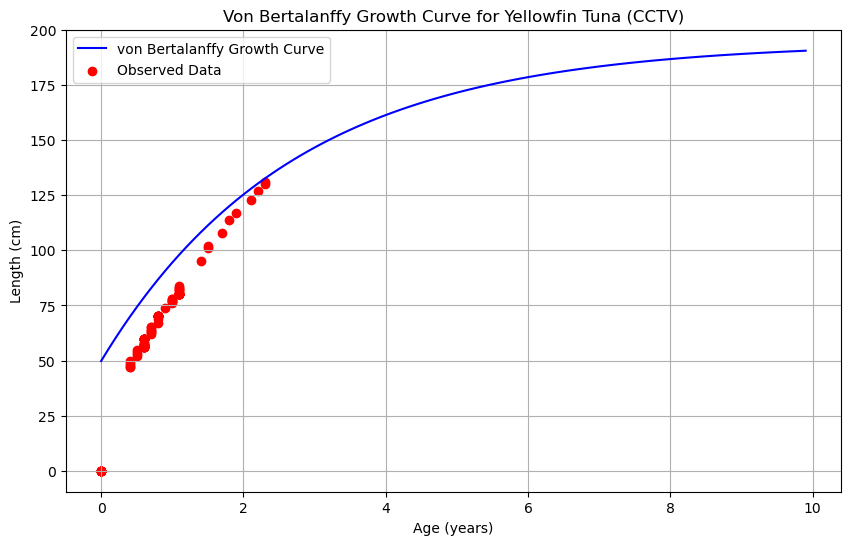

Detailed Growth Estimates for Yellowfin Tuna (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            63.0                    0.7             64.515991
              2            68.0                    0.8             69.455587
              3            64.0                    0.7             64.862504
              4            65.0                    0.7             65.205462
              5            64.0                    0.7             64.862504
              6            60.0                    0.6             60.230486
              7            48.0                    0.4             49.509970
              8            50.0                    0.4             50.202212
              9            50.0                    0.4             50.202212
             10           126.0                    2.1            126.171428
             11             0.0                    0.0              0.000000
             12  

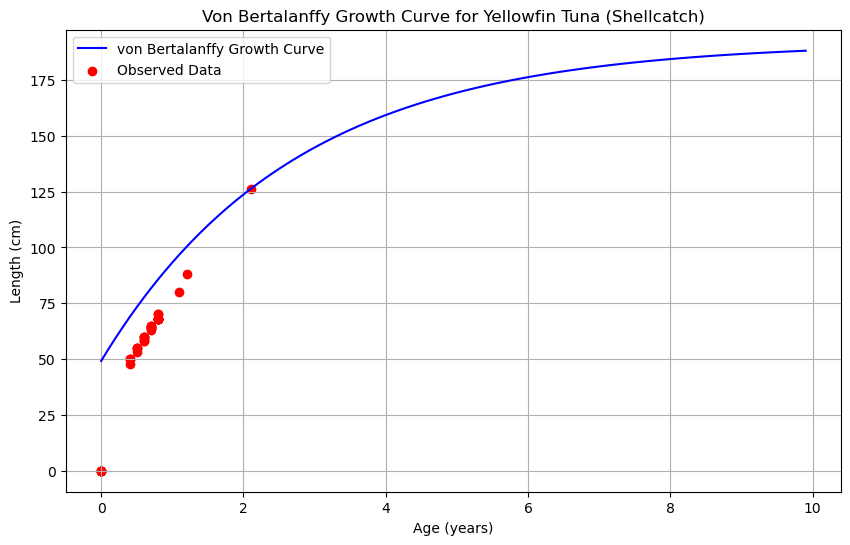

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Yellowfin Tuna data
yellowfin_df = df[df['Spp.'].str.contains("Yellowfin", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_yellowfin_df = yellowfin_df[yellowfin_df['EMS'] == 'CCTV']
shellcatch_yellowfin_df = yellowfin_df[yellowfin_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Yellowfin Tuna
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_yellowfin_lengths = get_combined_lengths(cctv_yellowfin_df)
shellcatch_yellowfin_lengths = get_combined_lengths(shellcatch_yellowfin_df)

# Yellowfin Tuna growth parameters
a = 0.0000245
b = 2.94

# Von Bertalanffy Growth Function for Yellowfin Tuna
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Yellowfin Tuna ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Yellowfin Tuna ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_yellowfin_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_yellowfin_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Yellowfin_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Yellowfin_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Skipjack

Growth Parameters for Skipjack: Defined the constants 
𝑎
=
0.0000261
a=0.0000261 and 
𝑏
=
2.91
b=2.91 for Skipjack Tuna.

Detailed Growth Estimates for Skipjack Tuna:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1             0.0                    0.0              0.000000
              2            50.0                    0.4             51.690075
              3            50.0                    0.4             51.690075
              4            53.0                    0.5             56.162718
              5            50.0                    0.4             51.690075
              6            52.0                    0.4             52.391465
              7            51.0                    0.4             52.043027
              8            46.0                    0.3             46.842595
              9            51.0                    0.4             52.043027
             10            50.0                    0.4             51.690075
             11            50.0                    0.4             51.690075
             12            50.0

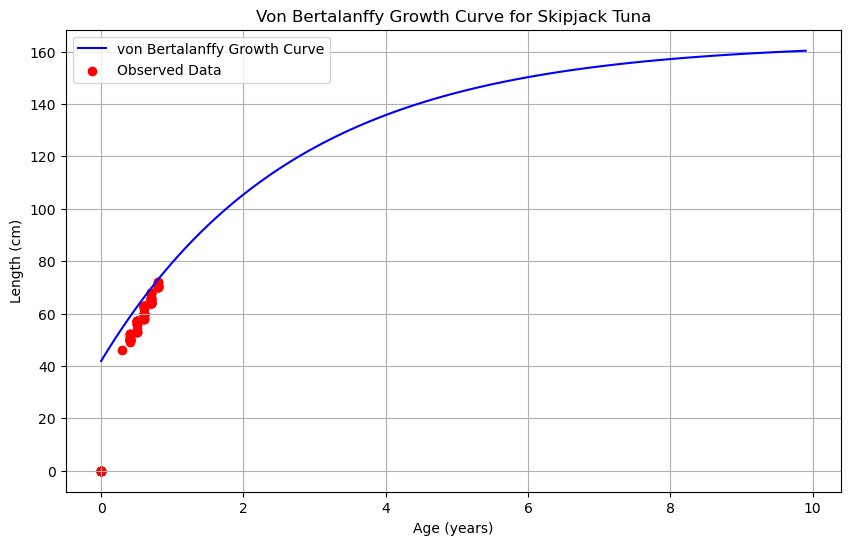

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Skipjack Tuna data
skipjack_df = df[df['Spp.'].str.contains("Skipjack", na=False)]

# Combine lengths from different columns for Skipjack Tuna
skipjack_lengths = pd.concat([
    skipjack_df['Individual # 1 Length (cm)'],
    skipjack_df['Individual # 2 Length (cm)'],
    skipjack_df['Individual # 3 Length (cm)']
]).dropna()

# Skipjack Tuna growth parameters
a = 0.0000261
b = 2.91

# Von Bertalanffy Growth Function for Skipjack
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in skipjack_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Skipjack Tuna:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((skipjack_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Skipjack Tuna')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Skipjack_Tuna_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Skipjack Tuna (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1             0.0                    0.0              0.000000
              2            50.0                    0.4             51.690075
              3            50.0                    0.4             51.690075
              4            53.0                    0.5             56.162718
              5            50.0                    0.4             51.690075
              6            52.0                    0.4             52.391465
              7            51.0                    0.4             52.043027
              8            46.0                    0.3             46.842595
              9            51.0                    0.4             52.043027
             10            50.0                    0.4             51.690075
             11            50.0                    0.4             51.690075
             12         

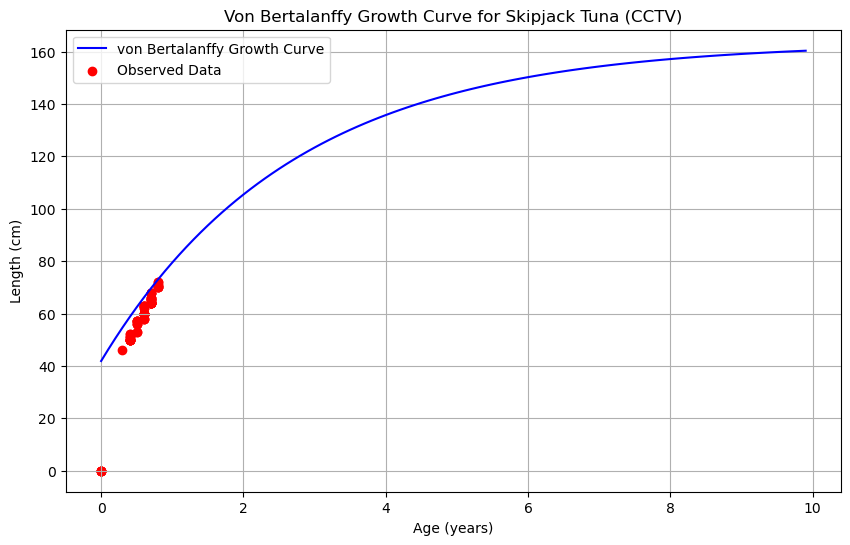

Detailed Growth Estimates for Skipjack Tuna (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            50.0                    0.4             51.690075
              2            49.0                    0.4             51.332459
              3            53.0                    0.5             56.162718
              4             0.0                    0.0              0.000000
              5            52.0                    0.4             52.391465
              6            54.0                    0.5             56.524636
              7            57.0                    0.5             57.584669
              8             0.0                    0.0              0.000000
              9            64.0                    0.7             66.842695
             10            59.0                    0.6             61.697846
             11            68.0                    0.7             68.249850
             12   

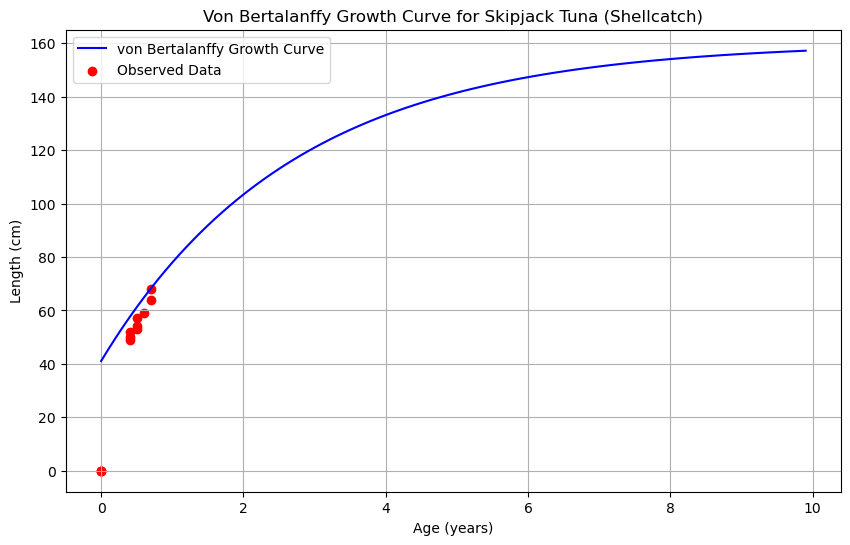

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Skipjack Tuna data
skipjack_df = df[df['Spp.'].str.contains("Skipjack", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_skipjack_df = skipjack_df[skipjack_df['EMS'] == 'CCTV']
shellcatch_skipjack_df = skipjack_df[skipjack_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Skipjack Tuna
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_skipjack_lengths = get_combined_lengths(cctv_skipjack_df)
shellcatch_skipjack_lengths = get_combined_lengths(shellcatch_skipjack_df)

# Skipjack Tuna growth parameters
a = 0.0000261
b = 2.91

# Von Bertalanffy Growth Function for Skipjack Tuna
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Skipjack Tuna ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Skipjack Tuna ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_skipjack_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_skipjack_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Skipjack_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Skipjack_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Bullet/Frigate Tuna

Growth Parameters for Bullet/Frigate Tuna: Defined the constants 
𝑎
=
0.000041
a=0.000041 and 
𝑏
=
2.78
b=2.78 for Bullet/Frigate Tuna.

Detailed Growth Estimates for Bullet/Frigate Tuna:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            35.0                    0.1             38.520722
              2            40.0                    0.1             40.416140
              3            35.0                    0.1             38.520722
              4            37.0                    0.1             39.298466
              5            33.0                    0.0             34.116445
              6            35.0                    0.1             38.520722
              7             0.0                    0.0              0.000000
              8            34.0                    0.0             34.484778
              9            36.0                    0.1             38.913053
             10            35.0                    0.1             38.520722
             11            33.0                    0.0             34.116445
             12          

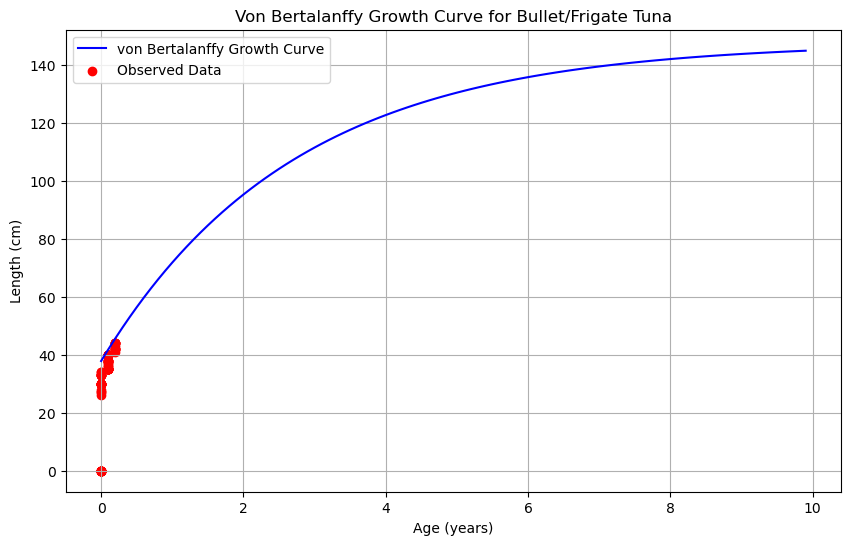

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Bullet/Frigate Tuna data
bullet_frigate_df = df[df['Spp.'].str.contains("Bullet/Frigate", na=False)]

# Combine lengths from different columns for Bullet/Frigate Tuna
bullet_frigate_lengths = pd.concat([
    bullet_frigate_df['Individual # 1 Length (cm)'],
    bullet_frigate_df['Individual # 2 Length (cm)'],
    bullet_frigate_df['Individual # 3 Length (cm)']
]).dropna()

# Bullet/Frigate Tuna growth parameters
a = 0.000041
b = 2.78

# Von Bertalanffy Growth Function for Bullet/Frigate Tuna
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in bullet_frigate_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Bullet/Frigate Tuna:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((bullet_frigate_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Bullet/Frigate Tuna')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Bullet_Frigate_Tuna_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Bullet/Frigate Tuna (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            35.0                    0.1             38.520722
              2            40.0                    0.1             40.416140
              3            35.0                    0.1             38.520722
              4            37.0                    0.1             39.298466
              5            33.0                    0.0             34.116445
              6            35.0                    0.1             38.520722
              7             0.0                    0.0              0.000000
              8            34.0                    0.0             34.484778
              9            36.0                    0.1             38.913053
             10            35.0                    0.1             38.520722
             11            33.0                    0.0             34.116445
             12   

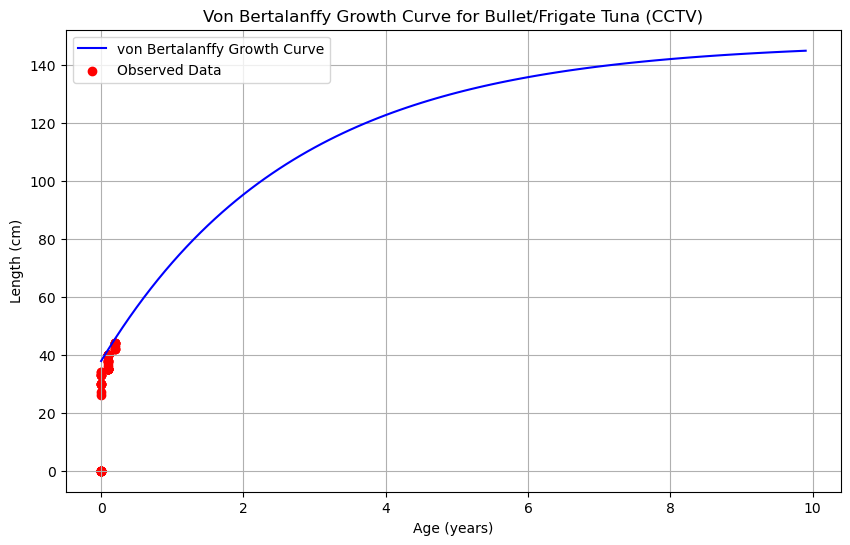

Detailed Growth Estimates for Bullet/Frigate Tuna (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1             0.0                    0.0              0.000000
              2            30.0                    0.0             32.966612
              3            30.0                    0.0             32.966612
              4            30.0                    0.0             32.966612
              5            27.0                    0.0             31.740575
              6            28.0                    0.0             32.158530
              7            36.0                    0.1             38.913053
              8             0.0                    0.0              0.000000
              9             0.0                    0.0              0.000000
             10            38.0                    0.1             39.677266
             11            33.0                    0.0             34.116445
            

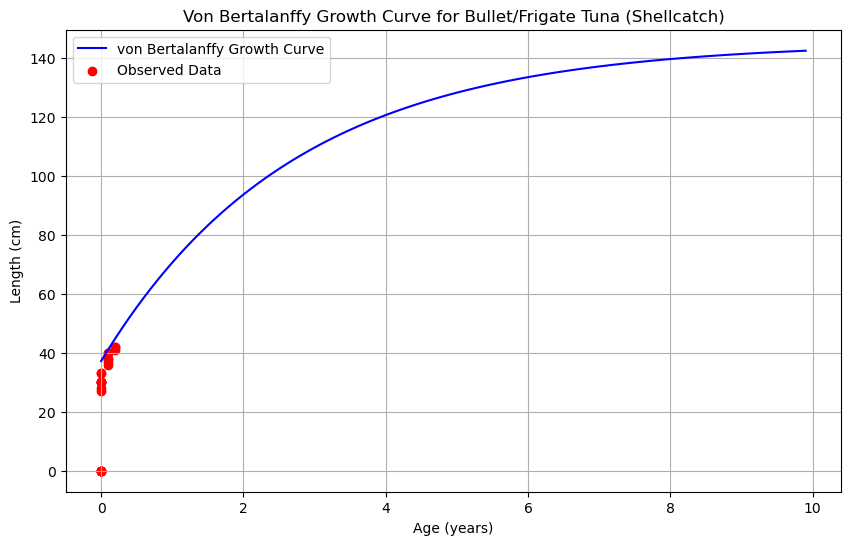

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Bullet/Frigate Tuna data
bullet_frigate_df = df[df['Spp.'].str.contains("Bullet/Frigate", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_bullet_frigate_df = bullet_frigate_df[bullet_frigate_df['EMS'] == 'CCTV']
shellcatch_bullet_frigate_df = bullet_frigate_df[bullet_frigate_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Bullet/Frigate Tuna
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_bullet_frigate_lengths = get_combined_lengths(cctv_bullet_frigate_df)
shellcatch_bullet_frigate_lengths = get_combined_lengths(shellcatch_bullet_frigate_df)

# Bullet/Frigate Tuna growth parameters
a = 0.000041
b = 2.78

# Von Bertalanffy Growth Function for Bullet/Frigate Tuna
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Bullet/Frigate Tuna ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Bullet/Frigate Tuna ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_bullet_frigate_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_bullet_frigate_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Bullet_Frigate_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Bullet_Frigate_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Kawakawa

Growth Parameters for Kawakawa: Defined the constants 
𝑎
=
0.000022
a=0.000022 and 
𝑏
=
2.98
b=2.98 for Kawakawa.

Detailed Growth Estimates for Kawakawa:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            52.0                    0.5             52.560718
              2            47.0                    0.4             47.707111
              3            48.0                    0.4             48.045351
              4            48.0                    0.4             48.045351
              5            48.0                    0.4             48.045351
              6            48.0                    0.4             48.045351
              7            50.0                    0.5             51.873482
              8            50.0                    0.5             51.873482
              9             0.0                    0.0              0.000000
             10            48.0                    0.4             48.045351
             11            50.0                    0.5             51.873482
             12            50.0     

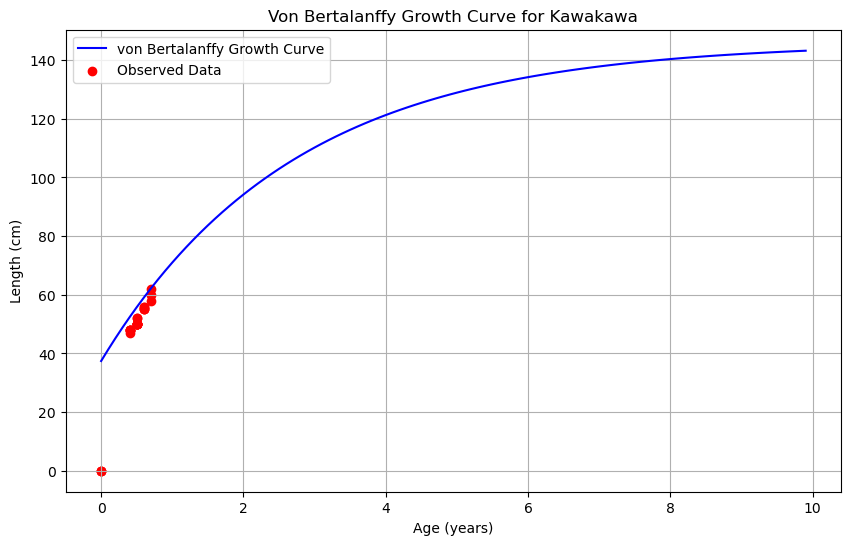

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Kawakawa data
kawakawa_df = df[df['Spp.'].str.contains("Kawakawa", na=False)]

# Combine lengths from different columns for Kawakawa
kawakawa_lengths = pd.concat([
    kawakawa_df['Individual # 1 Length (cm)'],
    kawakawa_df['Individual # 2 Length (cm)'],
    kawakawa_df['Individual # 3 Length (cm)']
]).dropna()

# Kawakawa growth parameters
a = 0.000022
b = 2.98

# Von Bertalanffy Growth Function for Kawakawa
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in kawakawa_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Kawakawa:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((kawakawa_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Kawakawa')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Kawakawa_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Kawakawa (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            52.0                    0.5             52.560718
              2            47.0                    0.4             47.707111
              3            48.0                    0.4             48.045351
              4            48.0                    0.4             48.045351
              5            48.0                    0.4             48.045351
              6            50.0                    0.5             51.873482
              7            50.0                    0.5             51.873482
              8            50.0                    0.5             51.873482
              9            56.0                    0.6             57.052916
             10            55.0                    0.6             56.708988
             11            56.0                    0.6             57.052916
             12            60

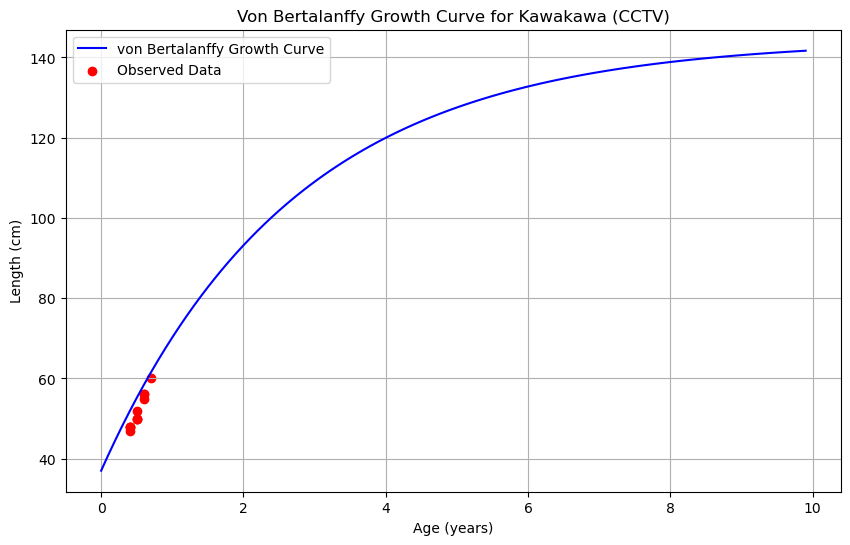

Detailed Growth Estimates for Kawakawa (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            48.0                    0.4             48.045351
              2            48.0                    0.4             48.045351
              3            50.0                    0.5             51.873482
              4            50.0                    0.5             51.873482
              5             0.0                    0.0              0.000000
              6            52.0                    0.5             52.560718
              7            50.0                    0.5             51.873482
              8            58.0                    0.7             60.818499
              9            55.0                    0.6             56.708988
             10             0.0                    0.0              0.000000
             11            50.0                    0.5             51.873482
             12        

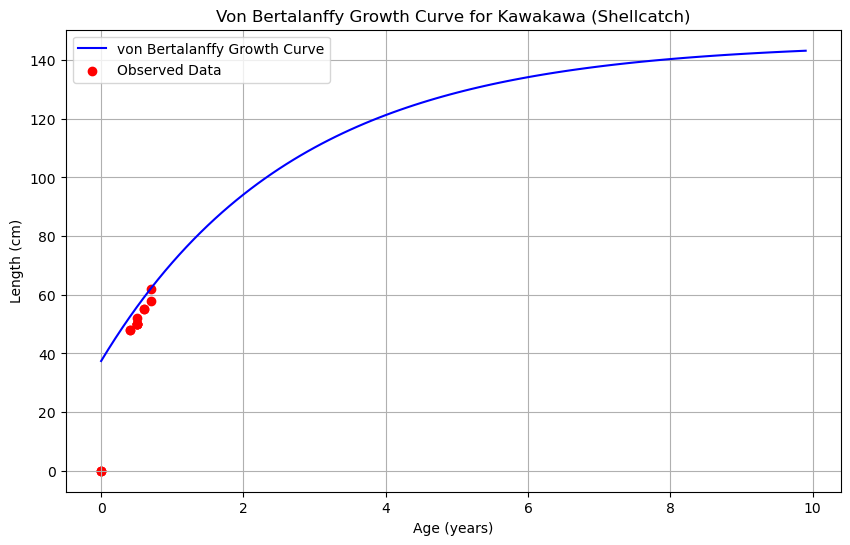

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Kawakawa data
kawakawa_df = df[df['Spp.'].str.contains("Kawakawa", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_kawakawa_df = kawakawa_df[kawakawa_df['EMS'] == 'CCTV']
shellcatch_kawakawa_df = kawakawa_df[kawakawa_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Kawakawa
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_kawakawa_lengths = get_combined_lengths(cctv_kawakawa_df)
shellcatch_kawakawa_lengths = get_combined_lengths(shellcatch_kawakawa_df)

# Kawakawa growth parameters
a = 0.000022
b = 2.98

# Von Bertalanffy Growth Function for Kawakawa
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Kawakawa ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Kawakawa ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_kawakawa_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_kawakawa_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Kawakawa_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Kawakawa_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Spanish Mackerel

Growth Parameters for Spanish Mackerel: Defined the constants 
𝑎
=
0.000015
a=0.000015 and 
𝑏
=
2.95
b=2.95 for Spanish Mackerel.

Detailed Growth Estimates for Spanish Mackerel:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            80.0                    0.7             81.222149
              2            80.0                    0.7             81.222149
              3            80.0                    0.7             81.222149
              4            80.0                    0.7             81.222149
              5            78.0                    0.7             80.528058
              6            79.0                    0.7             80.876556
              7            80.0                    0.7             81.222149
              8            77.0                    0.7             80.176595
              9             0.0                    0.0              0.000000
             10            77.0                    0.7             80.176595
             11            84.0                    0.8             86.619434
             12            8

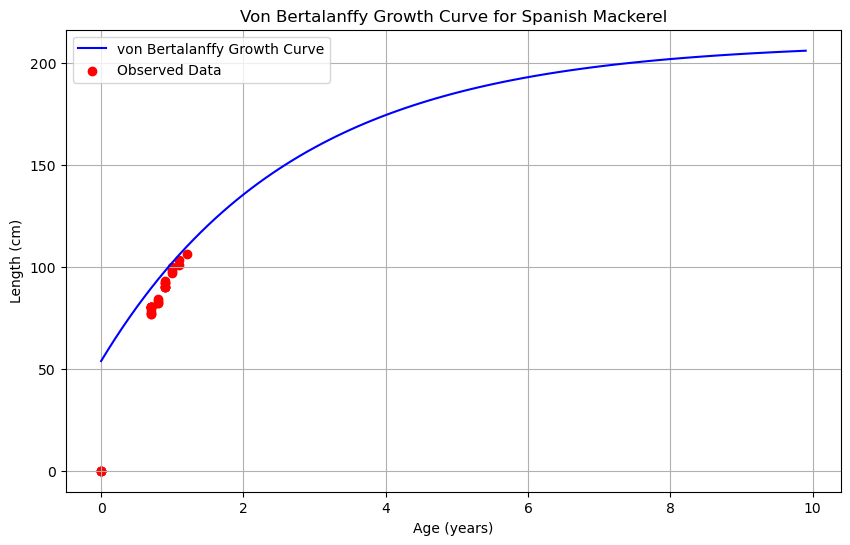

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Spanish Mackerel data
spanish_mackerel_df = df[df['Spp.'].str.contains("Spanish Mackerel", na=False)]

# Combine lengths from different columns for Spanish Mackerel
spanish_mackerel_lengths = pd.concat([
    spanish_mackerel_df['Individual # 1 Length (cm)'],
    spanish_mackerel_df['Individual # 2 Length (cm)'],
    spanish_mackerel_df['Individual # 3 Length (cm)']
]).dropna()

# Spanish Mackerel growth parameters
a = 0.000015
b = 2.95

# Von Bertalanffy Growth Function for Spanish Mackerel
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in spanish_mackerel_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Spanish Mackerel:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((spanish_mackerel_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Spanish Mackerel')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Spanish_Mackerel_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Spanish Mackerel (CCTV):
Empty DataFrame
Columns: []
Index: []


KeyError: 'Estimated Age (years)'

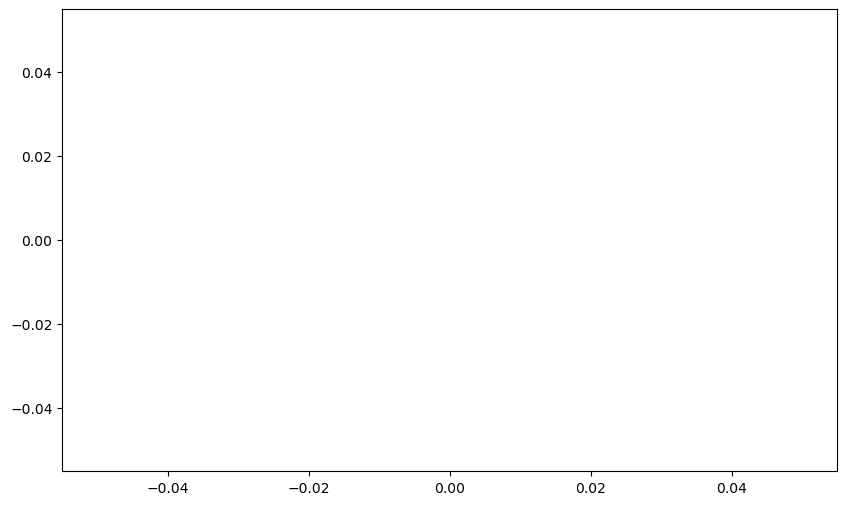

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Spanish Mackerel data
spanish_mackerel_df = df[df['Spp.'].str.contains("Spanish Mackerel", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_spanish_mackerel_df = spanish_mackerel_df[spanish_mackerel_df['EMS'] == 'CCTV']
shellcatch_spanish_mackerel_df = spanish_mackerel_df[spanish_mackerel_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Spanish Mackerel
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_spanish_mackerel_lengths = get_combined_lengths(cctv_spanish_mackerel_df)
shellcatch_spanish_mackerel_lengths = get_combined_lengths(shellcatch_spanish_mackerel_df)

# Spanish Mackerel growth parameters
a = 0.000015
b = 2.95

# Von Bertalanffy Growth Function for Spanish Mackerel
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Spanish Mackerel ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Spanish Mackerel ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_spanish_mackerel_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_spanish_mackerel_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Spanish_Mackerel_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Spanish_Mackerel_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Dolphinfish

Growth Parameters for Dolphinfish: Defined the constants 
𝑎
=
0.019
a=0.019 and 
𝑏
=
2.75
b=2.75 for Dolphinfish.

Detailed Growth Estimates for Dolphinfish:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            92.0                   10.9             21.589872
              2            90.0                   10.9             21.418007
              3            70.0                   10.9             19.547452
              4            85.0                   10.9             20.977430
              5             0.0                    0.0              0.000000
              6            78.0                   10.9             20.331986
              7            84.0                   10.9             20.887349
              8            80.0                   10.9             20.520037
              9            80.0                   10.9             20.520037
             10             0.0                    0.0              0.000000
             11            91.0                   10.9             21.504240
             12            82.0  

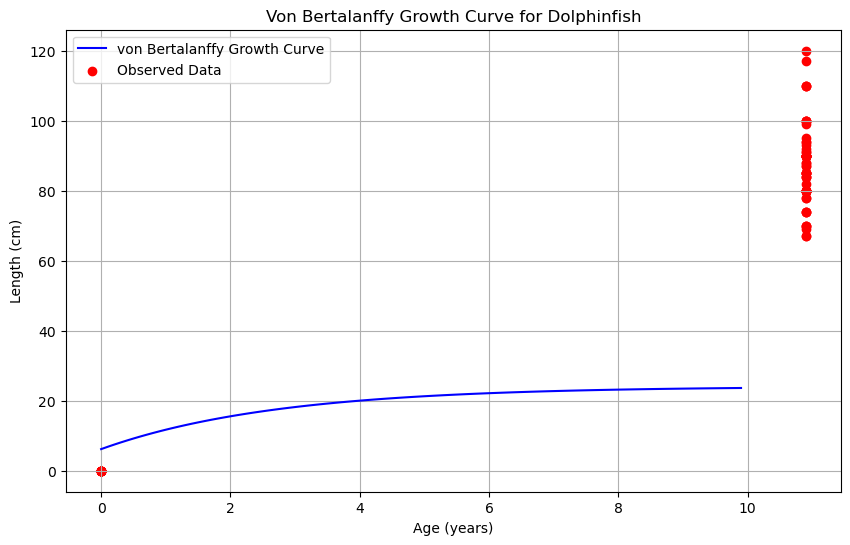

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Dolphinfish data
dolphinfish_df = df[df['Spp.'].str.contains("Dolphinfish", na=False)]

# Combine lengths from different columns for Dolphinfish
dolphinfish_lengths = pd.concat([
    dolphinfish_df['Individual # 1 Length (cm)'],
    dolphinfish_df['Individual # 2 Length (cm)'],
    dolphinfish_df['Individual # 3 Length (cm)']
]).dropna()

# Dolphinfish growth parameters
a = 0.019
b = 2.75

# Von Bertalanffy Growth Function for Dolphinfish
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in dolphinfish_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Dolphinfish:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((dolphinfish_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Dolphinfish')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
#output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Dolphinfish_Growth_Estimates.xlsx'
#results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Dolphinfish (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            92.0                   10.9             21.589872
              2            90.0                   10.9             21.418007
              3            70.0                   10.9             19.547452
              4            85.0                   10.9             20.977430
              5             0.0                    0.0              0.000000
              6            78.0                   10.9             20.331986
              7            84.0                   10.9             20.887349
              8            80.0                   10.9             20.520037
              9            80.0                   10.9             20.520037
             10             0.0                    0.0              0.000000
             11            91.0                   10.9             21.504240
             12           

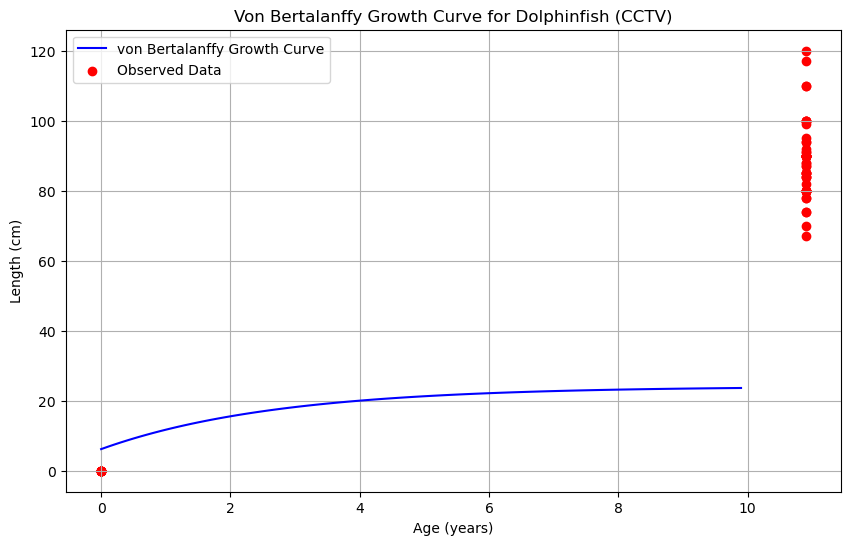

Detailed Growth Estimates for Dolphinfish (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1            70.0                   10.9             19.547452
              2            69.0                   10.9             19.445441
              3            74.0                   10.9             19.946469
              4            70.0                   10.9             19.547452
              5            67.0                   10.9             19.238562
              6            80.0                   10.9             20.520037
              7            80.0                   10.9             20.520037
              8            80.0                   10.9             20.520037
              9             0.0                    0.0              0.000000
             10            93.0                   10.9             21.674914
             11           110.0                   10.9             23.039339
             12     

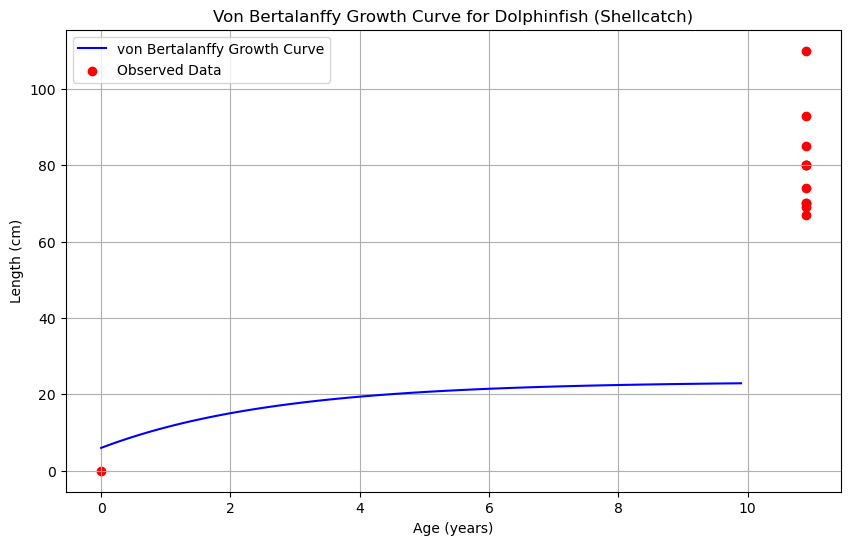

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Dolphinfish data
dolphinfish_df = df[df['Spp.'].str.contains("Dolphinfish", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_dolphinfish_df = dolphinfish_df[dolphinfish_df['EMS'] == 'CCTV']
shellcatch_dolphinfish_df = dolphinfish_df[dolphinfish_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Dolphinfish
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_dolphinfish_lengths = get_combined_lengths(cctv_dolphinfish_df)
shellcatch_dolphinfish_lengths = get_combined_lengths(shellcatch_dolphinfish_df)

# Dolphinfish growth parameters
a = 0.019
b = 2.75

# Von Bertalanffy Growth Function for Dolphinfish
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Dolphinfish ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Dolphinfish ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_dolphinfish_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_dolphinfish_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Dolphinfish_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Dolphinfish_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Growth Parameters for Mako Shark

Growth Parameters for Mako Shark: Defined the constants 
𝑎
=
0.000011
a=0.000011 and 
𝑏
=
3.15
b=3.15 for Mako Shark.

Detailed Growth Estimates for Mako Shark:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           123.0                    2.6            123.709029
              2           120.0                    2.5            120.905956
              3           120.0                    2.5            120.905956
              4           117.0                    2.4            118.046978
              5            90.0                    1.6             92.112440
              6           107.0                    2.1            108.804857
              7            90.0                    1.6             92.112440
              8           119.0                    2.5            120.585185
              9           150.0                    3.8            150.510859
             10             0.0                    0.0              0.000000
             11           170.0                    5.2            170.729381
             12           120.0   

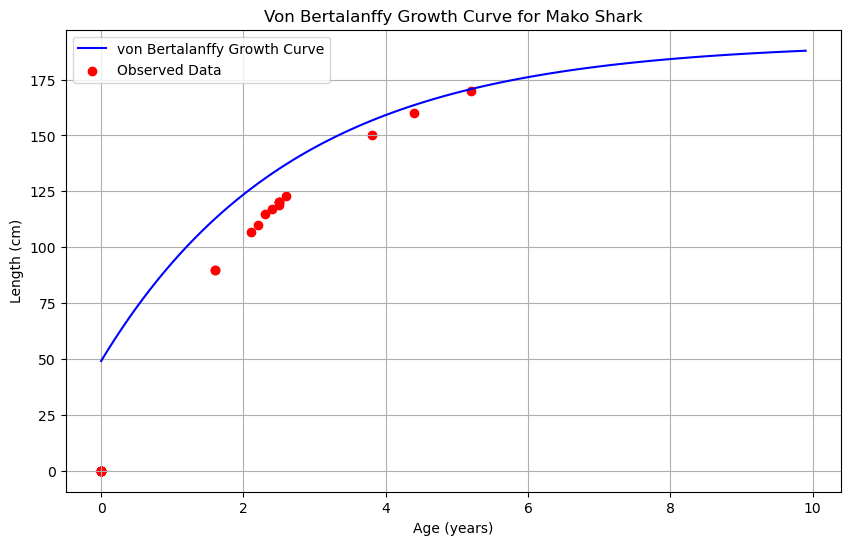

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Mako Shark data
mako_df = df[df['Spp.'].str.contains("Mako", na=False)]

# Combine lengths from different columns for Mako Shark
mako_lengths = pd.concat([
    mako_df['Individual # 1 Length (cm)'],
    mako_df['Individual # 2 Length (cm)'],
    mako_df['Individual # 3 Length (cm)']
]).dropna()

# Mako Shark growth parameters
a = 0.000011
b = 3.15

# Von Bertalanffy Growth Function for Mako Shark
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in mako_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Mako Shark:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((mako_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Mako Shark')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
# output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Mako_Shark_Growth_Estimates.xlsx'
# results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Mako Shark (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           123.0                    2.6            123.709029
              2           120.0                    2.5            120.905956
              3           120.0                    2.5            120.905956
              4           117.0                    2.4            118.046978
              5            90.0                    1.6             92.112440
              6           107.0                    2.1            108.804857
              7            90.0                    1.6             92.112440
              8           119.0                    2.5            120.585185
              9           150.0                    3.8            150.510859
             10             0.0                    0.0              0.000000
             11           170.0                    5.2            170.729381
             12           1

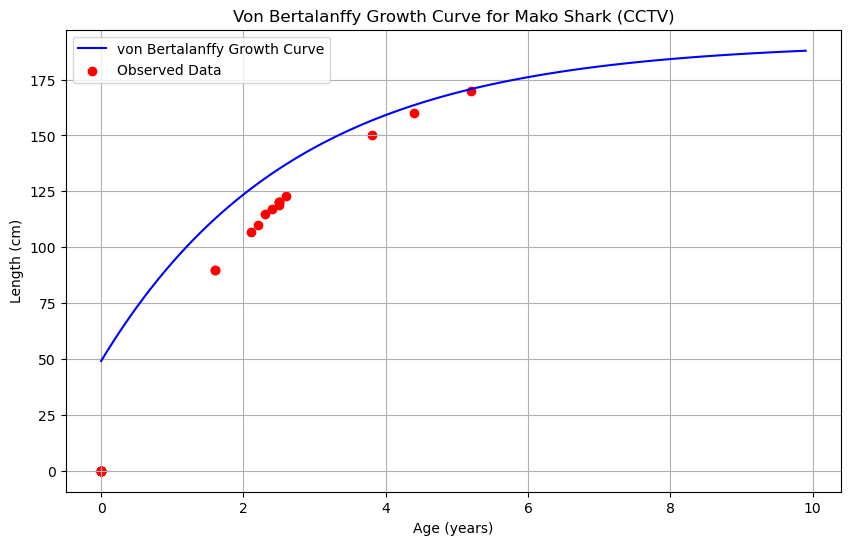

Detailed Growth Estimates for Mako Shark (Shellcatch):
Empty DataFrame
Columns: []
Index: []


KeyError: 'Estimated Age (years)'

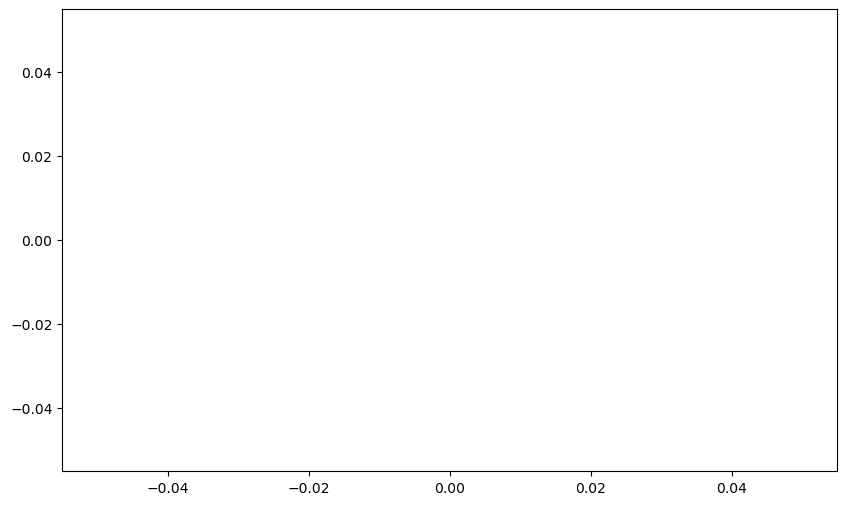

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Mako Shark data
mako_df = df[df['Spp.'].str.contains("Mako", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_mako_df = mako_df[mako_df['EMS'] == 'CCTV']
shellcatch_mako_df = mako_df[mako_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Mako Shark
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_mako_lengths = get_combined_lengths(cctv_mako_df)
shellcatch_mako_lengths = get_combined_lengths(shellcatch_mako_df)

# Mako Shark growth parameters
a = 0.000011
b = 3.15

# Von Bertalanffy Growth Function for Mako Shark
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Mako Shark ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Mako Shark ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_mako_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_mako_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Mako_Shark_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Mako_Shark_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


no catches reported in Shellcatch trial that is why the graph has not generated

# Growth Parameters for Swordfish

Growth Parameters for Swordfish: Defined the constants 
𝑎
=
0.000028
a=0.000028 and 
𝑏
=
2.89
b=2.89 for Swordfish.

Detailed Growth Estimates for Swordfish:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           146.0                    2.4            146.425173
              2             0.0                    0.0              0.000000
              3             0.0                    0.0              0.000000


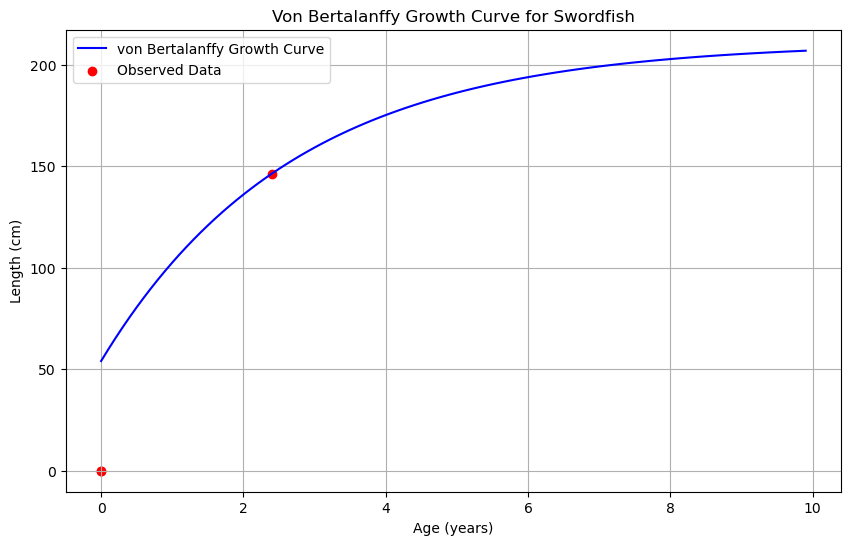

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Swordfish data
swordfish_df = df[df['Spp.'].str.contains("Swordfish", na=False)]

# Combine lengths from different columns for Swordfish
swordfish_lengths = pd.concat([
    swordfish_df['Individual # 1 Length (cm)'],
    swordfish_df['Individual # 2 Length (cm)'],
    swordfish_df['Individual # 3 Length (cm)']
]).dropna()

# Swordfish growth parameters
a = 0.000028
b = 2.89

# Von Bertalanffy Growth Function for Swordfish
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in swordfish_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Swordfish:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((swordfish_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Swordfish')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
# output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Swordfish_Growth_Estimates.xlsx'
# results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Swordfish (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           146.0                    2.4            146.425173
              2             0.0                    0.0              0.000000
              3             0.0                    0.0              0.000000


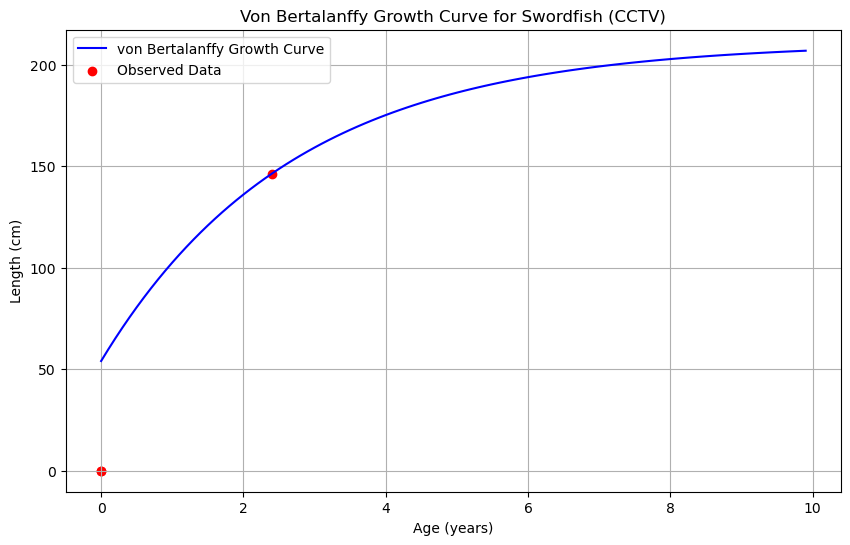

Detailed Growth Estimates for Swordfish (Shellcatch):
Empty DataFrame
Columns: []
Index: []


KeyError: 'Estimated Age (years)'

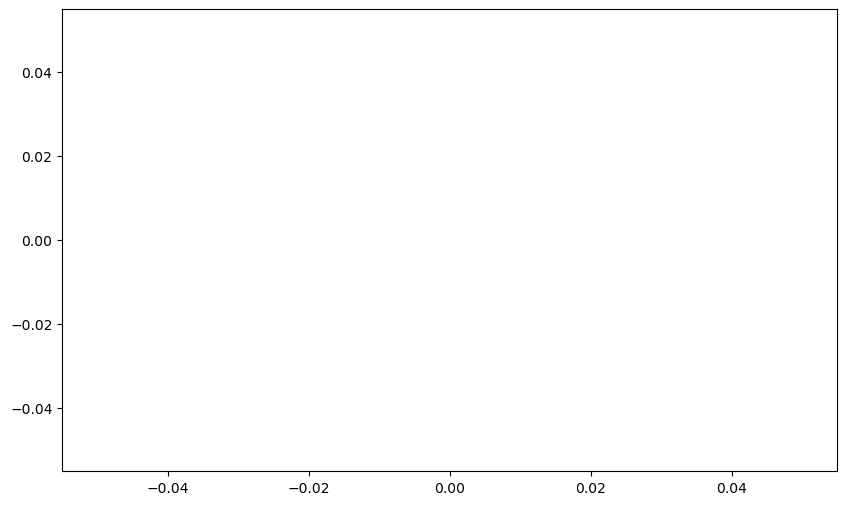

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Swordfish data
swordfish_df = df[df['Spp.'].str.contains("Swordfish", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_swordfish_df = swordfish_df[swordfish_df['EMS'] == 'CCTV']
shellcatch_swordfish_df = swordfish_df[swordfish_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Swordfish
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_swordfish_lengths = get_combined_lengths(cctv_swordfish_df)
shellcatch_swordfish_lengths = get_combined_lengths(shellcatch_swordfish_df)

# Swordfish growth parameters
a = 0.000028
b = 2.89

# Von Bertalanffy Growth Function for Swordfish
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Swordfish ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Swordfish ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_swordfish_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_swordfish_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Swordfish_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Swordfish_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


no catches reported in Shellcatch trial that is why the graph has not generated

# Growth Parameters for Marlin Spp.

Growth Parameters for Marlin Spp.: Defined the constants 
𝑎
=
0.0000163
a=0.0000163 and 
𝑏
=
2.96
b=2.96 for Marlin Spp.

Detailed Growth Estimates for Marlin Spp.:
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           246.0                    6.2            246.254887
              2           130.0                    1.8            132.608954
              3           169.0                    2.7            170.281054
              4           146.0                    2.1            146.873312
              5           194.0                    3.5            195.647819
              6           173.0                    2.8            173.983815
              7           210.0                    4.1            211.192327
              8           230.0                    5.1            230.916129
              9           236.0                    5.4            236.042335
             10           150.0                    2.2            151.018706
             11           215.0                    4.3            215.838465
             12           150.0  

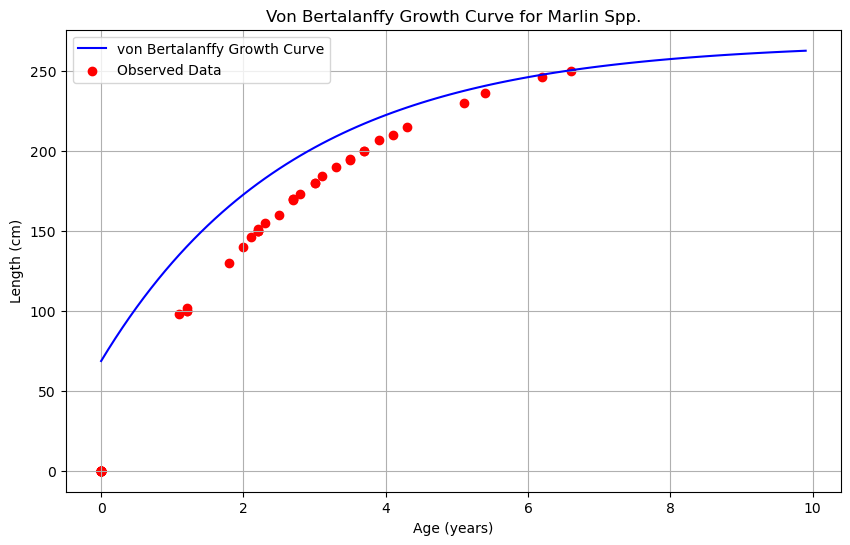

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Marlin Spp. data
marlin_df = df[df['Spp.'].str.contains("Marlin", na=False)]

# Combine lengths from different columns for Marlin Spp.
marlin_lengths = pd.concat([
    marlin_df['Individual # 1 Length (cm)'],
    marlin_df['Individual # 2 Length (cm)'],
    marlin_df['Individual # 3 Length (cm)']
]).dropna()

# Marlin Spp. growth parameters
a = 0.0000163
b = 2.96

# Von Bertalanffy Growth Function for Marlin Spp.
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Create a DataFrame to store the results
results = []

# Calculate the age for each length
for length in marlin_lengths:
    age, expected_length = calculate_length_at_age(length, a, b)
    results.append({
        'Serial Number': len(results) + 1,
        'Length (cm)': length,
        'Estimated Age (years)': age,
        'Expected Length (cm)': expected_length
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in a detailed table format with better alignment
print("Detailed Growth Estimates for Marlin Spp.:")
print(results_df.to_string(index=False, col_space=15))

# Plotting the von Bertalanffy growth curve
ages = np.arange(0, 10, 0.1)
growth_curve = [von_bertalanffy((marlin_lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

plt.figure(figsize=(10, 6))
plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
plt.xlabel('Age (years)')
plt.ylabel('Length (cm)')
plt.title('Von Bertalanffy Growth Curve for Marlin Spp.')
plt.legend()
plt.grid(True)
plt.show()

# Optionally, save the results to a new Excel file
# output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Marlin_Spp_Growth_Estimates.xlsx'
# results_df.to_excel(output_file_path, index=False)


Detailed Growth Estimates for Marlin Spp. (CCTV):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           246.0                    6.2            246.254887
              2           130.0                    1.8            132.608954
              3           169.0                    2.7            170.281054
              4           146.0                    2.1            146.873312
              5           194.0                    3.5            195.647819
              6           173.0                    2.8            173.983815
              7           210.0                    4.1            211.192327
              8           230.0                    5.1            230.916129
              9           236.0                    5.4            236.042335
             10           150.0                    2.2            151.018706
             11           215.0                    4.3            215.838465
             12           

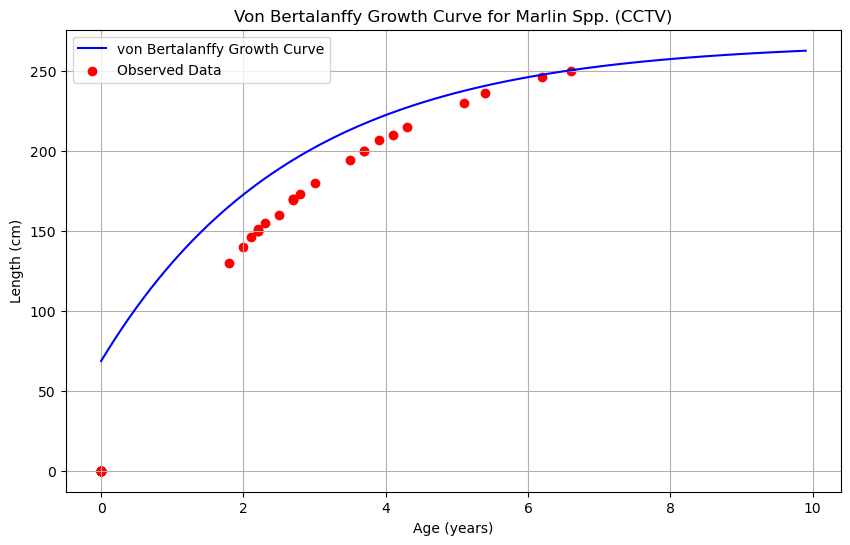

Detailed Growth Estimates for Marlin Spp. (Shellcatch):
  Serial Number     Length (cm)  Estimated Age (years)  Expected Length (cm)
              1           184.0                    3.1            184.337944
              2           100.0                    1.2            102.703903
              3            98.0                    1.1             98.496995
              4           190.0                    3.3            190.457977
              5           180.0                    3.0            180.841230
              6             0.0                    0.0              0.000000
              7           102.0                    1.2            103.393303
              8           100.0                    1.2            102.703903
              9             0.0                    0.0              0.000000
             10             0.0                    0.0              0.000000
             11             0.0                    0.0              0.000000
             12     

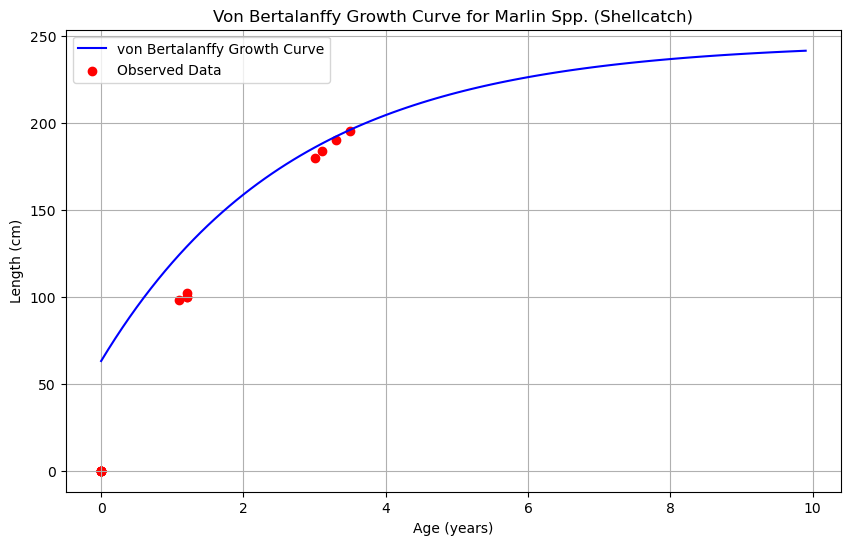

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Marlin Spp. data
marlin_df = df[df['Spp.'].str.contains("Marlin", na=False)]

# Filter separately for CCTV and Shellcatch from EMS column
cctv_marlin_df = marlin_df[marlin_df['EMS'] == 'CCTV']
shellcatch_marlin_df = marlin_df[marlin_df['EMS'] == 'Shellcatch']

# Combine lengths from different columns for Marlin Spp.
def get_combined_lengths(df):
    return pd.concat([
        df['Individual # 1 Length (cm)'],
        df['Individual # 2 Length (cm)'],
        df['Individual # 3 Length (cm)']
    ]).dropna()

cctv_marlin_lengths = get_combined_lengths(cctv_marlin_df)
shellcatch_marlin_lengths = get_combined_lengths(shellcatch_marlin_df)

# Marlin Spp. growth parameters
a = 0.0000163
b = 2.96

# Von Bertalanffy Growth Function for Marlin Spp.
def von_bertalanffy(L_inf, K, t, t_0):
    return L_inf * (1 - np.exp(-K * (t - t_0)))

# Function to calculate the expected length at different ages
def calculate_length_at_age(length, a, b):
    L_inf = (length / a) ** (1 / b)
    K = 0.37  # Assume a similar growth rate
    t_0 = -0.8  # Assume a similar t_0
    ages = np.arange(0, 11, 0.1)
    for t in ages:
        expected_length = von_bertalanffy(L_inf, K, t, t_0)
        if expected_length >= length:
            return t, expected_length
    return ages[-1], von_bertalanffy(L_inf, K, ages[-1], t_0)

# Function to process and plot data
def process_and_plot_data(lengths, title):
    results = []
    for length in lengths:
        age, expected_length = calculate_length_at_age(length, a, b)
        results.append({
            'Serial Number': len(results) + 1,
            'Length (cm)': length,
            'Estimated Age (years)': age,
            'Expected Length (cm)': expected_length
        })
    results_df = pd.DataFrame(results)

    # Display the results in a detailed table format with better alignment
    print(f"Detailed Growth Estimates for Marlin Spp. ({title}):")
    print(results_df.to_string(index=False, col_space=15))

    # Plotting the von Bertalanffy growth curve
    ages = np.arange(0, 10, 0.1)
    growth_curve = [von_bertalanffy((lengths.max() / a) ** (1 / b), 0.37, t, -0.8) for t in ages]

    plt.figure(figsize=(10, 6))
    plt.plot(ages, growth_curve, label='von Bertalanffy Growth Curve', color='b')
    plt.scatter(results_df['Estimated Age (years)'], results_df['Length (cm)'], color='r', label='Observed Data')
    plt.xlabel('Age (years)')
    plt.ylabel('Length (cm)')
    plt.title(f'Von Bertalanffy Growth Curve for Marlin Spp. ({title})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results_df

# Process and plot data for CCTV
cctv_results_df = process_and_plot_data(cctv_marlin_lengths, 'CCTV')

# Process and plot data for Shellcatch
shellcatch_results_df = process_and_plot_data(shellcatch_marlin_lengths, 'Shellcatch')

# Optionally, save the results to new Excel files
# cctv_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Marlin_Spp_CCTV_Growth_Estimates.xlsx'
# shellcatch_output_file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\Marlin_Spp_Shellcatch_Growth_Estimates.xlsx'
# cctv_results_df.to_excel(cctv_output_file_path, index=False)
# shellcatch_results_df.to_excel(shellcatch_output_file_path, index=False)


# Area Based Reporting

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\105272228.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\105272228.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\105272228.py:30: FutureW

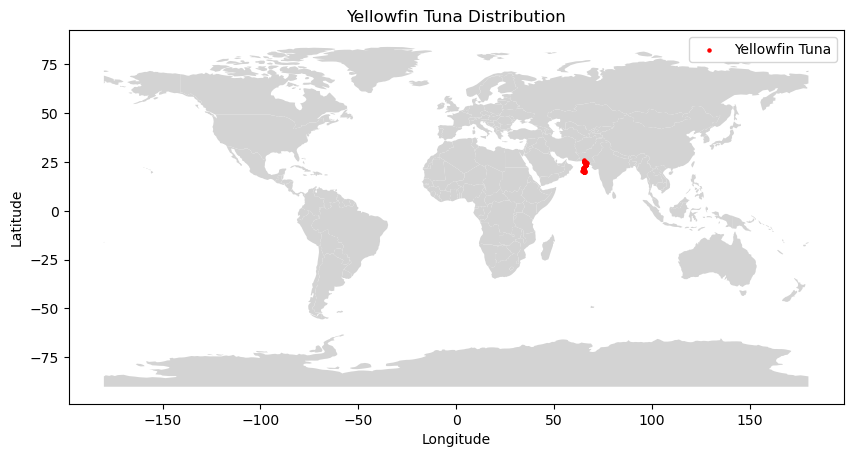

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Yellowfin Tuna data
yellowfin_df = df[df['Spp.'].str.contains("Yellowfin", na=False)]

# Plotting the Yellowfin Tuna data on a map using GPS coordinates
def plot_yellowfin_map(yellowfin_df):
    # Ensure the GPS coordinate columns are numeric
    yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
    yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')
    
    # Drop rows with missing GPS coordinates
    yellowfin_df = yellowfin_df.dropna(subset=['Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame(
        yellowfin_df, 
        geometry=gpd.points_from_xy(yellowfin_df['Decimal_Start_Net_E'], yellowfin_df['Decimal_Start_Net_N'])
    )

    # Load a world map
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Plotting the map
    fig, ax = plt.subplots(figsize=(10, 10))
    world.plot(ax=ax, color='lightgrey')
    gdf.plot(ax=ax, color='red', markersize=5, label='Yellowfin Tuna')
    plt.title('Yellowfin Tuna Distribution')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.legend()
    plt.show()

plot_yellowfin_map(yellowfin_df)


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\2957324139.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\2957324139.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\2957324139.py:31: Futu

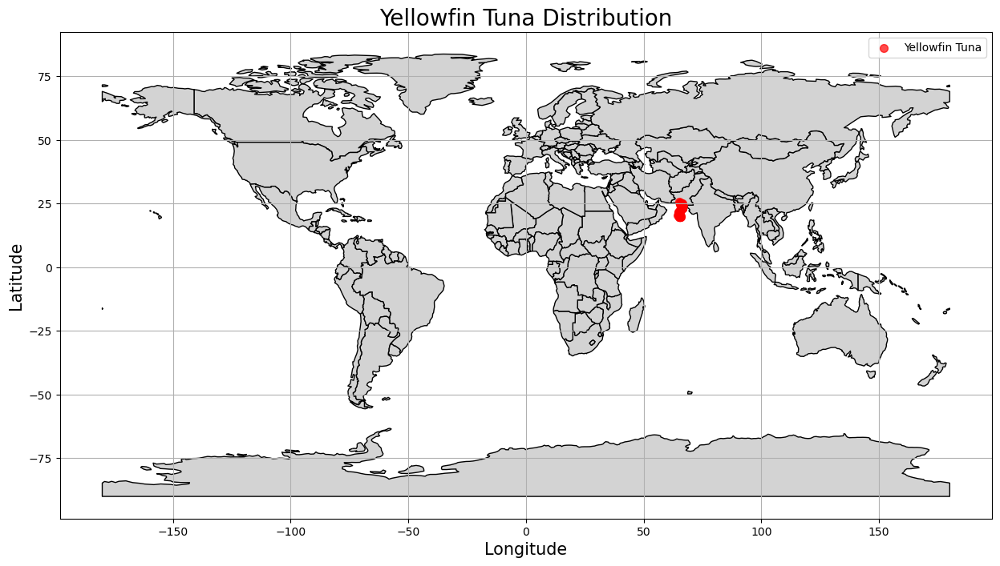

In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Yellowfin Tuna data
yellowfin_df = df[df['Spp.'].str.contains("Yellowfin", na=False)]

# Plotting the Yellowfin Tuna data on a map using GPS coordinates
def plot_yellowfin_map(yellowfin_df):
    # Ensure the GPS coordinate columns are numeric
    yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
    yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')
    
    # Drop rows with missing GPS coordinates
    yellowfin_df = yellowfin_df.dropna(subset=['Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame(
        yellowfin_df, 
        geometry=gpd.points_from_xy(yellowfin_df['Decimal_Start_Net_E'], yellowfin_df['Decimal_Start_Net_N']),
        crs="EPSG:4326"  # Set the coordinate reference system to WGS84
    )

    # Load a world map
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Plotting the map
    fig, ax = plt.subplots(figsize=(15, 15))
    world.plot(ax=ax, color='lightgrey', edgecolor='black')
    gdf.plot(ax=ax, color='red', markersize=50, alpha=0.7, marker='o', label='Yellowfin Tuna')
    
    plt.title('Yellowfin Tuna Distribution', fontsize=20)
    plt.xlabel('Longitude', fontsize=15)
    plt.ylabel('Latitude', fontsize=15)
    plt.grid(True)
    plt.legend()
    plt.show()

plot_yellowfin_map(yellowfin_df)


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3026801557.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3026801557.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3026801557.py:33: Futu

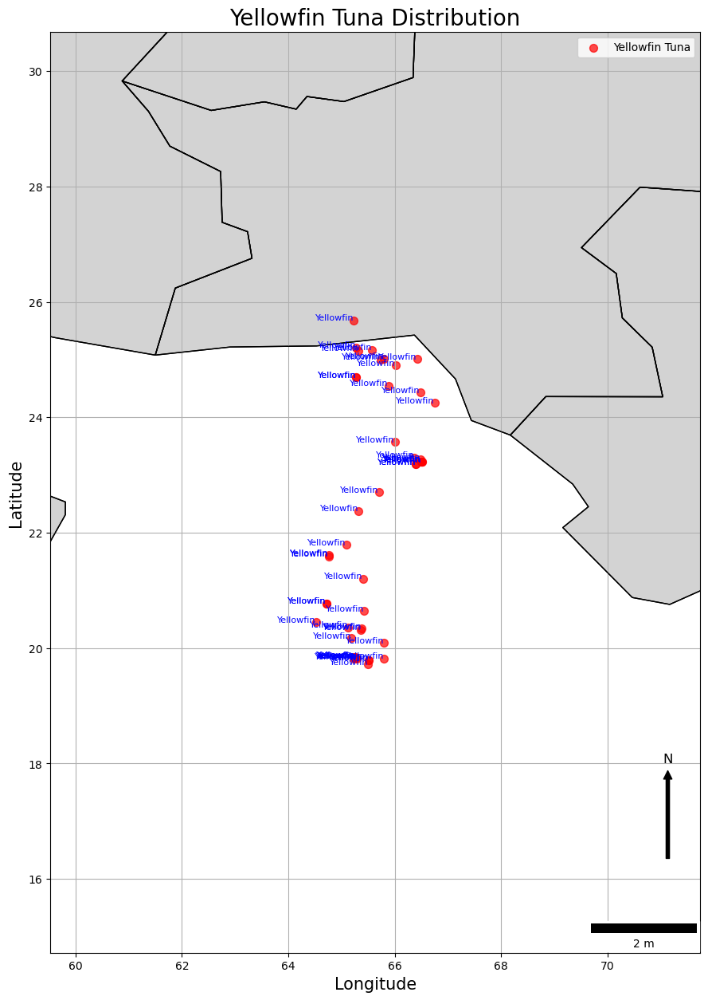

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import matplotlib_scalebar.scalebar as sb
from matplotlib.patches import FancyArrowPatch

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter the Yellowfin Tuna data
yellowfin_df = df[df['Spp.'].str.contains("Yellowfin", na=False)]

# Ensure the GPS coordinate columns are numeric
yellowfin_df['Decimal_Start_Net_N'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_N'], errors='coerce')
yellowfin_df['Decimal_Start_Net_E'] = pd.to_numeric(yellowfin_df['Decimal_Start_Net_E'], errors='coerce')

# Drop rows with missing GPS coordinates
yellowfin_df = yellowfin_df.dropna(subset=['Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(
    yellowfin_df,
    geometry=gpd.points_from_xy(yellowfin_df['Decimal_Start_Net_E'], yellowfin_df['Decimal_Start_Net_N']),
    crs="EPSG:4326"  # Set the coordinate reference system to WGS84
)

# Plotting the Yellowfin Tuna data on a map using GPS coordinates
def plot_yellowfin_map(gdf):
    # Load a world map
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Plotting the map
    fig, ax = plt.subplots(figsize=(15, 15))
    world.boundary.plot(ax=ax, linewidth=1, edgecolor='black')
    world.plot(ax=ax, color='lightgrey', edgecolor='black')

    # Plot Yellowfin Tuna points
    gdf.plot(ax=ax, color='red', markersize=50, alpha=0.7, marker='o', label='Yellowfin Tuna')

    # Adding labels to a few points (optional, if you want to label specific points)
    for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf['Spp.']):
        ax.text(x, y, label, fontsize=8, ha='right', color='blue')

    # Set x and y axis limits to zoom in on the area of interest
    ax.set_xlim(gdf.geometry.x.min() - 5, gdf.geometry.x.max() + 5)
    ax.set_ylim(gdf.geometry.y.min() - 5, gdf.geometry.y.max() + 5)

    # Adding a scale bar
    scale_bar = sb.ScaleBar(1, location='lower right')
    ax.add_artist(scale_bar)

    # Adding a north arrow
    arrow = FancyArrowPatch((0.95, 0.1), (0.95, 0.2), transform=ax.transAxes,
                            color='black', mutation_scale=15)
    ax.annotate('N', xy=(0.95, 0.21), xycoords='axes fraction', fontsize=12,
                ha='center', va='center')
    ax.add_patch(arrow)

    plt.title('Yellowfin Tuna Distribution', fontsize=20)
    plt.xlabel('Longitude', fontsize=15)
    plt.ylabel('Latitude', fontsize=15)
    plt.grid(True)
    plt.legend()
    plt.show()

plot_yellowfin_map(gdf)


In [58]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster, HeatMap
from shapely.geometry import Point
from folium.features import DivIcon

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter rows with missing 'Spp.' or GPS coordinates
df = df.dropna(subset=['Spp.', 'Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

# Merge the length columns
df['Length (cm)'] = df[['Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)']].mean(axis=1)

# Ensure the GPS coordinate columns are numeric
df['Decimal_Start_Net_N'] = pd.to_numeric(df['Decimal_Start_Net_N'], errors='coerce')
df['Decimal_Start_Net_E'] = pd.to_numeric(df['Decimal_Start_Net_E'], errors='coerce')

# Drop rows with missing GPS coordinates
df = df.dropna(subset=['Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['Decimal_Start_Net_E'], df['Decimal_Start_Net_N']),
    crs="EPSG:4326"  # Set the coordinate reference system to WGS84
)

# Define a function to get the icon color based on an attribute
def get_icon_color(attribute):
    color_dict = {
        'Yellowfin Tuna': 'blue',
        'Skipjack Tuna': 'green',
        'Bullet Tuna': 'red',
        'Frigate Tuna': 'red',
        'Kawakawa': 'purple',
        'Spanish Mackerel': 'orange',
        'Dolphinfish': 'pink',
        'Mako Shark': 'black',
        'Swordfish': 'brown',
        'Marlin': 'gray',
        'Shark': 'cyan',
        'Tuna': 'magenta',
        'Trash Fish': 'olive'
    }
    return color_dict.get(attribute, 'gray')

# Create a folium map centered around the mean coordinates
m = folium.Map(location=[gdf.geometry.y.mean(), gdf.geometry.x.mean()], zoom_start=5)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add points to the map with detailed popups and circle markers
for _, row in gdf.iterrows():
    popup_content = (f"<b>Spp:</b> {row['Spp.']}<br>"
                     f"<b>Latitude:</b> {row.geometry.y}<br>"
                     f"<b>Longitude:</b> {row.geometry.x}<br>"
                     f"<b>Length (cm):</b> {row['Length (cm)']}<br>"
                     f"<b>Start Net Lat:</b> {row['Decimal_Start_Net_N']}<br>"
                     f"<b>Start Net Lon:</b> {row['Decimal_Start_Net_E']}<br>")

    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        icon=folium.Icon(color=get_icon_color(row['Spp.']), icon='circle'),
        popup=folium.Popup(popup_content, max_width=300)
    ).add_to(marker_cluster)
    
    # Determine the radius based on the length of the fish
    radius = row['Length (cm)'] / 10  # Adjust the divisor as needed

    # Add circle markers with varying radius
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=radius,
        color=get_icon_color(row['Spp.']),
        fill=True,
        fill_color=get_icon_color(row['Spp.']),
        fill_opacity=0.6
    ).add_to(m)

# Add heatmap layer
heat_data = [[row.geometry.y, row.geometry.x] for index, row in gdf.iterrows()]
HeatMap(heat_data, radius=20, blur=15, max_zoom=1).add_to(m)

# Add tile layers with attributions
folium.TileLayer('Stamen Terrain', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('Stamen Toner', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('Stamen Watercolor', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('CartoDB positron', attr='Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('CartoDB dark_matter', attr='Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Add a legend with colored circles
legend_html = """
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 250px; height: 300px; 
     border:2px solid grey; z-index:9999; font-size:14px; background-color: white;">
     &nbsp; <b>Legend</b> <br>
     &nbsp; <span style="color: blue; font-size: 20px;">&#9679;</span> Yellowfin Tuna<br>
     &nbsp; <span style="color: green; font-size: 20px;">&#9679;</span> Skipjack Tuna<br>
     &nbsp; <span style="color: red; font-size: 20px;">&#9679;</span> Bullet Tuna<br>
     &nbsp; <span style="color: red; font-size: 20px;">&#9679;</span> Frigate Tuna<br>
     &nbsp; <span style="color: purple; font-size: 20px;">&#9679;</span> Kawakawa<br>
     &nbsp; <span style="color: orange; font-size: 20px;">&#9679;</span> Spanish Mackerel<br>
     &nbsp; <span style="color: pink; font-size: 20px;">&#9679;</span> Dolphinfish<br>
     &nbsp; <span style="color: black; font-size: 20px;">&#9679;</span> Mako Shark<br>
     &nbsp; <span style="color: brown; font-size: 20px;">&#9679;</span> Swordfish<br>
     &nbsp; <span style="color: gray; font-size: 20px;">&#9679;</span> Marlin<br>
     &nbsp; <span style="color: cyan; font-size: 20px;">&#9679;</span> Shark<br>
     &nbsp; <span style="color: magenta; font-size: 20px;">&#9679;</span> Tuna<br>
     &nbsp; <span style="color: olive; font-size: 20px;">&#9679;</span> Trash Fish<br>
     &nbsp; <span style="color: gray; font-size: 20px;">&#9679;</span> Unknown Species
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Add a north arrow
north_arrow = folium.Marker(
    location=[gdf.geometry.y.max(), gdf.geometry.x.min()],
    icon=DivIcon(
        icon_size=(20,20),
        icon_anchor=(0,0),
        html='<div style="font-size: 24px; font-weight: bold;">N</div>',
    )
)
north_arrow.add_to(m)

# Save the map to an HTML file
m.save('yellowfin_tuna_distribution.html')

# Display the map
m


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\3168207723.py:68: UserWarning: color argument of Icon should be one of: {'red', 'beige', 'darkred', 'blue', 'orange', 'purple', 'black', 'lightgray', 'lightred', 'darkgreen', 'darkblue', 'darkpurple', 'white', 'pink', 'gray', 'lightblue', 'lightgreen', 'green', 'cadetblue'}.
  icon=folium.Icon(color=get_icon_color(row['Spp.']), icon='circle'),


In [59]:
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster, HeatMap, MeasureControl
from shapely.geometry import Point
from folium.features import DivIcon

# Load the Excel file from the new path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Filter rows with missing 'Spp.' or GPS coordinates
df = df.dropna(subset=['Spp.', 'Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

# Merge the length columns
df['Length (cm)'] = df[['Individual # 1 Length (cm)', 'Individual # 2 Length (cm)', 'Individual # 3 Length (cm)']].mean(axis=1)

# Ensure the GPS coordinate columns are numeric
df['Decimal_Start_Net_N'] = pd.to_numeric(df['Decimal_Start_Net_N'], errors='coerce')
df['Decimal_Start_Net_E'] = pd.to_numeric(df['Decimal_Start_Net_E'], errors='coerce')

# Drop rows with missing GPS coordinates
df = df.dropna(subset=['Decimal_Start_Net_N', 'Decimal_Start_Net_E'])

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['Decimal_Start_Net_E'], df['Decimal_Start_Net_N']),
    crs="EPSG:4326"  # Set the coordinate reference system to WGS84
)

# Define a function to get the icon color based on an attribute
def get_icon_color(attribute):
    color_dict = {
        'Yellowfin Tuna': 'blue',
        'Skipjack Tuna': 'green',
        'Bullet Tuna': 'red',
        'Frigate Tuna': 'red',
        'Kawakawa': 'purple',
        'Spanish Mackerel': 'orange',
        'Dolphinfish': 'pink',
        'Mako Shark': 'black',
        'Swordfish': 'brown',
        'Marlin': 'gray',
        'Shark': 'cyan',
        'Tuna': 'magenta',
        'Trash Fish': 'olive',
        'Other Species': 'gray'
    }
    return color_dict.get(attribute, 'gray')

# Create a folium map centered around the mean coordinates
m = folium.Map(location=[gdf.geometry.y.mean(), gdf.geometry.x.mean()], zoom_start=5)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add points to the map with detailed popups and circle markers
for _, row in gdf.iterrows():
    popup_content = (f"<b>Spp:</b> {row['Spp.']}<br>"
                     f"<b>Latitude:</b> {row.geometry.y}<br>"
                     f"<b>Longitude:</b> {row.geometry.x}<br>"
                     f"<b>Length (cm):</b> {row['Length (cm)']}<br>"
                     f"<b>Start Net Lat:</b> {row['Decimal_Start_Net_N']}<br>"
                     f"<b>Start Net Lon:</b> {row['Decimal_Start_Net_E']}<br>")

    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        icon=folium.Icon(color=get_icon_color(row['Spp.']), icon='circle'),
        popup=folium.Popup(popup_content, max_width=300)
    ).add_to(marker_cluster)
    
    # Determine the radius based on the length of the fish
    radius = row['Length (cm)'] / 10  # Adjust the divisor as needed

    # Add circle markers with varying radius
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=radius,
        color=get_icon_color(row['Spp.']),
        fill=True,
        fill_color=get_icon_color(row['Spp.']),
        fill_opacity=0.6
    ).add_to(m)

# Add heatmap layer
heat_data = [[row.geometry.y, row.geometry.x] for index, row in gdf.iterrows()]
HeatMap(heat_data, radius=20, blur=15, max_zoom=1).add_to(m)

# Add tile layers with attributions
folium.TileLayer('Stamen Terrain', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('Stamen Toner', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('Stamen Watercolor', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('CartoDB positron', attr='Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('CartoDB dark_matter', attr='Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Add a legend with colored circles
legend_html = """
<div style="position: fixed; 
     bottom: 50px; right: 10px; width: 250px; height: 370px; 
     border:2px solid grey; z-index:9999; font-size:14px; background-color: white;">
     &nbsp; <b>Legend</b> <br>
     &nbsp; <span style="color: blue; font-size: 20px;">&#9679;</span> Yellowfin Tuna<br>
     &nbsp; <span style="color: green; font-size: 20px;">&#9679;</span> Skipjack Tuna<br>
     &nbsp; <span style="color: red; font-size: 20px;">&#9679;</span> Bullet Tuna<br>
     &nbsp; <span style="color: red; font-size: 20px;">&#9679;</span> Frigate Tuna<br>
     &nbsp; <span style="color: purple; font-size: 20px;">&#9679;</span> Kawakawa<br>
     &nbsp; <span style="color: orange; font-size: 20px;">&#9679;</span> Spanish Mackerel<br>
     &nbsp; <span style="color: pink; font-size: 20px;">&#9679;</span> Dolphinfish<br>
     &nbsp; <span style="color: black; font-size: 20px;">&#9679;</span> Mako Shark<br>
     &nbsp; <span style="color: brown; font-size: 20px;">&#9679;</span> Swordfish<br>
     &nbsp; <span style="color: gray; font-size: 20px;">&#9679;</span> Marlin<br>
     &nbsp; <span style="color: cyan; font-size: 20px;">&#9679;</span> Shark<br>
     &nbsp; <span style="color: magenta; font-size: 20px;">&#9679;</span> Tuna<br>
     &nbsp; <span style="color: olive; font-size: 20px;">&#9679;</span> Trash Fish<br>
     &nbsp; <span style="color: gray; font-size: 20px;">&#9679;</span> Other Species<br>
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Add a north arrow and scale bar to the right bottom
north_arrow = folium.Marker(
    location=[gdf.geometry.y.max(), gdf.geometry.x.min()],
    icon=DivIcon(
        icon_size=(30,30),
        icon_anchor=(0,0),
        html='<div style="font-size: 24px; font-weight: bold;">N</div>',
    )
)
north_arrow.add_to(m)

# Add Measure Control
measure_control = MeasureControl(
    primary_length_unit='kilometers',
    secondary_length_unit='miles',
    primary_area_unit='sqmeters',
    secondary_area_unit='acres',
    position='bottomright'
)
m.add_child(measure_control)

# Save the map to an HTML file
m.save('yellowfin_tuna_distribution.html')

# Display the map
m


C:\Users\Shoaib\AppData\Local\Temp\ipykernel_5196\902406042.py:69: UserWarning: color argument of Icon should be one of: {'red', 'beige', 'darkred', 'blue', 'orange', 'purple', 'black', 'lightgray', 'lightred', 'darkgreen', 'darkblue', 'darkpurple', 'white', 'pink', 'gray', 'lightblue', 'lightgreen', 'green', 'cadetblue'}.
  icon=folium.Icon(color=get_icon_color(row['Spp.']), icon='circle'),
